# Medically Underserved Areas Project
## Analysis of Census Data

Author: Rishab Srivastava

Date: 11/10

Reading in county-level data, specifically for the age>=65 and poverty indicators.

In [2]:
import sys
if sys.version_info[0] < 3:
    raise Exception("Python 3 not detected.")

import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import NullFormatter
from scipy import io
from scipy import stats
import pandas as pd
import seaborn as sns
from collections import defaultdict
import dataframe_image as dfi
from numpy.polynomial.polynomial import polyfit


import warnings
warnings.filterwarnings("ignore")

import plotly.express as px
import binscatter
import geopandas
import descartes

In [3]:
data = pd.read_csv("../MUA_Exploratory_Analysis/input/MUA_DET.csv", dtype={'Common State County FIPS Code': str, 'State and County Federal Information Processing Standard Code': str})
data.drop("Unnamed: 64", inplace=True, axis=1)
data.head(20)

,MUA/P ID,MUA/P Area Code,MUA/P Service Area Name,Designation Type Code,Designation Type,MUA/P Status Code,MUA/P Status Description,Designation Date,MUA/P Designation Date String,MUA/P Update Date,...,Primary State Name,Common Region Code,Common Region Name,Common State Name,Common State Abbreviation,Common State FIPS Code,Common State County FIPS Code,Common County Name,Data Warehouse Record Create Date,Data Warehouse Record Create Date Text
0,1483700501,48201222600,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
1,1483700501,48201222700,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
2,1483700501,48201222800,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
3,1483700501,48201222502,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
4,1483700501,48201222900,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
5,1483700501,48201223001,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
6,1483700501,48201223002,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
7,1483700501,48201223100,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
8,1483700501,48201220100,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24
9,1483700501,48201220700,Houston-North,MUA,Medically Underserved Area,D,Designated,09/06/2019,2019/09/06,09/06/2019,...,Texas,6,Region 6,Texas,TX,48,48201,"Harris County, TX",10/24/2020,2020/10/24


In [4]:
date_cols = ["Designation Date", "MUA/P Designation Date String", "MUA/P Update Date", "MUA/P Update Date String", "Data Warehouse Record Create Date", "Data Warehouse Record Create Date Text"]
for date_col in date_cols:
    data[date_col]= pd.to_datetime(data[date_col])

In [5]:
data.shape

(19751, 64)

In [6]:
data.columns

Index(['MUA/P ID', 'MUA/P Area Code', 'MUA/P Service Area Name',
       'Designation Type Code', 'Designation Type', 'MUA/P Status Code',
       'MUA/P Status Description', 'Designation Date',
       'MUA/P Designation Date String', 'MUA/P Update Date',
       'MUA/P Update Date String',
       'Medically Underserved Area/Population (MUA/P) Withdrawal Date',
       'Medically Underserved Area/Population (MUA/P) Withdrawal Date in Text Format',
       'Break in Designation', 'IMU Score', 'MUA/P Population Type Code',
       'Population Type',
       'Medically Underserved Area/Population (MUA/P) Metropolitan Indicator',
       'Medically Underserved Area/Population (MUA/P) Metropolitan Description',
       'Medically Underserved Area/Population (MUA/P) Component Geographic Name',
       'Medically Underserved Area/Population (MUA/P) Component Geographic Type Code',
       'Medically Underserved Area/Population (MUA/P) Component Geographic Type Description',
       'HHS Region Code', 'HH

In [7]:
# Histogram of number of counties designated in each year
single_county = data[data["Medically Underserved Area/Population (MUA/P) Component Geographic Type Description"]=="Single County"]
single_county["Year"] = single_county["MUA/P Designation Date String"].dt.year
single_county_gp = single_county.groupby("Year").count().reset_index()[["Year", "MUA/P ID"]]
single_county_gp

,Year,MUA/P ID
0,1978,1310
1,1981,11
2,1982,18
3,1983,3
4,1984,34
5,1988,4
6,1990,7
7,1991,2
8,1992,33
9,1993,17


In [8]:
# Histogram of number of counties designated in each year
single_county = data[data["Medically Underserved Area/Population (MUA/P) Component Geographic Type Description"]=="Single County"]
single_county["Year"] = single_county["MUA/P Designation Date String"].dt.year
single_county_gp = single_county.groupby("Year").count().reset_index()[["Year", "MUA/P ID"]]
single_county_gp

,Year,MUA/P ID
0,1978,1310
1,1981,11
2,1982,18
3,1983,3
4,1984,34
5,1988,4
6,1990,7
7,1991,2
8,1992,33
9,1993,17


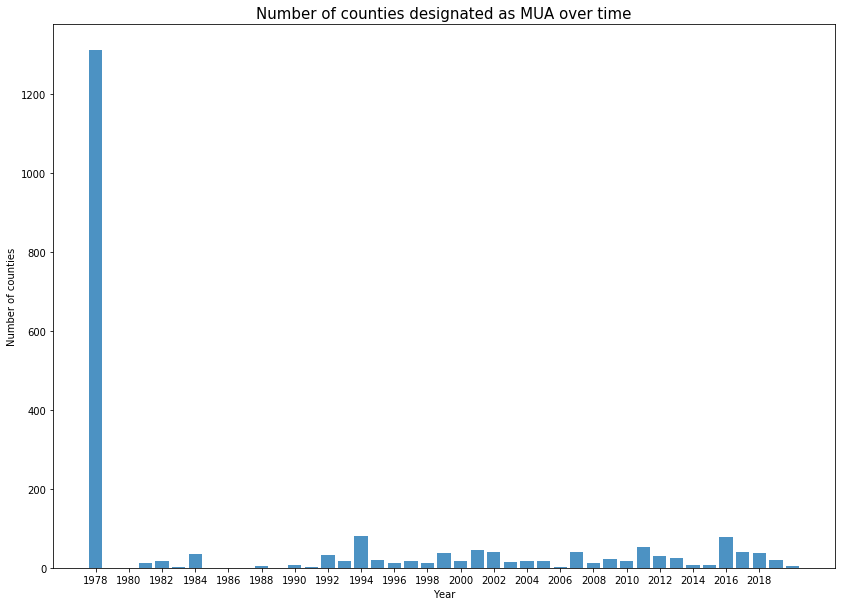

In [9]:
plt.figure(figsize=[14,10])
plt.title('Number of counties designated as MUA over time',fontsize=15)
plt.xlabel("Year")
plt.ylabel("Number of counties")
plt.bar(single_county_gp["Year"], single_county_gp["MUA/P ID"], align='center', alpha=0.8)
plt.xticks(np.arange(single_county_gp["Year"][0], single_county_gp["Year"][len(single_county_gp["Year"])-1], 2))
plt.savefig('images/single_county.png',bbox_inches='tight');

In [10]:
# Histogram of number of census tracks designated in each year
census_tracts = data[data["Medically Underserved Area/Population (MUA/P) Component Geographic Type Description"]=="Census Tract"]
census_tracts["Year"] = census_tracts["MUA/P Designation Date String"].dt.year
census_tracts_gp = census_tracts.groupby("Year").count().reset_index()[["Year", "MUA/P ID"]]
census_tracts_gp

,Year,MUA/P ID
0,1978,246
1,1979,4
2,1980,21
3,1981,95
4,1982,877
5,1983,62
6,1984,373
7,1985,146
8,1986,20
9,1988,77


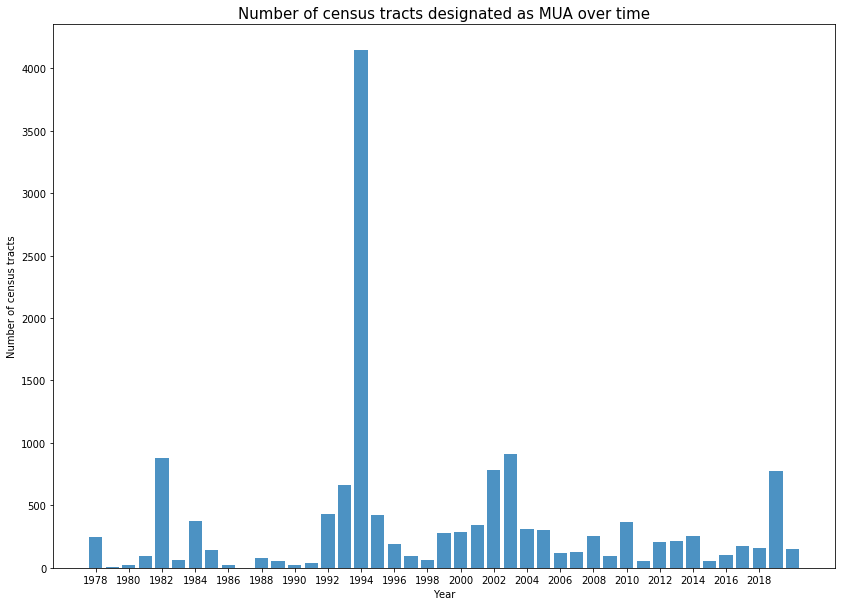

In [11]:
plt.figure(figsize=[14,10])
plt.title('Number of census tracts designated as MUA over time',fontsize=15)
plt.xlabel("Year")
plt.ylabel("Number of census tracts")
plt.bar(census_tracts_gp["Year"], census_tracts_gp["MUA/P ID"], align='center', alpha=0.8)
plt.xticks(np.arange(census_tracts_gp["Year"][0], census_tracts_gp["Year"][len(census_tracts_gp["Year"])-1], 2))
plt.savefig('images/census_tracts.png',bbox_inches='tight');

In [12]:
# Histogram of number of county subdivisions designated in each year
county_sub = data[data["Medically Underserved Area/Population (MUA/P) Component Geographic Type Description"]=="County Subdivision"]
county_sub["Year"] = county_sub["MUA/P Designation Date String"].dt.year
county_sub_gp = county_sub.groupby("Year").count().reset_index()[["Year", "MUA/P ID"]]
county_sub_gp

,Year,MUA/P ID
0,1977,5
1,1978,6
2,1980,1
3,1981,52
4,1982,179
5,1983,15
6,1984,118
7,1985,42
8,1986,3
9,1987,3


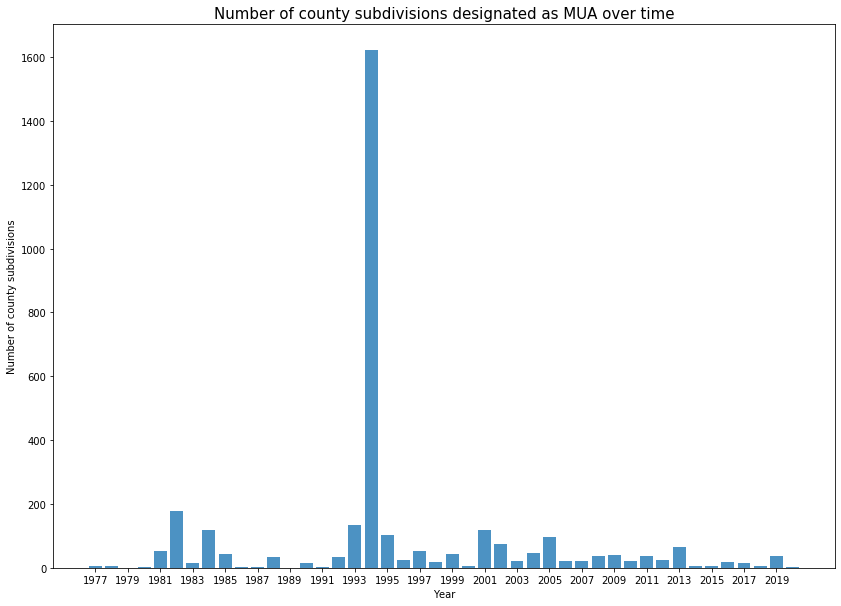

In [13]:
plt.figure(figsize=[14,10])
plt.title('Number of county subdivisions designated as MUA over time',fontsize=15)
plt.xlabel("Year")
plt.ylabel("Number of county subdivisions")
plt.bar(county_sub_gp["Year"], county_sub_gp["MUA/P ID"], align='center', alpha=0.8)
plt.xticks(np.arange(county_sub_gp["Year"][0], county_sub_gp["Year"][len(county_sub_gp["Year"])-1], 2))
plt.savefig('images/county_subdivisions.png',bbox_inches='tight');

In [14]:
# Counties designated between 1979 - 1988
excluded_counties = single_county[single_county["Year"].isin(np.arange(1979,1988+1,1))]
excluded_counties_fips = excluded_counties["Common State County FIPS Code"]
excluded_counties_fips

1066     54019
1237     48121
1634     34033
1715     27135
1907     23027
         ...  
18416    55137
18422    55078
18427    55013
19280    19135
19318    19009
Name: Common State County FIPS Code, Length: 70, dtype: object

# Census Data

## Percentage above 65 (indicator 3)

Date: 11/10

Reading in county-level data, specifically for the age>=65 and poverty indicators.

In [15]:
census_1970_age_1 = pd.read_csv("input/Census_1970/Age/1970_count_1/nhgis0002_ds94_1970_county.csv",
                           dtype={'STATEA': str, 'COUNTYA': str})
census_1970_age_1

,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,CTY_SUBA,PLACEA,TRACTA,ENUMDISTA,...,CBT035,CBT036,CBT037,CBT038,CBT039,CBT040,CBT041,CBT042,CBT043,CBT044
0,G0100010,1970,Alabama,01,Autauga,001,NaN,NaN,NaN,NaN,...,177,500,1701,1482,1097,537,206,263,713,427
1,G0100030,1970,Alabama,01,Baldwin,003,NaN,NaN,NaN,NaN,...,383,1191,3452,3288,3291,1614,600,860,2151,1334
2,G0100050,1970,Alabama,01,Barbour,005,NaN,NaN,NaN,NaN,...,148,521,1125,1227,1404,682,249,377,936,582
3,G0100070,1970,Alabama,01,Bibb,007,NaN,NaN,NaN,NaN,...,90,275,761,679,751,388,136,214,572,326
4,G0100090,1970,Alabama,01,Blount,009,NaN,NaN,NaN,NaN,...,190,590,1669,1536,1578,744,325,458,991,562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,G5600370,1970,Wyoming,56,Sweetwater,037,NaN,NaN,NaN,NaN,...,104,362,1068,1064,1105,488,178,213,579,314
3136,G5600390,1970,Wyoming,56,Teton,039,NaN,NaN,NaN,NaN,...,25,128,373,338,255,107,26,44,91,50
3137,G5600410,1970,Wyoming,56,Uinta,041,NaN,NaN,NaN,NaN,...,49,117,373,400,427,194,73,80,226,156
3138,G5600430,1970,Wyoming,56,Washakie,043,NaN,NaN,NaN,NaN,...,47,138,433,449,438,196,68,81,204,127


In [16]:
census_1970_age_1["age_65_and_above"] = census_1970_age_1["CBT021"]+census_1970_age_1["CBT022"]+ \
                                    census_1970_age_1["CBT043"]+census_1970_age_1["CBT044"]
census_1970_age_1["county_fips"] = census_1970_age_1["STATEA"]+census_1970_age_1["COUNTYA"]
census_1970_age_1[["county_fips", "age_65_and_above"]]

,county_fips,age_65_and_above
0,01001,1917
1,01003,6333
2,01005,2503
3,01007,1595
4,01009,2877
...,...,...
3135,56037,1769
3136,56039,284
3137,56041,733
3138,56043,628


In [17]:
# How many counties/county-equivalents
census_1970_age_1.groupby("YEAR").count()

,GISJOIN,STATE,STATEA,COUNTY,COUNTYA,CTY_SUBA,PLACEA,TRACTA,ENUMDISTA,SCSAA,...,CBT037,CBT038,CBT039,CBT040,CBT041,CBT042,CBT043,CBT044,age_65_and_above,county_fips
YEAR,,,,,,,,,,,,,,,,,,,,,
1970,3140,3140,3140,3140,3140,0,0,0,0,25,...,3140,3140,3140,3140,3140,3140,3140,3140,3140,3140


In [18]:
required_cols = ["GISJOIN", "STATEA", "STATE", "COUNTY", "SMSAA", "COUNTYA", "age_65_and_above", "county_fips"]
census_1970_age_1 = census_1970_age_1[required_cols]
census_1970_age_1

,GISJOIN,STATEA,STATE,COUNTY,SMSAA,COUNTYA,age_65_and_above,county_fips
0,G0100010,01,Alabama,Autauga,NaN,001,1917,01001
1,G0100030,01,Alabama,Baldwin,5160.0,003,6333,01003
2,G0100050,01,Alabama,Barbour,NaN,005,2503,01005
3,G0100070,01,Alabama,Bibb,NaN,007,1595,01007
4,G0100090,01,Alabama,Blount,NaN,009,2877,01009
...,...,...,...,...,...,...,...,...
3135,G5600370,56,Wyoming,Sweetwater,NaN,037,1769,56037
3136,G5600390,56,Wyoming,Teton,NaN,039,284,56039
3137,G5600410,56,Wyoming,Uinta,NaN,041,733,56041
3138,G5600430,56,Wyoming,Washakie,NaN,043,628,56043


In [19]:
# How many counties classified as Standard Metropolitan Statistical Area (SMSA)
census_1970_age_1[["SMSAA", "STATEA"]].isnull().groupby("SMSAA").count()

,STATEA
SMSAA,
False,452
True,2688


In [20]:
census_1970_population = pd.read_csv("input/Census_1970/Population/nhgis0003_ds94_1970_county.csv",
                           dtype={'STATEA': str, 'COUNTYA': str})
census_1970_population.rename(columns={"CBC001": "total_population"}, inplace=True)
census_1970_population["county_fips"] = census_1970_population["STATEA"]+census_1970_population["COUNTYA"]
census_1970_population

,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,CTY_SUBA,PLACEA,TRACTA,ENUMDISTA,...,SMSAA,URB_AREAA,BLCK_GRPA,BLOCKA,ANXTERRA,URBRURALA,CDA,AREANAME,total_population,county_fips
0,G0100010,1970,Alabama,01,Autauga,001,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Autauga,24460,01001
1,G0100030,1970,Alabama,01,Baldwin,003,NaN,NaN,NaN,NaN,...,5160.0,NaN,NaN,NaN,NaN,NaN,NaN,Baldwin,59382,01003
2,G0100050,1970,Alabama,01,Barbour,005,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Barbour,22543,01005
3,G0100070,1970,Alabama,01,Bibb,007,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bibb,13812,01007
4,G0100090,1970,Alabama,01,Blount,009,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Blount,26853,01009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,G5600370,1970,Wyoming,56,Sweetwater,037,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sweetwater,18391,56037
3136,G5600390,1970,Wyoming,56,Teton,039,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Teton,4823,56039
3137,G5600410,1970,Wyoming,56,Uinta,041,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Uinta,7100,56041
3138,G5600430,1970,Wyoming,56,Washakie,043,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Washakie,7569,56043


In [21]:
census_merged = census_1970_age_1.merge(census_1970_population[["county_fips", "total_population"]], on="county_fips")
census_merged

,GISJOIN,STATEA,STATE,COUNTY,SMSAA,COUNTYA,age_65_and_above,county_fips,total_population
0,G0100010,01,Alabama,Autauga,NaN,001,1917,01001,24460
1,G0100030,01,Alabama,Baldwin,5160.0,003,6333,01003,59382
2,G0100050,01,Alabama,Barbour,NaN,005,2503,01005,22543
3,G0100070,01,Alabama,Bibb,NaN,007,1595,01007,13812
4,G0100090,01,Alabama,Blount,NaN,009,2877,01009,26853
...,...,...,...,...,...,...,...,...,...
3135,G5600370,56,Wyoming,Sweetwater,NaN,037,1769,56037,18391
3136,G5600390,56,Wyoming,Teton,NaN,039,284,56039,4823
3137,G5600410,56,Wyoming,Uinta,NaN,041,733,56041,7100
3138,G5600430,56,Wyoming,Washakie,NaN,043,628,56043,7569


In [22]:
census_merged["percentage_above_65"] = census_merged["age_65_and_above"]/census_merged["total_population"] * 100
census_merged

,GISJOIN,STATEA,STATE,COUNTY,SMSAA,COUNTYA,age_65_and_above,county_fips,total_population,percentage_above_65
0,G0100010,01,Alabama,Autauga,NaN,001,1917,01001,24460,7.837285
1,G0100030,01,Alabama,Baldwin,5160.0,003,6333,01003,59382,10.664848
2,G0100050,01,Alabama,Barbour,NaN,005,2503,01005,22543,11.103225
3,G0100070,01,Alabama,Bibb,NaN,007,1595,01007,13812,11.547929
4,G0100090,01,Alabama,Blount,NaN,009,2877,01009,26853,10.713887
...,...,...,...,...,...,...,...,...,...,...
3135,G5600370,56,Wyoming,Sweetwater,NaN,037,1769,56037,18391,9.618835
3136,G5600390,56,Wyoming,Teton,NaN,039,284,56039,4823,5.888451
3137,G5600410,56,Wyoming,Uinta,NaN,041,733,56041,7100,10.323944
3138,G5600430,56,Wyoming,Washakie,NaN,043,628,56043,7569,8.297001


### Mapping this against the $V_3$ table in the Federal Register (Pg. 15) to get IMU_subscore_3

In [23]:
weighted_v3_string = """0-7.0 --------------------------- 20.2
7.1-8.0 -------------------- 20.1
8.1-9.0 -------------------------- 19.9
9.1-10.0 ..------------------------ 19.8
10.1-11.0 ------------------------- 19.6
11.1-12.0 ------------------------- 19.4
12.1-13.0 ------------------------ 19.1
13.1-14.0 ------------------------ 18.9
14.1-15.0 ------------------------ 18.7
15.1-16.0 ------------------------ 17.8
16.1-17.0 -- . ..---------------- 16.1
17.1-18.0 ------- ------------ 14.4
18.1-19.0 ---------- --------- 12.8
19.1-20.0 ---.---- --........ 11.1
20.1-21.0 ---------------------..... 9.8
21.1-22.0 ------------------------- 8.9
22.1-23.0 ------------------------ 8.0
23.1-24.0 -- ..-------- ------------- 7.0
24.1-25.0 ------------------- 6.1
25.1-26.0 -----------------........... 5.1
26.1-27.0 ------------------------ 4.0
27.1-28.0 ------------------------ 2.8
28.1-29.0 ------------------------- 1.7
29.1-30.0 -----------..... .. .---- 0.6"""

In [24]:
lst_v3 = weighted_v3_string.split("\n")
new_lst_v3 = [(float(i.split("-", 1)[0]), float(i.rsplit(" ", 1)[1])) for i in lst_v3]
new_lst_v3.append((30.0, 0.0))
new_lst_v3

[(0.0, 20.2),
 (7.1, 20.1),
 (8.1, 19.9),
 (9.1, 19.8),
 (10.1, 19.6),
 (11.1, 19.4),
 (12.1, 19.1),
 (13.1, 18.9),
 (14.1, 18.7),
 (15.1, 17.8),
 (16.1, 16.1),
 (17.1, 14.4),
 (18.1, 12.8),
 (19.1, 11.1),
 (20.1, 9.8),
 (21.1, 8.9),
 (22.1, 8.0),
 (23.1, 7.0),
 (24.1, 6.1),
 (25.1, 5.1),
 (26.1, 4.0),
 (27.1, 2.8),
 (28.1, 1.7),
 (29.1, 0.6),
 (30.0, 0.0)]

In [25]:
def mapIMUsubscore(val, mapLst):
    for i in range(len(mapLst)-1, -1, -1):
        if (val >= mapLst[i][0]):
            return mapLst[i][1]

In [26]:
census_merged["imu_subscore_3"] = census_merged["percentage_above_65"].apply(mapIMUsubscore, args=(new_lst_v3,))
census_merged

,GISJOIN,STATEA,STATE,COUNTY,SMSAA,COUNTYA,age_65_and_above,county_fips,total_population,percentage_above_65,imu_subscore_3
0,G0100010,01,Alabama,Autauga,NaN,001,1917,01001,24460,7.837285,20.1
1,G0100030,01,Alabama,Baldwin,5160.0,003,6333,01003,59382,10.664848,19.6
2,G0100050,01,Alabama,Barbour,NaN,005,2503,01005,22543,11.103225,19.4
3,G0100070,01,Alabama,Bibb,NaN,007,1595,01007,13812,11.547929,19.4
4,G0100090,01,Alabama,Blount,NaN,009,2877,01009,26853,10.713887,19.6
...,...,...,...,...,...,...,...,...,...,...,...
3135,G5600370,56,Wyoming,Sweetwater,NaN,037,1769,56037,18391,9.618835,19.8
3136,G5600390,56,Wyoming,Teton,NaN,039,284,56039,4823,5.888451,20.2
3137,G5600410,56,Wyoming,Uinta,NaN,041,733,56041,7100,10.323944,19.6
3138,G5600430,56,Wyoming,Washakie,NaN,043,628,56043,7569,8.297001,19.9


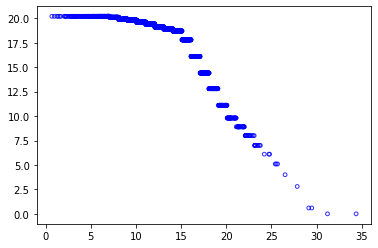

In [27]:
# Ensure that this graph is monotonic
plt.scatter(census_merged['percentage_above_65'], census_merged['imu_subscore_3'], s=14.0, color='blue', alpha=0.8, facecolors='none')

## Comparing with original data

In [28]:
first_year = data[data["MUA/P Designation Date String"].dt.year == 1978]
first_year.groupby("Medically Underserved Area/Population (MUA/P) Component Geographic Type Description").count()

,MUA/P ID,MUA/P Area Code,MUA/P Service Area Name,Designation Type Code,Designation Type,MUA/P Status Code,MUA/P Status Description,Designation Date,MUA/P Designation Date String,MUA/P Update Date,...,Primary State Name,Common Region Code,Common Region Name,Common State Name,Common State Abbreviation,Common State FIPS Code,Common State County FIPS Code,Common County Name,Data Warehouse Record Create Date,Data Warehouse Record Create Date Text
Medically Underserved Area/Population (MUA/P) Component Geographic Type Description,,,,,,,,,,,,,,,,,,,,,
Census Tract,246,246,246,246,246,246,246,246,246,246,...,246,246,246,246,246,246,246,246,246,246
County Subdivision,6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
Single County,1310,1310,1310,1310,1310,1310,1310,1310,1310,1310,...,1310,1310,1310,1310,1310,1310,1310,1310,1310,1310


In [29]:
first_year_county = first_year[ \
    first_year["Medically Underserved Area/Population (MUA/P) Component Geographic Type Description"]=="Single County"]
first_year_county

,MUA/P ID,MUA/P Area Code,MUA/P Service Area Name,Designation Type Code,Designation Type,MUA/P Status Code,MUA/P Status Description,Designation Date,MUA/P Designation Date String,MUA/P Update Date,...,Primary State Name,Common Region Code,Common Region Name,Common State Name,Common State Abbreviation,Common State FIPS Code,Common State County FIPS Code,Common County Name,Data Warehouse Record Create Date,Data Warehouse Record Create Date Text
59,1483609020,48489,Willacy County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-05-13,...,Texas,6,Region 6,Texas,TX,48,48489,"Willacy County, TX",2020-10-24,2020-10-24
85,1483562027,48149,Fayette County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-04-23,...,Texas,6,Region 6,Texas,TX,48,48149,"Fayette County, TX",2020-10-24,2020-10-24
86,1483540210,48459,Upshur County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-05-13,...,Texas,6,Region 6,Texas,TX,48,48459,"Upshur County, TX",2020-10-24,2020-10-24
87,1483481579,48319,Mason County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-05-13,...,Texas,6,Region 6,Texas,TX,48,48319,"Mason County, TX",2020-10-24,2020-10-24
88,1483413107,48119,Delta County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-04-23,...,Texas,6,Region 6,Texas,TX,48,48119,"Delta County, TX",2020-10-24,2020-10-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19504,683,13237,Putnam County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2012-02-16,...,Georgia,4,Region 4,Georgia,GA,13,13237,"Putnam County, GA",2020-10-24,2020-10-24
19505,682,13235,Pulaski County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,1978-11-01,...,Georgia,4,Region 4,Georgia,GA,13,13235,"Pulaski County, GA",2020-10-24,2020-10-24
19506,681,13233,Polk County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,1978-11-01,...,Georgia,4,Region 4,Georgia,GA,13,13233,"Polk County, GA",2020-10-24,2020-10-24
19507,680,13231,Pike County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,1978-11-01,...,Georgia,4,Region 4,Georgia,GA,13,13231,"Pike County, GA",2020-10-24,2020-10-24


In [30]:
first_year_county = first_year_county[first_year_county["MUA/P Status Description"]=="Designated"]
first_year_county

,MUA/P ID,MUA/P Area Code,MUA/P Service Area Name,Designation Type Code,Designation Type,MUA/P Status Code,MUA/P Status Description,Designation Date,MUA/P Designation Date String,MUA/P Update Date,...,Primary State Name,Common Region Code,Common Region Name,Common State Name,Common State Abbreviation,Common State FIPS Code,Common State County FIPS Code,Common County Name,Data Warehouse Record Create Date,Data Warehouse Record Create Date Text
59,1483609020,48489,Willacy County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-05-13,...,Texas,6,Region 6,Texas,TX,48,48489,"Willacy County, TX",2020-10-24,2020-10-24
85,1483562027,48149,Fayette County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-04-23,...,Texas,6,Region 6,Texas,TX,48,48149,"Fayette County, TX",2020-10-24,2020-10-24
86,1483540210,48459,Upshur County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-05-13,...,Texas,6,Region 6,Texas,TX,48,48459,"Upshur County, TX",2020-10-24,2020-10-24
87,1483481579,48319,Mason County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-05-13,...,Texas,6,Region 6,Texas,TX,48,48319,"Mason County, TX",2020-10-24,2020-10-24
88,1483413107,48119,Delta County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2019-04-23,...,Texas,6,Region 6,Texas,TX,48,48119,"Delta County, TX",2020-10-24,2020-10-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19502,685,13241,Rabun County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,1978-11-01,...,Georgia,4,Region 4,Georgia,GA,13,13241,"Rabun County, GA",2020-10-24,2020-10-24
19504,683,13237,Putnam County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,2012-02-16,...,Georgia,4,Region 4,Georgia,GA,13,13237,"Putnam County, GA",2020-10-24,2020-10-24
19505,682,13235,Pulaski County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,1978-11-01,...,Georgia,4,Region 4,Georgia,GA,13,13235,"Pulaski County, GA",2020-10-24,2020-10-24
19506,681,13233,Polk County,MUA,Medically Underserved Area,D,Designated,1978-11-01,1978-11-01,1978-11-01,...,Georgia,4,Region 4,Georgia,GA,13,13233,"Polk County, GA",2020-10-24,2020-10-24


Deleted some cells here.

## Reading in Poverty data (Indicator 1)

In [31]:
census_1970_poverty = pd.read_csv("input/Census_1970/Poverty/time_series_data/nhgis0002_ts_nominal_county.csv",
                           dtype={'STATEFP': str, 'COUNTYFP': str, 'STATENH': str, 'COUNTYNH': str},  encoding='latin-1')
census_1970_poverty.rename(columns={"CL6AA1970": "persons_in_poverty_1970"}, inplace=True)
census_1970_poverty['county_fips'] = census_1970_poverty['STATEFP']+census_1970_poverty['COUNTYFP']
census_1970_poverty

,GISJOIN,STATE,STATEFP,STATENH,COUNTY,COUNTYFP,COUNTYNH,persons_in_poverty_1970,CL6AA1980,CL6AA1990,CL6AA2000,CL6AA125,CL6AA125M,county_fips
0,G0100010,Alabama,01,010,Autauga County,001,0010,5758.0,5337.0,5324.0,4738.0,6267.0,879.0,01001
1,G0100030,Alabama,01,010,Baldwin County,003,0030,13304.0,12616.0,13947.0,14018.0,24002.0,2188.0,01003
2,G0100050,Alabama,01,010,Barbour County,005,0050,9788.0,7559.0,6244.0,7032.0,6395.0,650.0,01005
3,G0100070,Alabama,01,010,Bibb County,007,0070,5256.0,3296.0,3454.0,4091.0,3594.0,733.0,01007
4,G0100090,Alabama,01,010,Blount County,009,0090,6462.0,6527.0,5938.0,5930.0,8396.0,1291.0,01009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3238,G7201450,Puerto Rico,72,720,Vega Baja Municipio,145,1450,NaN,NaN,NaN,NaN,30442.0,1565.0,72145
3239,G7201470,Puerto Rico,72,720,Vieques Municipio,147,1470,NaN,NaN,NaN,NaN,4190.0,604.0,72147
3240,G7201490,Puerto Rico,72,720,Villalba Municipio,149,1490,NaN,NaN,NaN,NaN,13978.0,893.0,72149
3241,G7201510,Puerto Rico,72,720,Yabucoa Municipio,151,1510,NaN,NaN,NaN,NaN,19195.0,1164.0,72151


In [32]:
poverty_merged = census_1970_poverty.merge(census_1970_population, how='inner', on='county_fips')
poverty_merged

,GISJOIN_x,STATE_x,STATEFP,STATENH,COUNTY_x,COUNTYFP,COUNTYNH,persons_in_poverty_1970,CL6AA1980,CL6AA1990,...,SCSAA,SMSAA,URB_AREAA,BLCK_GRPA,BLOCKA,ANXTERRA,URBRURALA,CDA,AREANAME,total_population
0,G0100010,Alabama,01,010,Autauga County,001,0010,5758.0,5337.0,5324.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Autauga,24460
1,G0100030,Alabama,01,010,Baldwin County,003,0030,13304.0,12616.0,13947.0,...,NaN,5160.0,NaN,NaN,NaN,NaN,NaN,NaN,Baldwin,59382
2,G0100050,Alabama,01,010,Barbour County,005,0050,9788.0,7559.0,6244.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Barbour,22543
3,G0100070,Alabama,01,010,Bibb County,007,0070,5256.0,3296.0,3454.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bibb,13812
4,G0100090,Alabama,01,010,Blount County,009,0090,6462.0,6527.0,5938.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Blount,26853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3134,G5600370,Wyoming,56,560,Sweetwater County,037,0370,1672.0,2167.0,3080.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sweetwater,18391
3135,G5600390,Wyoming,56,560,Teton County,039,0390,374.0,713.0,905.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Teton,4823
3136,G5600410,Wyoming,56,560,Uinta County,041,0410,476.0,491.0,1583.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Uinta,7100
3137,G5600430,Wyoming,56,560,Washakie County,043,0430,1154.0,605.0,914.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Washakie,7569


In [33]:
poverty_merged.columns

Index(['GISJOIN_x', 'STATE_x', 'STATEFP', 'STATENH', 'COUNTY_x', 'COUNTYFP',
       'COUNTYNH', 'persons_in_poverty_1970', 'CL6AA1980', 'CL6AA1990',
       'CL6AA2000', 'CL6AA125', 'CL6AA125M', 'county_fips', 'GISJOIN_y',
       'YEAR', 'STATE_y', 'STATEA', 'COUNTY_y', 'COUNTYA', 'CTY_SUBA',
       'PLACEA', 'TRACTA', 'ENUMDISTA', 'SCSAA', 'SMSAA', 'URB_AREAA',
       'BLCK_GRPA', 'BLOCKA', 'ANXTERRA', 'URBRURALA', 'CDA', 'AREANAME',
       'total_population'],
      dtype='object')

In [34]:
# Creating indicator 1
poverty_merged['percentage_in_poverty_1970'] = poverty_merged['persons_in_poverty_1970']/poverty_merged['total_population'] * 100
poverty_merged[['percentage_in_poverty_1970']]

,percentage_in_poverty_1970
0,23.540474
1,22.404096
2,43.419243
3,38.053866
4,24.064350
...,...
3134,9.091403
3135,7.754510
3136,6.704225
3137,15.246400


In [35]:
weighted_v1_string = """0 -------------------------------- 25.1
0.1-2.0 ------------------------ 24.0
2.1-4.0 --------.----.----.--.. ---- 23.7
4.1-6.0 ------------------------- 22.8
6.1-8.0 ------------------------- 21.9
8.1-10.0 ------------------------ 21.0
10.1-12.0 ------------------------- 20.0
12.1-14.0 ----------------------- 18.7
14.1-16.0 --------------------- 17.4
16.1-18.0 ------------------------ 16.2
18.1-20.0 ------------------------- 14.9
20.1-22.0 ------------------------- 13.6
22.1-24.0 ------------------....... 12.2
24.1-26.0 ------------------------- 10.9
26.1-28.0 ------------------------- 9.3
28.1-30.0 ----------.----. --.---... . 7.8
30.1-32.0 -------------------------.. 6.6
32.1-34.0 ------------------------. 5.7
34.1-36.0 ------------------------ 4.7
36.1-38.0 ------------------------ 3.4
38.1-40.0 ------------------------- 2.1
40.1-42.0 --............-------- 1.3
42.0-44.0 ------------------------ 1.0
44.1-46.0 ------------------------- .7
46.1-48.0 ------------------------- .4
48.1-50.0 ------------------------- .1
50- ------------------------------ 0"""

In [36]:
lst_v1 = weighted_v1_string.split("\n")
new_lst_v1 = [(float(i.split("-", 1)[0]), float(i.rsplit(" ", 1)[1])) for i in lst_v1]
new_lst_v1

[(0.0, 25.1),
 (0.1, 24.0),
 (2.1, 23.7),
 (4.1, 22.8),
 (6.1, 21.9),
 (8.1, 21.0),
 (10.1, 20.0),
 (12.1, 18.7),
 (14.1, 17.4),
 (16.1, 16.2),
 (18.1, 14.9),
 (20.1, 13.6),
 (22.1, 12.2),
 (24.1, 10.9),
 (26.1, 9.3),
 (28.1, 7.8),
 (30.1, 6.6),
 (32.1, 5.7),
 (34.1, 4.7),
 (36.1, 3.4),
 (38.1, 2.1),
 (40.1, 1.3),
 (42.0, 1.0),
 (44.1, 0.7),
 (46.1, 0.4),
 (48.1, 0.1),
 (50.0, 0.0)]

In [37]:
poverty_merged["imu_subscore_1"] = poverty_merged["percentage_in_poverty_1970"].apply(mapIMUsubscore, args=(new_lst_v1,))
poverty_merged

,GISJOIN_x,STATE_x,STATEFP,STATENH,COUNTY_x,COUNTYFP,COUNTYNH,persons_in_poverty_1970,CL6AA1980,CL6AA1990,...,URB_AREAA,BLCK_GRPA,BLOCKA,ANXTERRA,URBRURALA,CDA,AREANAME,total_population,percentage_in_poverty_1970,imu_subscore_1
0,G0100010,Alabama,01,010,Autauga County,001,0010,5758.0,5337.0,5324.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Autauga,24460,23.540474,12.2
1,G0100030,Alabama,01,010,Baldwin County,003,0030,13304.0,12616.0,13947.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Baldwin,59382,22.404096,12.2
2,G0100050,Alabama,01,010,Barbour County,005,0050,9788.0,7559.0,6244.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Barbour,22543,43.419243,1.0
3,G0100070,Alabama,01,010,Bibb County,007,0070,5256.0,3296.0,3454.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Bibb,13812,38.053866,3.4
4,G0100090,Alabama,01,010,Blount County,009,0090,6462.0,6527.0,5938.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Blount,26853,24.064350,12.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3134,G5600370,Wyoming,56,560,Sweetwater County,037,0370,1672.0,2167.0,3080.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Sweetwater,18391,9.091403,21.0
3135,G5600390,Wyoming,56,560,Teton County,039,0390,374.0,713.0,905.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Teton,4823,7.754510,21.9
3136,G5600410,Wyoming,56,560,Uinta County,041,0410,476.0,491.0,1583.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Uinta,7100,6.704225,21.9
3137,G5600430,Wyoming,56,560,Washakie County,043,0430,1154.0,605.0,914.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Washakie,7569,15.246400,17.4


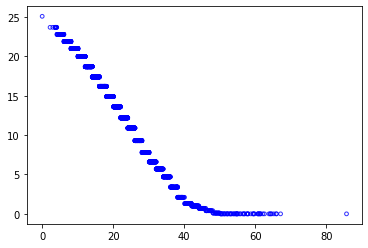

In [38]:
# Check that this is monotonically decreasing
plt.scatter(poverty_merged['percentage_in_poverty_1970'], poverty_merged['imu_subscore_1'], s=14.0, color='blue', alpha=0.8, facecolors='none')

Deleted some cells here.

## Infant Mortality Rate: Indicator 2

**Note:** These births/deaths are by place of residence rather than place of occurence

In [39]:
def get_merged_infant_df(year):
    live_births_dset = pd.read_csv("input/Infant_Mortality/nhgis0004_csv/nhgis0004_ds230_{}_county.csv".format(year),
                         dtype={"STATEA": str, "COUNTYA": str}, encoding='latin-1')
    live_births_dset.rename(columns={"AGV1001": "live_births", "AGV5001": "fetal_deaths"}, inplace=True)
    live_births_dset.drop("fetal_deaths", axis=1, inplace=True)

    # Some pre-processing removing last digit
    live_births_dset['STATEA'] = live_births_dset['STATEA'].apply(lambda x: x[:-1])
    live_births_dset['COUNTYA'] = live_births_dset['COUNTYA'].apply(lambda x: x[:-1])

    live_births_dset['county_fips'] = live_births_dset['STATEA']+live_births_dset['COUNTYA']
    
    infant_deaths_dset = pd.read_csv("input/Infant_Mortality/nhgis0006_csv/nhgis0006_ds230_{}_county.csv".format(year),
                         dtype={"STATEA": str, "COUNTYA": str}, encoding='latin-1')

    infant_deaths_dset.rename(columns={"AGV7001": "infant_deaths"}, inplace=True)

    # Some pre-processing removing last digit
    infant_deaths_dset['STATEA'] = infant_deaths_dset['STATEA'].apply(lambda x: x[:-1])
    infant_deaths_dset['COUNTYA'] = infant_deaths_dset['COUNTYA'].apply(lambda x: x[:-1])

    infant_deaths_dset['county_fips'] = infant_deaths_dset['STATEA']+infant_deaths_dset['COUNTYA']

    infant_merged = live_births_dset.merge(infant_deaths_dset, how="inner", on="county_fips", suffixes=('_',''))
    return infant_merged

In [40]:
get_merged_infant_df(1966)

,GISJOIN_,YEAR_,STATE_,STATEA_,COUNTY_,COUNTYA_,AREANAME_,live_births,county_fips,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,AREANAME,infant_deaths
0,G0100010,1966,Alabama,01,Autauga,001,AUTAUGA,442,01001,G0100010,1966,Alabama,01,Autauga,001,AUTAUGA,22
1,G0100030,1966,Alabama,01,Baldwin,003,BALDWIN,1040,01003,G0100030,1966,Alabama,01,Baldwin,003,BALDWIN,33
2,G0100050,1966,Alabama,01,Barbour,005,BARBOUR,486,01005,G0100050,1966,Alabama,01,Barbour,005,BARBOUR,23
3,G0100070,1966,Alabama,01,Bibb,007,BIBB,298,01007,G0100070,1966,Alabama,01,Bibb,007,BIBB,8
4,G0100090,1966,Alabama,01,Blount,009,BLOUNT,440,01009,G0100090,1966,Alabama,01,Blount,009,BLOUNT,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3132,G5600390,1966,Wyoming,56,Teton,039,TETON,78,56039,G5600390,1966,Wyoming,56,Teton,039,TETON,0
3133,G5600410,1966,Wyoming,56,Uinta,041,UINTA,126,56041,G5600410,1966,Wyoming,56,Uinta,041,UINTA,3
3134,G5600430,1966,Wyoming,56,Washakie,043,WASHAKIE,152,56043,G5600430,1966,Wyoming,56,Washakie,043,WASHAKIE,3
3135,G5600450,1966,Wyoming,56,Weston,045,WESTON,116,56045,G5600450,1966,Wyoming,56,Weston,045,WESTON,7


In [41]:
infant_dsets = []

infant_dsets.append(get_merged_infant_df(1966))
infant_dsets.append(get_merged_infant_df(1967))
infant_dsets.append(get_merged_infant_df(1968))
infant_dsets.append(get_merged_infant_df(1969))
infant_dsets.append(get_merged_infant_df(1970))

In [42]:
infant_megaset = pd.concat(infant_dsets)
infant_megaset

,GISJOIN_,YEAR_,STATE_,STATEA_,COUNTY_,COUNTYA_,AREANAME_,live_births,county_fips,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,AREANAME,infant_deaths
0,G0100010,1966,Alabama,01,Autauga,001,AUTAUGA,442,01001,G0100010,1966,Alabama,01,Autauga,001,AUTAUGA,22
1,G0100030,1966,Alabama,01,Baldwin,003,BALDWIN,1040,01003,G0100030,1966,Alabama,01,Baldwin,003,BALDWIN,33
2,G0100050,1966,Alabama,01,Barbour,005,BARBOUR,486,01005,G0100050,1966,Alabama,01,Barbour,005,BARBOUR,23
3,G0100070,1966,Alabama,01,Bibb,007,BIBB,298,01007,G0100070,1966,Alabama,01,Bibb,007,BIBB,8
4,G0100090,1966,Alabama,01,Blount,009,BLOUNT,440,01009,G0100090,1966,Alabama,01,Blount,009,BLOUNT,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,G5600390,1970,Wyoming,56,Teton,039,TETON,106,56039,G5600390,1970,Wyoming,56,Teton,039,TETON,2
3138,G5600410,1970,Wyoming,56,Uinta,041,UINTA,122,56041,G5600410,1970,Wyoming,56,Uinta,041,UINTA,0
3139,G5600430,1970,Wyoming,56,Washakie,043,WASHAKIE,148,56043,G5600430,1970,Wyoming,56,Washakie,043,WASHAKIE,3
3140,G5600450,1970,Wyoming,56,Weston,045,WESTON,104,56045,G5600450,1970,Wyoming,56,Weston,045,WESTON,1


In [43]:
infant_sum_county = infant_megaset.groupby("county_fips").sum().drop("YEAR", axis=1).reset_index()
infant_sum_county["infant_mortality_rate"] = infant_sum_county["infant_deaths"]/infant_sum_county["live_births"] * 1000
infant_sum_county

,county_fips,YEAR_,live_births,infant_deaths,infant_mortality_rate
0,01001,9840,2356,78,33.106961
1,01003,9840,5184,134,25.848765
2,01005,9840,2350,79,33.617021
3,01007,9840,1355,39,28.782288
4,01009,9840,2089,48,22.977501
...,...,...,...,...,...
3134,56039,9840,466,6,12.875536
3135,56041,9840,625,7,11.200000
3136,56043,9840,742,20,26.954178
3137,56045,9840,547,20,36.563071


In [44]:
weighted_v2_string = """0-10.0 ------------ 26.0
10.1-11.0 ------- 25.6
11.1-12.0 ------ 24.8
12.1-13.0 --------- 24.0
13.1-14.0 -------- 23.2
14.1-15.0 ----------------------- 22.4
15.1-16.0 -------------------- 21.5
16.1-17.0 ------- 20.5
17.1-18.0 --------- 19.5
18.1-19.0 ------------ 18.5
19.1-20.0 ----------------- 17.5
20.1-21.0 ----------------------- 16.4
21.1-22.0 ---------- 15.3
22.1-23.0 --------------- 14.2
23.1-24.0 --------- 13.1
24.1-25.0 -------------------- 11.9
25.1-28.0 -------------- 10.8
28.1-27.0 ---------- 9.6
27.1-28.0 ----------- 8.5
28.1-29.0 --------- 7.3
29.1-30.0 ------------ 6.1
30.1-31.0 --- 5.4
31.1-32.0 ------------------ 5.0
32.1-33.0 --------------- 4.7
33.1-34.0 ------------ 4.3
34.1-35.0 --------------- 4.00
35.1-36.0 ------------ 3.6
36.1-37.0 --------------- 3.3
37.1-38.0 ------------------- 3.0
38.1-39.0---------------- 2.6
39.1-40.0 2.3
40.1-41.0 --------------- 2.0
41.1-42.0 --------- 1.8
42.1-43b0 ----------- 1.6
43.1-44.0 1.4
44.1-45.0 1.2
45.1-46.0 - - 1.0
46.1-47.0 ----------------- .8
47.1-48.0 --------- .6
48.1-49.0 -------- .3
49.1-50.0 ---------- .1
50 ----- 0"""

In [45]:
lst_v2 = weighted_v2_string.split("\n")
new_lst_v2 = [(float(i.split("-", 1)[0]), float(i.rsplit(" ", 1)[1])) for i in lst_v2]
new_lst_v2

[(0.0, 26.0),
 (10.1, 25.6),
 (11.1, 24.8),
 (12.1, 24.0),
 (13.1, 23.2),
 (14.1, 22.4),
 (15.1, 21.5),
 (16.1, 20.5),
 (17.1, 19.5),
 (18.1, 18.5),
 (19.1, 17.5),
 (20.1, 16.4),
 (21.1, 15.3),
 (22.1, 14.2),
 (23.1, 13.1),
 (24.1, 11.9),
 (25.1, 10.8),
 (28.1, 9.6),
 (27.1, 8.5),
 (28.1, 7.3),
 (29.1, 6.1),
 (30.1, 5.4),
 (31.1, 5.0),
 (32.1, 4.7),
 (33.1, 4.3),
 (34.1, 4.0),
 (35.1, 3.6),
 (36.1, 3.3),
 (37.1, 3.0),
 (38.1, 2.6),
 (39.1, 2.3),
 (40.1, 2.0),
 (41.1, 1.8),
 (42.1, 1.6),
 (43.1, 1.4),
 (44.1, 1.2),
 (45.1, 1.0),
 (46.1, 0.8),
 (47.1, 0.6),
 (48.1, 0.3),
 (49.1, 0.1),
 (50.0, 0.0)]

In [46]:
infant_sum_county["imu_subscore_2"] = infant_sum_county["infant_mortality_rate"].apply(mapIMUsubscore, args=(new_lst_v2,))
infant_sum_county

,county_fips,YEAR_,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2
0,01001,9840,2356,78,33.106961,4.3
1,01003,9840,5184,134,25.848765,10.8
2,01005,9840,2350,79,33.617021,4.3
3,01007,9840,1355,39,28.782288,7.3
4,01009,9840,2089,48,22.977501,14.2
...,...,...,...,...,...,...
3134,56039,9840,466,6,12.875536,24.0
3135,56041,9840,625,7,11.200000,24.8
3136,56043,9840,742,20,26.954178,10.8
3137,56045,9840,547,20,36.563071,3.3


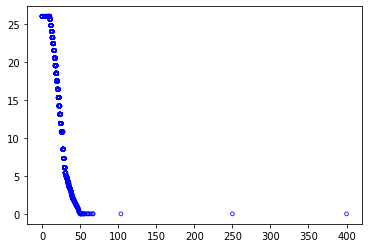

In [47]:
# This should be monotonic for accurate mapping
plt.scatter(infant_sum_county['infant_mortality_rate'], infant_sum_county['imu_subscore_2'], s=14.0, color='blue', alpha=0.8, facecolors='none')

Deleted some cells here.

## Physician Data Indicator 4

In [48]:
physician_ts = pd.read_sas('input/Physician_Data/ahrf2020.sas7bdat')
physician_ts

,f00001,f00002,f00003,f00004,f00005,f00006,f00007,f00008,f12424,f00010,...,f1533814,f1533813,f1533812,f1533811,f1533810,f1533809,f1533808,f1533807,f1533806,f0081176
0,NaN,b'01001',b'AHRF',b'01001',b'2020',20212.0,31778.0,b'Alabama',b'AL',b'Autauga',...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,5.0,3.0,290.0
1,NaN,b'01003',b'AHRF',b'01003',b'2020',20212.0,31778.0,b'Alabama',b'AL',b'Baldwin',...,2.0,1.0,0.0,2.0,2.0,1.0,2.0,7.0,14.0,155.0
2,NaN,b'01005',b'AHRF',b'01005',b'2020',20212.0,31778.0,b'Alabama',b'AL',b'Barbour',...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,220.0
3,NaN,b'01007',b'AHRF',b'01007',b'2020',20212.0,31778.0,b'Alabama',b'AL',b'Bibb',...,0.0,0.0,0.0,0.0,2.0,0.0,2.0,12.0,7.0,224.0
4,NaN,b'01009',b'AHRF',b'01009',b'2020',20212.0,31778.0,b'Alabama',b'AL',b'Blount',...,0.0,0.0,2.0,1.0,1.0,0.0,4.0,10.0,7.0,870.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3225,NaN,b'72151',b'AHRF',b'72151',b'2020',20212.0,31778.0,b'Puerto Rico',b'PR',b'Yabucoa',...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3226,NaN,b'72153',b'AHRF',b'72153',b'2020',20212.0,31778.0,b'Puerto Rico',b'PR',b'Yauco',...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3227,NaN,b'78010',b'AHRF',b'78010',b'2020',20212.0,31778.0,b'US Virgin Islands',b'VI',b'St. Croix',...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3228,NaN,b'78020',b'AHRF',b'78020',b'2020',20212.0,31778.0,b'US Virgin Islands',b'VI',b'St. John',...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
physician_ts = physician_ts[["f00008", "f12424", "f00010", "f04437", "f00011", "f00012", "f0885770"]]
for col in physician_ts.columns:
    if (col!="f0885770"):
        physician_ts[col] = physician_ts[col].apply(lambda x: x.decode("utf-8"))
physician_ts

,f00008,f12424,f00010,f04437,f00011,f00012,f0885770
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0
...,...,...,...,...,...,...,...
3225,Puerto Rico,PR,Yabucoa,"Yabucoa, PR",72,151,NaN
3226,Puerto Rico,PR,Yauco,"Yauco, PR",72,153,NaN
3227,US Virgin Islands,VI,St. Croix,"St. Croix, VI",78,010,NaN
3228,US Virgin Islands,VI,St. John,"St. John, VI",78,020,NaN


In [50]:
physician_ts["county_fips_code"] = physician_ts["f00011"] + physician_ts["f00012"]
physician_ts

,f00008,f12424,f00010,f04437,f00011,f00012,f0885770,county_fips_code
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,01001
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,01003
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,01005
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,01007
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,01009
...,...,...,...,...,...,...,...,...
3225,Puerto Rico,PR,Yabucoa,"Yabucoa, PR",72,151,NaN,72151
3226,Puerto Rico,PR,Yauco,"Yauco, PR",72,153,NaN,72153
3227,US Virgin Islands,VI,St. Croix,"St. Croix, VI",78,010,NaN,78010
3228,US Virgin Islands,VI,St. John,"St. John, VI",78,020,NaN,78020


In [51]:
# How many are null
np.count_nonzero(pd.isnull(physician_ts["f0885770"]))

148

In [52]:
physician_ts = physician_ts.dropna(axis=0, subset=["f0885770"])
physician_ts = physician_ts.rename({'f00008': "State", "f12424": "State_Abbr", "f00010":"County", "f04437":"County_State",
                    "f0885770": "num_physicians"}, axis=1)
physician_ts

,State,State_Abbr,County,County_State,f00011,f00012,num_physicians,county_fips_code
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,01001
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,01003
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,01005
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,01007
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,01009
...,...,...,...,...,...,...,...,...
3143,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,56037
3144,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,56039
3145,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,56041
3146,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,56043


In [53]:
physician_ts = physician_ts.merge(census_1970_population[['county_fips', 'total_population']], how='inner', left_on='county_fips_code', right_on='county_fips')
physician_ts

,State,State_Abbr,County,County_State,f00011,f00012,num_physicians,county_fips_code,county_fips,total_population
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,01001,01001,24460
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,01003,01003,59382
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,01005,01005,22543
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,01007,01007,13812
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,01009,01009,26853
...,...,...,...,...,...,...,...,...,...,...
3070,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,56037,56037,18391
3071,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,56039,56039,4823
3072,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,56041,56041,7100
3073,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,56043,56043,7569


In [54]:
physician_ts['physicians_per_1000_population'] = physician_ts['num_physicians']/physician_ts['total_population'] * 1000
physician_ts

,State,State_Abbr,County,County_State,f00011,f00012,num_physicians,county_fips_code,county_fips,total_population,physicians_per_1000_population
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,01001,01001,24460,0.204415
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,01003,01003,59382,0.319962
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,01005,01005,22543,0.576676
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,01007,01007,13812,0.289603
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,01009,01009,26853,0.186199
...,...,...,...,...,...,...,...,...,...,...,...
3070,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,56037,56037,18391,0.543744
3071,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,56039,56039,4823,1.451379
3072,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,56041,56041,7100,1.408451
3073,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,56043,56043,7569,0.924825


In [55]:
weighted_v4_string = """0-0.001 ---------- 0.0
.001-0.050 ------------ 0.5
0.051-0.100 ----- 1.6
.101-.150 ------- 2.8
.151-.200 -------- 4.1
.201-.250 -------- 5.7
.251-.300 -------- 7.3
.301-.350 -------- 9.0
.351-.400 -------- 10.7
.401-.450 -------------- - ------ 12.6
.451-.50 ------------------------ 14.8
.501-.550 -- ------- 16.9
.551-.60 ------------- 19.1
.601-.650- ---------------- 20.7
.651-.700 -------- 21.9
.701-.750 -------------- 23.1
.751-.800 ---------------- 24.3
.801-.850 --------------------------- 25.3
.851-.900 ----------- 25.9
.901-.950 ------------------ 26.6
.951-1.000 --------- 27.2
1.001-1.050 ----------- 27.7
1.051-1.100 ------- ---------------- 28.0
1.101-1.150 ------------------- 28.3
1.151-1.200 --------------- 28.6
1.200- --------- 28.7"""

In [56]:
lst_v4 = weighted_v4_string.split("\n")
new_lst_v4 = [(float(i.split("-", 1)[0]), float(i.rsplit(" ", 1)[1])) for i in lst_v4]
new_lst_v4

[(0.0, 0.0),
 (0.001, 0.5),
 (0.051, 1.6),
 (0.101, 2.8),
 (0.151, 4.1),
 (0.201, 5.7),
 (0.251, 7.3),
 (0.301, 9.0),
 (0.351, 10.7),
 (0.401, 12.6),
 (0.451, 14.8),
 (0.501, 16.9),
 (0.551, 19.1),
 (0.601, 20.7),
 (0.651, 21.9),
 (0.701, 23.1),
 (0.751, 24.3),
 (0.801, 25.3),
 (0.851, 25.9),
 (0.901, 26.6),
 (0.951, 27.2),
 (1.001, 27.7),
 (1.051, 28.0),
 (1.101, 28.3),
 (1.151, 28.6),
 (1.2, 28.7)]

In [57]:
physician_ts['imu_subscore_4'] = physician_ts['physicians_per_1000_population'].apply(mapIMUsubscore, args=(new_lst_v4,))
physician_ts

,State,State_Abbr,County,County_State,f00011,f00012,num_physicians,county_fips_code,county_fips,total_population,physicians_per_1000_population,imu_subscore_4
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,01001,01001,24460,0.204415,5.7
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,01003,01003,59382,0.319962,9.0
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,01005,01005,22543,0.576676,19.1
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,01007,01007,13812,0.289603,7.3
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,01009,01009,26853,0.186199,4.1
...,...,...,...,...,...,...,...,...,...,...,...,...
3070,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,56037,56037,18391,0.543744,16.9
3071,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,56039,56039,4823,1.451379,28.7
3072,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,56041,56041,7100,1.408451,28.7
3073,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,56043,56043,7569,0.924825,26.6


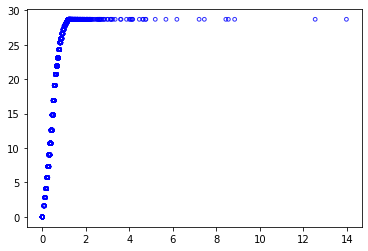

In [58]:
# This should be monotonic for accurate mapping
plt.scatter(physician_ts['physicians_per_1000_population'], physician_ts['imu_subscore_4'], s=14.0, color='blue', alpha=0.8, facecolors='none')

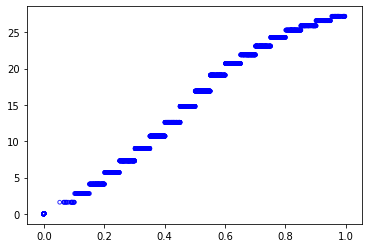

In [59]:
physician_ts_filtered = physician_ts[physician_ts['physicians_per_1000_population']<=1.0]
plt.scatter(physician_ts_filtered['physicians_per_1000_population'], physician_ts_filtered['imu_subscore_4'], s=14.0, color='blue', alpha=0.8, facecolors='none')

In [60]:
def add_25_per_physician_indicator(value):
    if value<=1.0:
        return 25.0 * value
    else:
        return mapIMUsubscore(value, new_lst_v4)
    
physician_ts

,State,State_Abbr,County,County_State,f00011,f00012,num_physicians,county_fips_code,county_fips,total_population,physicians_per_1000_population,imu_subscore_4
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,01001,01001,24460,0.204415,5.7
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,01003,01003,59382,0.319962,9.0
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,01005,01005,22543,0.576676,19.1
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,01007,01007,13812,0.289603,7.3
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,01009,01009,26853,0.186199,4.1
...,...,...,...,...,...,...,...,...,...,...,...,...
3070,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,56037,56037,18391,0.543744,16.9
3071,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,56039,56039,4823,1.451379,28.7
3072,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,56041,56041,7100,1.408451,28.7
3073,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,56043,56043,7569,0.924825,26.6


## Combining the 4 datasets together to get `final_df`

In [61]:
age_df = census_merged.copy()
age_df

,GISJOIN,STATEA,STATE,COUNTY,SMSAA,COUNTYA,age_65_and_above,county_fips,total_population,percentage_above_65,imu_subscore_3
0,G0100010,01,Alabama,Autauga,NaN,001,1917,01001,24460,7.837285,20.1
1,G0100030,01,Alabama,Baldwin,5160.0,003,6333,01003,59382,10.664848,19.6
2,G0100050,01,Alabama,Barbour,NaN,005,2503,01005,22543,11.103225,19.4
3,G0100070,01,Alabama,Bibb,NaN,007,1595,01007,13812,11.547929,19.4
4,G0100090,01,Alabama,Blount,NaN,009,2877,01009,26853,10.713887,19.6
...,...,...,...,...,...,...,...,...,...,...,...
3135,G5600370,56,Wyoming,Sweetwater,NaN,037,1769,56037,18391,9.618835,19.8
3136,G5600390,56,Wyoming,Teton,NaN,039,284,56039,4823,5.888451,20.2
3137,G5600410,56,Wyoming,Uinta,NaN,041,733,56041,7100,10.323944,19.6
3138,G5600430,56,Wyoming,Washakie,NaN,043,628,56043,7569,8.297001,19.9


In [62]:
poverty_df = poverty_merged.copy()
poverty_df

,GISJOIN_x,STATE_x,STATEFP,STATENH,COUNTY_x,COUNTYFP,COUNTYNH,persons_in_poverty_1970,CL6AA1980,CL6AA1990,...,URB_AREAA,BLCK_GRPA,BLOCKA,ANXTERRA,URBRURALA,CDA,AREANAME,total_population,percentage_in_poverty_1970,imu_subscore_1
0,G0100010,Alabama,01,010,Autauga County,001,0010,5758.0,5337.0,5324.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Autauga,24460,23.540474,12.2
1,G0100030,Alabama,01,010,Baldwin County,003,0030,13304.0,12616.0,13947.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Baldwin,59382,22.404096,12.2
2,G0100050,Alabama,01,010,Barbour County,005,0050,9788.0,7559.0,6244.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Barbour,22543,43.419243,1.0
3,G0100070,Alabama,01,010,Bibb County,007,0070,5256.0,3296.0,3454.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Bibb,13812,38.053866,3.4
4,G0100090,Alabama,01,010,Blount County,009,0090,6462.0,6527.0,5938.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Blount,26853,24.064350,12.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3134,G5600370,Wyoming,56,560,Sweetwater County,037,0370,1672.0,2167.0,3080.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Sweetwater,18391,9.091403,21.0
3135,G5600390,Wyoming,56,560,Teton County,039,0390,374.0,713.0,905.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Teton,4823,7.754510,21.9
3136,G5600410,Wyoming,56,560,Uinta County,041,0410,476.0,491.0,1583.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Uinta,7100,6.704225,21.9
3137,G5600430,Wyoming,56,560,Washakie County,043,0430,1154.0,605.0,914.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Washakie,7569,15.246400,17.4


In [63]:
poverty_df.columns

Index(['GISJOIN_x', 'STATE_x', 'STATEFP', 'STATENH', 'COUNTY_x', 'COUNTYFP',
       'COUNTYNH', 'persons_in_poverty_1970', 'CL6AA1980', 'CL6AA1990',
       'CL6AA2000', 'CL6AA125', 'CL6AA125M', 'county_fips', 'GISJOIN_y',
       'YEAR', 'STATE_y', 'STATEA', 'COUNTY_y', 'COUNTYA', 'CTY_SUBA',
       'PLACEA', 'TRACTA', 'ENUMDISTA', 'SCSAA', 'SMSAA', 'URB_AREAA',
       'BLCK_GRPA', 'BLOCKA', 'ANXTERRA', 'URBRURALA', 'CDA', 'AREANAME',
       'total_population', 'percentage_in_poverty_1970', 'imu_subscore_1'],
      dtype='object')

In [64]:
infant_df = infant_sum_county.copy()
infant_df

,county_fips,YEAR_,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2
0,01001,9840,2356,78,33.106961,4.3
1,01003,9840,5184,134,25.848765,10.8
2,01005,9840,2350,79,33.617021,4.3
3,01007,9840,1355,39,28.782288,7.3
4,01009,9840,2089,48,22.977501,14.2
...,...,...,...,...,...,...
3134,56039,9840,466,6,12.875536,24.0
3135,56041,9840,625,7,11.200000,24.8
3136,56043,9840,742,20,26.954178,10.8
3137,56045,9840,547,20,36.563071,3.3


In [65]:
physician_ts

,State,State_Abbr,County,County_State,f00011,f00012,num_physicians,county_fips_code,county_fips,total_population,physicians_per_1000_population,imu_subscore_4
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,01001,01001,24460,0.204415,5.7
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,01003,01003,59382,0.319962,9.0
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,01005,01005,22543,0.576676,19.1
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,01007,01007,13812,0.289603,7.3
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,01009,01009,26853,0.186199,4.1
...,...,...,...,...,...,...,...,...,...,...,...,...
3070,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,56037,56037,18391,0.543744,16.9
3071,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,56039,56039,4823,1.451379,28.7
3072,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,56041,56041,7100,1.408451,28.7
3073,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,56043,56043,7569,0.924825,26.6


In [66]:
# A 4-way merge!

final_df = physician_ts[['State', 'State_Abbr', 'County', 'county_fips_code', 'imu_subscore_4', 'num_physicians', 'physicians_per_1000_population']].merge(
    infant_df[['county_fips', 'live_births', 'infant_deaths', 'infant_mortality_rate', 'imu_subscore_2']],
    left_on='county_fips_code', right_on='county_fips')
final_df.drop('county_fips_code', axis=1, inplace=True)

final_df = final_df.merge(poverty_df[['county_fips', 'persons_in_poverty_1970', 'total_population', 'imu_subscore_1']])
final_df = final_df.merge(age_df[['county_fips', 'age_65_and_above', 'imu_subscore_3']])
final_df

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2,persons_in_poverty_1970,total_population,imu_subscore_1,age_65_and_above,imu_subscore_3
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,4.3,5758.0,24460,12.2,1917,20.1
1,Alabama,AL,Baldwin,9.0,19.0,0.319962,01003,5184,134,25.848765,10.8,13304.0,59382,12.2,6333,19.6
2,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,4.3,9788.0,22543,1.0,2503,19.4
3,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,7.3,5256.0,13812,3.4,1595,19.4
4,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,14.2,6462.0,26853,12.2,2877,19.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3069,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,17.5,1672.0,18391,21.0,1769,19.8
3070,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,24.0,374.0,4823,21.9,284,20.2
3071,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,24.8,476.0,7100,21.9,733,19.6
3072,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,10.8,1154.0,7569,17.4,628,19.9


In [67]:
# Constructing our estimate of the IMU score
final_df['imu_score_hat'] = final_df['imu_subscore_1'] + final_df['imu_subscore_2'] + final_df['imu_subscore_3'] + final_df['imu_subscore_4']
final_df['is_MUA_hat'] = (final_df['imu_score_hat']<=62.0).astype(int)
final_df

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2,persons_in_poverty_1970,total_population,imu_subscore_1,age_65_and_above,imu_subscore_3,imu_score_hat,is_MUA_hat
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,4.3,5758.0,24460,12.2,1917,20.1,42.3,1
1,Alabama,AL,Baldwin,9.0,19.0,0.319962,01003,5184,134,25.848765,10.8,13304.0,59382,12.2,6333,19.6,51.6,1
2,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,4.3,9788.0,22543,1.0,2503,19.4,43.8,1
3,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,7.3,5256.0,13812,3.4,1595,19.4,37.4,1
4,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,14.2,6462.0,26853,12.2,2877,19.6,50.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3069,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,17.5,1672.0,18391,21.0,1769,19.8,75.2,0
3070,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,24.0,374.0,4823,21.9,284,20.2,94.8,0
3071,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,24.8,476.0,7100,21.9,733,19.6,95.0,0
3072,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,10.8,1154.0,7569,17.4,628,19.9,74.7,0


In [68]:
filtered_mua_only = final_df[final_df['is_MUA_hat']==1]
filtered_mua_only

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2,persons_in_poverty_1970,total_population,imu_subscore_1,age_65_and_above,imu_subscore_3,imu_score_hat,is_MUA_hat
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,4.3,5758.0,24460,12.2,1917,20.1,42.3,1
1,Alabama,AL,Baldwin,9.0,19.0,0.319962,01003,5184,134,25.848765,10.8,13304.0,59382,12.2,6333,19.6,51.6,1
2,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,4.3,9788.0,22543,1.0,2503,19.4,43.8,1
3,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,7.3,5256.0,13812,3.4,1595,19.4,37.4,1
4,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,14.2,6462.0,26853,12.2,2877,19.6,50.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3039,Wisconsin,WI,Taylor,7.3,5.0,0.294846,55119,1384,35,25.289017,10.8,3106.0,16958,14.9,2109,19.1,52.1,1
3048,Wisconsin,WI,Waushara,16.9,8.0,0.540723,55137,1111,28,25.202520,10.8,2348.0,14795,17.4,2531,14.4,59.5,1
3056,Wyoming,WY,Crook,5.7,1.0,0.220507,56011,429,12,27.972028,8.5,642.0,4535,17.4,390,19.9,51.5,1
3068,Wyoming,WY,Sublette,16.9,2.0,0.532623,56035,377,14,37.135279,3.0,373.0,3755,21.0,235,20.2,61.1,1


### We join `final_df` with the original `first_year_county` table to verify our estimate with the true IMU score

In [69]:
joined = final_df.merge(first_year_county[['Common State County FIPS Code', 'MUA/P Status Description', 'MUA/P ID', 'IMU Score']], \
                        left_on='county_fips', right_on='Common State County FIPS Code',
                        how='inner')
joined

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,total_population,imu_subscore_1,age_65_and_above,imu_subscore_3,imu_score_hat,is_MUA_hat,Common State County FIPS Code,MUA/P Status Description,MUA/P ID,IMU Score
0,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,13812,3.4,1595,19.4,37.4,1,01007,Designated,4,47.7
1,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,26853,12.2,2877,19.6,50.1,1,01009,Designated,5,56.1
2,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,11824,0.0,1499,19.1,36.6,1,01011,Designated,6,61.7
3,Alabama,AL,Calhoun,20.7,62.0,0.601405,01015,9976,210,21.050521,...,103092,14.9,8152,20.1,72.1,0,01015,Designated,8,61.9
4,Alabama,AL,Cherokee,10.7,6.0,0.384468,01019,1177,25,21.240442,...,15606,12.2,1674,19.6,57.8,1,01019,Designated,10,56.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
998,Wisconsin,WI,Iron,4.1,1.0,0.153069,55051,317,12,37.854890,...,6533,20.0,1177,14.4,41.5,1,55051,Designated,3767,55.2
999,Wisconsin,WI,Price,12.6,6.0,0.413223,55099,1057,22,20.813623,...,14520,16.2,2381,16.1,61.3,1,55099,Designated,3771,60.1
1000,Wisconsin,WI,Rusk,12.6,6.0,0.421408,55107,1072,27,25.186567,...,14238,13.6,2024,18.7,55.7,1,55107,Designated,3772,59.4
1001,Wisconsin,WI,Vilas,14.8,5.0,0.456288,55125,667,14,20.989505,...,10958,16.2,1866,16.1,63.5,0,55125,Designated,3774,61.1


In [70]:
joined.describe()

,imu_subscore_4,num_physicians,physicians_per_1000_population,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2,persons_in_poverty_1970,total_population,imu_subscore_1,age_65_and_above,imu_subscore_3,imu_score_hat,is_MUA_hat,MUA/P ID,IMU Score
count,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1.003000e+03,1003.000000
mean,11.029511,7.701894,0.380313,1557.382851,43.575274,26.445586,11.213958,4897.741775,16781.942173,8.499601,1896.542373,18.074776,48.817846,0.844467,2.937617e+08,51.561815
std,7.126445,11.275442,0.264872,1609.199427,48.390946,9.292596,7.079127,4372.903162,15396.482555,5.594845,1480.734481,3.060526,11.964479,0.362593,5.694951e+08,8.919318
min,0.000000,0.000000,0.000000,40.000000,0.000000,0.000000,0.000000,68.000000,629.000000,0.000000,40.000000,0.000000,19.400000,0.000000,4.000000e+00,18.100000
25%,5.700000,2.000000,0.230404,543.500000,12.000000,20.763489,4.700000,1932.500000,7121.000000,3.400000,902.500000,18.700000,39.700000,1.000000,9.485000e+02,46.400000
50%,10.700000,4.000000,0.354736,1072.000000,28.000000,25.931165,10.800000,3551.000000,12218.000000,7.800000,1545.000000,19.400000,48.700000,1.000000,2.092000e+03,54.000000
75%,14.800000,9.000000,0.497368,1948.500000,57.000000,32.258065,16.400000,6519.000000,20773.000000,12.900000,2489.000000,19.800000,57.400000,1.000000,3.717500e+03,58.500000
max,28.700000,140.000000,4.463380,12829.000000,341.000000,66.666667,26.000000,35575.000000,154667.000000,21.900000,19145.000000,20.200000,91.200000,1.000000,1.548198e+09,62.000000


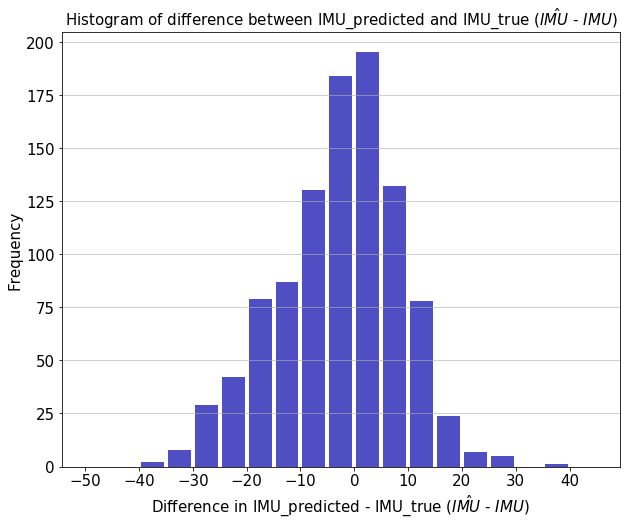

In [71]:
# Histogram of difference in IMU_score_hat and IMU Score

plt.figure(figsize=[10,8])

x_axis = joined["imu_score_hat"] - joined["IMU Score"]
n, bins, patches = plt.hist(x=x_axis, bins=np.arange(-50, 50, 5), color='#0504aa',alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Difference in IMU_predicted - IMU_true ($\hat{IMU}$ - $IMU$)',fontsize=15)
plt.ylabel('Frequency',fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(-50, 50, 10))
plt.yticks(fontsize=15)
plt.title('Histogram of difference between IMU_predicted and IMU_true ($\hat{IMU}$ - $IMU$)',fontsize=15)
plt.savefig('images/imu_difference.png',bbox_inches='tight')
plt.show()

### Join `final_df` with `census_1970_population` to find which counties were non-metropolitan

In [72]:
final_df = final_df.merge(census_1970_population[['county_fips', 'SMSAA']], on='county_fips', how='inner')
final_df

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2,persons_in_poverty_1970,total_population,imu_subscore_1,age_65_and_above,imu_subscore_3,imu_score_hat,is_MUA_hat,SMSAA
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,4.3,5758.0,24460,12.2,1917,20.1,42.3,1,NaN
1,Alabama,AL,Baldwin,9.0,19.0,0.319962,01003,5184,134,25.848765,10.8,13304.0,59382,12.2,6333,19.6,51.6,1,5160.0
2,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,4.3,9788.0,22543,1.0,2503,19.4,43.8,1,NaN
3,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,7.3,5256.0,13812,3.4,1595,19.4,37.4,1,NaN
4,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,14.2,6462.0,26853,12.2,2877,19.6,50.1,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3069,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,17.5,1672.0,18391,21.0,1769,19.8,75.2,0,NaN
3070,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,24.0,374.0,4823,21.9,284,20.2,94.8,0,NaN
3071,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,24.8,476.0,7100,21.9,733,19.6,95.0,0,NaN
3072,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,10.8,1154.0,7569,17.4,628,19.9,74.7,0,NaN


In [73]:
### LEFT join `final_df` with `first_year_county` to get TP, TN, FP, FN
final_df_merged = final_df.merge(first_year_county[['Common State County FIPS Code', 'MUA/P Status Description', 'IMU Score']], left_on='county_fips', right_on='Common State County FIPS Code', how='left')

### Only those rows that were present in the right dataframe (original MUA dataset) are medically underserved
final_df_merged["is_MUA"] = (~final_df_merged['IMU Score'].isnull()).astype(int)
final_df_merged

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,imu_subscore_1,age_65_and_above,imu_subscore_3,imu_score_hat,is_MUA_hat,SMSAA,Common State County FIPS Code,MUA/P Status Description,IMU Score,is_MUA
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,...,12.2,1917,20.1,42.3,1,NaN,NaN,NaN,NaN,0
1,Alabama,AL,Baldwin,9.0,19.0,0.319962,01003,5184,134,25.848765,...,12.2,6333,19.6,51.6,1,5160.0,NaN,NaN,NaN,0
2,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,...,1.0,2503,19.4,43.8,1,NaN,NaN,NaN,NaN,0
3,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,3.4,1595,19.4,37.4,1,NaN,01007,Designated,47.7,1
4,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,12.2,2877,19.6,50.1,1,NaN,01009,Designated,56.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3072,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,...,21.0,1769,19.8,75.2,0,NaN,NaN,NaN,NaN,0
3073,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,...,21.9,284,20.2,94.8,0,NaN,NaN,NaN,NaN,0
3074,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,...,21.9,733,19.6,95.0,0,NaN,NaN,NaN,NaN,0
3075,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,...,17.4,628,19.9,74.7,0,NaN,NaN,NaN,NaN,0


In [74]:
# Filtering for only non-metropolitan counties
fs_merged_df = final_df_merged[final_df_merged['SMSAA'].isnull()]
fs_merged_df

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,imu_subscore_1,age_65_and_above,imu_subscore_3,imu_score_hat,is_MUA_hat,SMSAA,Common State County FIPS Code,MUA/P Status Description,IMU Score,is_MUA
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,...,12.2,1917,20.1,42.3,1,NaN,NaN,NaN,NaN,0
2,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,...,1.0,2503,19.4,43.8,1,NaN,NaN,NaN,NaN,0
3,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,3.4,1595,19.4,37.4,1,NaN,01007,Designated,47.7,1
4,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,12.2,2877,19.6,50.1,1,NaN,01009,Designated,56.1,1
5,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,0.0,1499,19.1,36.6,1,NaN,01011,Designated,61.7,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3072,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,...,21.0,1769,19.8,75.2,0,NaN,NaN,NaN,NaN,0
3073,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,...,21.9,284,20.2,94.8,0,NaN,NaN,NaN,NaN,0
3074,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,...,21.9,733,19.6,95.0,0,NaN,NaN,NaN,NaN,0
3075,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,...,17.4,628,19.9,74.7,0,NaN,NaN,NaN,NaN,0


Correlation 0.5877180555465848


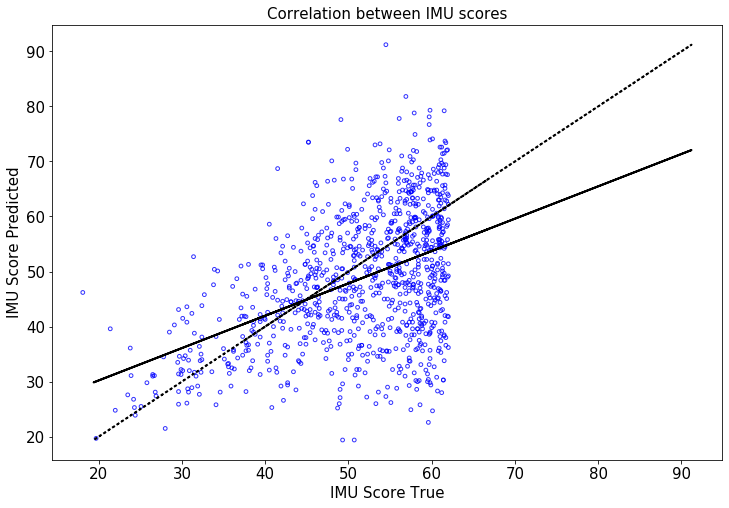

In [312]:
scatter_dset = fs_merged_df[~fs_merged_df['IMU Score'].isnull()]

plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(scatter_dset['IMU Score'], scatter_dset['imu_score_hat'], s=14.0, color='blue', alpha=0.8, facecolors='none')
plt.xlabel("IMU Score True", fontsize=15)
plt.ylabel("IMU Score Predicted", fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('Correlation between IMU scores',fontsize=15)
b, m = polyfit(scatter_dset['IMU Score'], scatter_dset['imu_score_hat'], 1)
plt.plot(scatter_dset['imu_score_hat'], b + m * scatter_dset['imu_score_hat'], '-', linewidth=2.0, color='black')
plt.plot(scatter_dset['imu_score_hat'], 1 * scatter_dset['imu_score_hat'], ':', linewidth=2.0, color='black')
plt.savefig('images/imu_correlation.png',bbox_inches='tight')

# Fit with polyfit
print("Correlation", m)

plt.show()

### Creating a graph similar to a BinScatter chart

In [76]:
fs_merged_df['imu_score_hat_ceil'] = np.ceil(fs_merged_df['imu_score_hat'])
stats_ds = fs_merged_df.groupby('imu_score_hat_ceil')['is_MUA'].agg(['count', 'mean']).reset_index()
stats_ds

,imu_score_hat_ceil,count,mean
0,20.0,3,1.000000
1,22.0,1,1.000000
2,23.0,1,1.000000
3,24.0,2,0.500000
4,25.0,4,0.750000
...,...,...,...
70,91.0,8,0.000000
71,92.0,12,0.083333
72,93.0,4,0.000000
73,95.0,1,0.000000


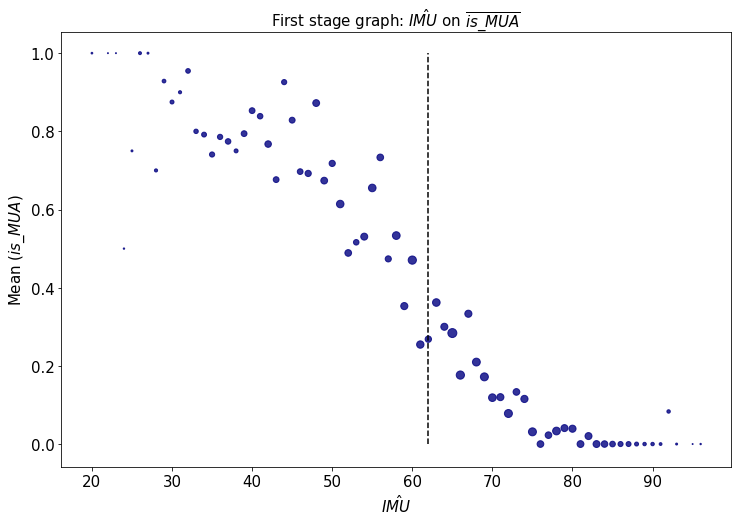

In [77]:
# FSG1
# With IMU_score_hat ceiling and predicted MUA on Y-axis
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_ds['imu_score_hat_ceil'], stats_ds['mean'], color='navy', alpha=0.8, s=stats_ds['count'])
plt.xlabel("$\hat{IMU}$", fontsize=15)
plt.ylabel("Mean ($is\_MUA$)", fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('First stage graph: $\hat{IMU}$ on $\overline{is\_MUA}$',fontsize=15)
#plt.plot(joined['imu_score_hat'], b + m * joined['imu_score_hat'], '-', linewidth=2.0, color='black')
plt.vlines(62, 0, 1, linestyles='dashed');
plt.savefig('images/first_stage_true.png',bbox_inches='tight')

## Bin Scatter

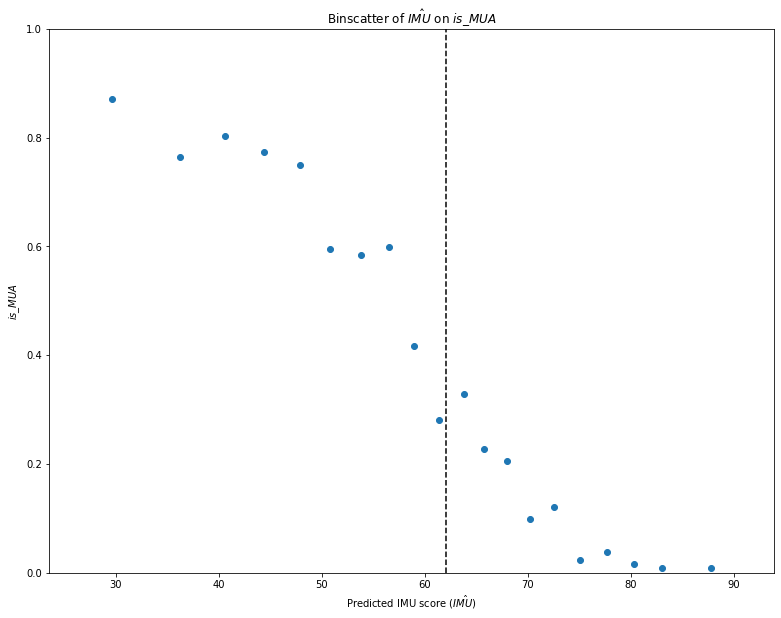

In [78]:
fig, ax = plt.subplots(figsize=(13, 10))

# Binned scatter plot of wage vs tenure
ax.binscatter(fs_merged_df['imu_score_hat'], fs_merged_df['is_MUA'], line_kwargs={"linewidth": 0})
ax.set_title('Binscatter of $\hat{IMU}$ on $is\_MUA$')
ax.set_xlabel('Predicted IMU score ($\hat{IMU}$)')
ax.set_ylabel('$is\_MUA$')
ax.set_ylim(0, 1)
plt.vlines(62, 0, 1, linestyles='dashed')
plt.savefig('images/first_stage_binscatter.png',bbox_inches='tight');

In [79]:
import inspect
inspect.getargspec(ax.binscatter)

ArgSpec(args=['self', 'x', 'y', 'controls', 'n_bins', 'line_kwargs', 'scatter_kwargs', 'recenter_x', 'recenter_y', 'bins'], varargs=None, keywords=None, defaults=(None, 20, None, None, False, True, None))

## Confusion Matrix: Getting TP, FP, TN, FN

In [80]:
def get_metrics_m(row):
    if ((row['is_MUA_hat']==1) & (row['is_MUA']==1)):
        return 'TP'
    elif ((row['is_MUA_hat']==1) & (row['is_MUA']==0)):
        return 'FP'
    elif ((row['is_MUA_hat']==0) & (row['is_MUA']==0)):
        return 'TN'
    else:
        return 'FN'

In [81]:
# Adding TP, FP, TN, FN columns
fs_merged_df['TP'] = ((fs_merged_df['is_MUA_hat']==1) & (fs_merged_df['is_MUA']==1)).astype(int)
fs_merged_df['FP'] = ((fs_merged_df['is_MUA_hat']==1) & (fs_merged_df['is_MUA']==0)).astype(int)
fs_merged_df['TN'] = ((fs_merged_df['is_MUA_hat']==0) & (fs_merged_df['is_MUA']==0)).astype(int)
fs_merged_df['FN'] = ((fs_merged_df['is_MUA_hat']==0) & (fs_merged_df['is_MUA']==1)).astype(int)

In [82]:
fs_merged_df["class"] = fs_merged_df.apply(get_metrics_m, axis=1)
stats_cnt = fs_merged_df.groupby("class").count()[["imu_score_hat_ceil"]].rename({"imu_score_hat_ceil": "Count"}, axis=1)
print("Total =", sum(stats_cnt['Count']))
print("Accuracy = ", (stats_cnt.loc["TN"]["Count"]+stats_cnt.loc["TP"]["Count"])/sum(stats_cnt["Count"]))
stats_cnt

Total = 2636
Accuracy =  0.7727617602427921


,Count
class,
FN,153
FP,446
TN,1201
TP,836


## 2D summary across the confusion matrix

In [83]:
fs_merged_df.columns

Index(['State', 'State_Abbr', 'County', 'imu_subscore_4', 'num_physicians',
       'physicians_per_1000_population', 'county_fips', 'live_births',
       'infant_deaths', 'infant_mortality_rate', 'imu_subscore_2',
       'persons_in_poverty_1970', 'total_population', 'imu_subscore_1',
       'age_65_and_above', 'imu_subscore_3', 'imu_score_hat', 'is_MUA_hat',
       'SMSAA', 'Common State County FIPS Code', 'MUA/P Status Description',
       'IMU Score', 'is_MUA', 'imu_score_hat_ceil', 'TP', 'FP', 'TN', 'FN',
       'class'],
      dtype='object')

In [84]:
globalcounts = []
globalmeans = []
globalstds = []

classified = ['TP', 'TN', 'FP', 'FN']
variables = ['total_population', 'age_65_and_above', 'persons_in_poverty_1970',
             'num_physicians', 'physicians_per_1000_population', 'live_births',
             'infant_deaths', 'infant_mortality_rate',
             'imu_subscore_1', 'imu_subscore_2', 'imu_subscore_3', 'imu_subscore_4']

for variable in variables:
    means = []
    counts = []
    stds = []
    
    filtered = fs_merged_df.copy(deep=True)
        
    for metric_m in classified:
        mymean = list(filtered.groupby(metric_m).mean()[variable])[1]
        mycount = list(filtered.groupby(metric_m).count()[variable])[1]
        mystd = list(filtered.groupby(metric_m).std()[variable])[1]
        means+= [mymean]
        counts += [mycount]
        stds += [mystd]
        
    means.append(np.mean(filtered[variable]))
    globalmeans.append(means)
    
    counts.append(len(filtered[variable]))
    globalcounts.append(counts)
    
    stds.append(np.std(filtered[variable]))
    globalstds.append(stds)
    
final_data = []
for i in range(len(globalmeans)):
    final_data.append(globalmeans[i])
    final_data.append(globalstds[i])
    final_data.append(globalcounts[i])

In [85]:
len(globalmeans), len(globalcounts)

(12, 12)

In [86]:
# hierarchical indices and columns
index = pd.MultiIndex.from_product([variables, 
                                    ["Mean", "SD", "Count"]],
                                   names=['', ''])
columns = pd.Index(classified+["Overall"])

# create the DataFrame
descriptive_data = pd.DataFrame(final_data, index=index, columns=columns).round(2)
descriptive_data

TP        TN        FP        FN  \
                                                                               
total_population               Mean   15275.85  40415.42  15436.90  23256.95   
                               SD     12538.60  79466.10  12980.52  24455.90   
                               Count    836.00   1201.00    446.00    153.00   
age_65_and_above               Mean    1754.47   4449.65   1962.96   2510.79   
                               SD      1193.13   8374.40   2144.49   2404.53   
                               Count    836.00   1201.00    446.00    153.00   
persons_in_poverty_1970        Mean    4833.40   4959.50   3943.50   4904.89   
                               SD      4134.86   7085.94   4078.27   5373.20   
                               Count    836.00   1201.00    446.00    153.00   
num_physicians                 Mean       6.13     43.47      6.96     15.91   
                               SD         7.87    173.60      8.88     20.32   
                               Count    836.00   1201.00    446.00    153.00   
physicians_per_1000_population Mean       0.34      0.78      0.39      0.60   
                               SD         0.21      0.64      0.21      0.41   
                               Count    836.00   1201.00    446.00    153.00   
live_births                    Mean    1430.82   3423.32   1317.22   2084.37   
                               SD      1383.30   6706.01   1248.24   2391.08   
                               Count    836.00   1201.00    446.00    153.00   
infant_deaths                  Mean      42.08     68.89     36.08     47.76   
                               SD        44.71    131.81     39.78     63.16   
                               Count    836.00   1201.00    446.00    153.00   
infant_mortality_rate          Mean      27.87     19.27     26.70     18.85   
                               SD         9.05      5.15     13.32      6.80   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_1                 Mean       7.45     17.89     11.52     13.91   
                               SD         5.31      3.03      5.68      3.50   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_2                 Mean      10.05     17.47     11.16     17.50   
                               SD         6.70      4.69      6.47      5.71   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_3                 Mean      18.00     18.74     17.62     18.41   
                               SD         3.20      2.00      3.45      2.28   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_4                 Mean       9.86     20.83     11.59     17.57   
                               SD         6.51      6.51      6.77      7.10   
                               Count    836.00   1201.00    446.00    153.00   

                                       Overall  
                                                
total_population               Mean   27220.30  
                               SD     56004.10  
                               Count   2636.00  
age_65_and_above               Mean    3061.61  
                               SD      5926.90  
                               Count   2636.00  
persons_in_poverty_1970        Mean    4744.44  
                               SD      5734.07  
                               Count   2636.00  
num_physicians                 Mean      23.85  
                               SD       118.76  
                               Count   2636.00  
physicians_per_1000_population Mean       0.57  
                               SD         0.51  
                               Count   2636.00  
live_births                    Mean    2357.34  
                               SD      4759.03  
                               Count   2636.00  
infant_deaths          

In [87]:
descriptive_data.to_excel("output/stats_by_confusion.xls")

## US Map Choropleth Graph with the distribution of counties in these 4 classes

In [88]:
counties_data = geopandas.read_file('input/geopandas-counties/UScounties.shp')
counties = counties_data.merge(fs_merged_df, how="inner", left_on="FIPS", right_on="county_fips")
type(counties_data)

geopandas.geodataframe.GeoDataFrame

In [89]:
counties_data.head()

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,geometry
0,Lake of the Woods,Minnesota,27,077,27077,"POLYGON ((-95.34283 48.54668, -95.34105 48.715..."
1,Ferry,Washington,53,019,53019,"POLYGON ((-118.85163 47.94956, -118.84846 48.4..."
2,Stevens,Washington,53,065,53065,"POLYGON ((-117.43883 48.04412, -117.54219 48.0..."
3,Okanogan,Washington,53,047,53047,"POLYGON ((-118.97209 47.93915, -118.97406 47.9..."
4,Pend Oreille,Washington,53,051,53051,"POLYGON ((-117.43858 48.99992, -117.03205 48.9..."


In [90]:
len(counties_data)

3141

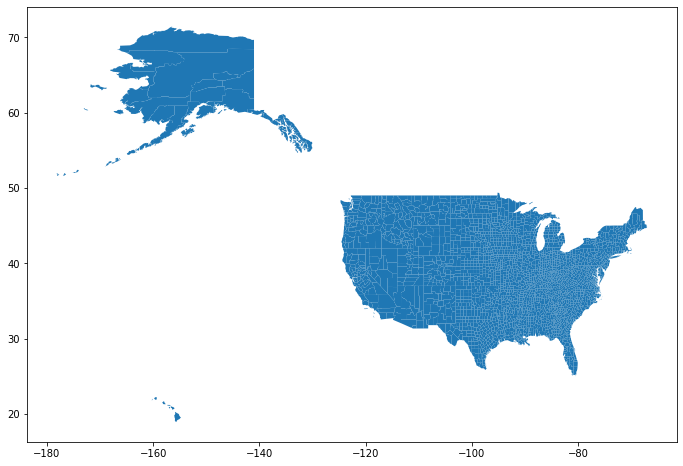

In [91]:
counties_data.plot()

In [92]:
counties = counties_data.merge(fs_merged_df, how="inner", left_on="FIPS", right_on="county_fips")
counties

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,geometry,State,State_Abbr,County,imu_subscore_4,...,Common State County FIPS Code,MUA/P Status Description,IMU Score,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,class
0,Lake of the Woods,Minnesota,27,077,27077,"POLYGON ((-95.34283 48.54668, -95.34105 48.715...",Minnesota,MN,Lake of the Woods,16.9,...,NaN,NaN,NaN,0,73.0,0,0,1,0,TN
1,Ferry,Washington,53,019,53019,"POLYGON ((-118.85163 47.94956, -118.84846 48.4...",Washington,WA,Ferry,16.9,...,NaN,NaN,NaN,0,68.0,0,0,1,0,TN
2,Stevens,Washington,53,065,53065,"POLYGON ((-117.43883 48.04412, -117.54219 48.0...",Washington,WA,Stevens,16.9,...,NaN,NaN,NaN,0,66.0,0,0,1,0,TN
3,Okanogan,Washington,53,047,53047,"POLYGON ((-118.97209 47.93915, -118.97406 47.9...",Washington,WA,Okanogan,23.1,...,NaN,NaN,NaN,0,78.0,0,0,1,0,TN
4,Pend Oreille,Washington,53,051,53051,"POLYGON ((-117.43858 48.99992, -117.03205 48.9...",Washington,WA,Pend Oreille,25.3,...,53051,Designated,50.7,1,60.0,1,0,0,0,TP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2631,Steuben,Indiana,18,151,18151,"POLYGON ((-84.79137 41.53049, -85.19715 41.537...",Indiana,IN,Steuben,14.8,...,NaN,NaN,NaN,0,72.0,0,0,1,0,TN
2632,Kauai,Hawaii,15,007,15007,"MULTIPOLYGON (((-159.33517 21.94834, -159.4395...",Hawaii,HI,Kauai,25.9,...,NaN,NaN,NaN,0,81.0,0,0,1,0,TN
2633,Maui,Hawaii,15,009,15009,"MULTIPOLYGON (((-156.19605 20.63165, -156.2763...",Hawaii,HI,Maui,28.0,...,NaN,NaN,NaN,0,92.0,0,0,1,0,TN
2634,Hawaii,Hawaii,15,001,15001,"POLYGON ((-155.66619 18.92179, -155.77859 19.0...",Hawaii,HI,Hawaii,25.9,...,NaN,NaN,NaN,0,79.0,0,0,1,0,TN


In [93]:
len(counties)

2636

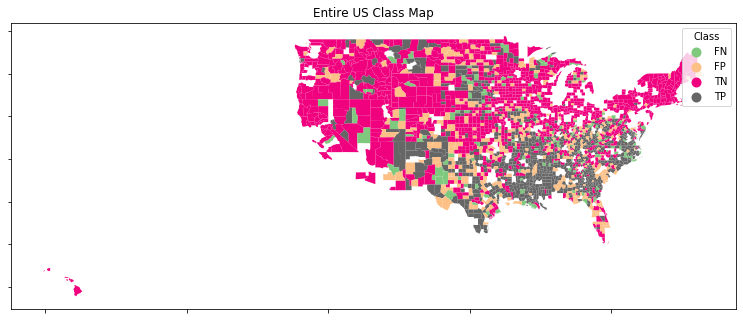

In [94]:
fig, ax = plt.subplots(figsize=(13, 10))
counties.plot(column='class', categorical=True, ax=ax, legend=True, legend_kwds={'title': 'Class'}, cmap='Accent')
ax.set(xticklabels=[], yticklabels=[])
ax.grid(False)
plt.title("Entire US Class Map");

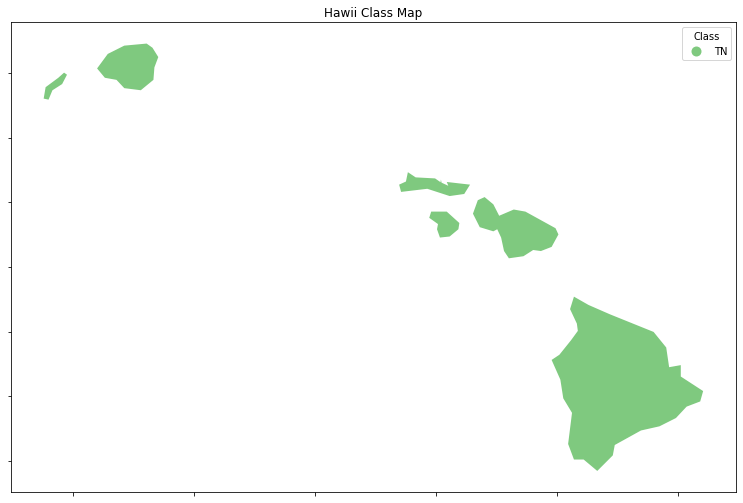

In [95]:
# Graph for only Hawaii
fig, ax = plt.subplots(figsize=(13, 10))
counties[counties["STATE_NAME"]=="Hawaii"].plot(column='class', categorical=True, ax=ax, legend=True, legend_kwds={'title': 'Class'}, cmap='Accent')
ax.set(xticklabels=[], yticklabels=[])
ax.grid(False)
plt.title("Hawii Class Map");

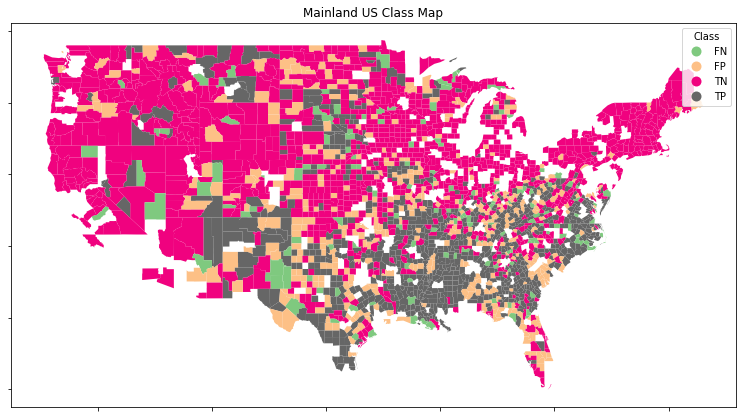

In [96]:
fig, ax = plt.subplots(figsize=(13, 10))
counties[counties["STATE_NAME"]!="Hawaii"].plot(column='class', categorical=True, ax=ax, legend=True, legend_kwds={'title': 'Class'}, cmap='Accent')
ax.set(xticklabels=[], yticklabels=[])
ax.grid(False)
plt.title("Mainland US Class Map")
plt.savefig('images/mainland_us_class.png',bbox_inches='tight');

### How accurate in our classification are we by state?

In [97]:
def accuracyByState(row):
    return (row['TP']+row['TN'])/(row['TP']+row['TN']+row['FN']+row['FP'])

In [98]:
grouped_counties = counties.groupby("STATE_NAME").sum()
grouped_counties['Accuracy'] = grouped_counties.apply(accuracyByState, axis=1)
grouped_counties = grouped_counties.sort_values("Accuracy", ascending=True)[["Accuracy", "TP", "TN", "FP", "FN"]].reset_index()
grouped_counties

,STATE_NAME,Accuracy,TP,TN,FP,FN
0,Florida,0.418182,9,14,29,3
1,Delaware,0.500000,0,1,0,1
2,South Carolina,0.512821,12,8,19,0
3,Kentucky,0.575221,45,20,40,8
4,Texas,0.635514,92,44,68,10
5,New Mexico,0.645161,14,6,7,4
6,Oklahoma,0.647059,24,20,21,3
7,West Virginia,0.666667,20,12,12,4
8,Alabama,0.690909,36,2,14,3
9,North Dakota,0.692308,0,36,16,0


In [99]:
grouped_counties.to_excel("output/accuracy_by_state.xls", index=False)

## Recreating the first stage graph using new labeled dataset as Y axis

In [100]:
completed_dset = pd.read_excel("input/state_county_names-no-highlight.xlsx",
                              dtype={'FIPS': str}).fillna(0.0)
completed_dset

,NAME,TOTAL COUNTIES,MCD/CCD,CENSUS TRACT,Notes,FIPS
0,Alabama,0.0,0.0,0.0,0,0
1,Autauga,1.0,0.0,0.0,0,01001
2,Baldwin,0.0,0.0,1.0,0,01003
3,Barbour,1.0,0.0,0.0,0,01005
4,Bibb,1.0,0.0,0.0,0,01007
...,...,...,...,...,...,...
3187,Sweetwater,0.0,0.0,0.0,0,56037
3188,Teton,0.0,0.0,0.0,0,56039
3189,Uinta,0.0,0.0,0.0,0,56041
3190,Washakie,0.0,0.0,0.0,0,56043


In [101]:
completed_dset = completed_dset[["NAME", "TOTAL COUNTIES", "FIPS"]]
completed_dset = completed_dset[completed_dset["FIPS"]!=0.0]
completed_dset

,NAME,TOTAL COUNTIES,FIPS
1,Autauga,1.0,01001
2,Baldwin,0.0,01003
3,Barbour,1.0,01005
4,Bibb,1.0,01007
5,Blount,1.0,01009
...,...,...,...
3187,Sweetwater,0.0,56037
3188,Teton,0.0,56039
3189,Uinta,0.0,56041
3190,Washakie,0.0,56043


In [102]:
new_dset = fs_merged_df.merge(completed_dset, left_on='county_fips', right_on='FIPS')
new_dset.rename(columns={"TOTAL COUNTIES": "is_MUA_new"}, inplace=True)
new_dset

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,class,NAME,is_MUA_new,FIPS
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,...,0,43.0,0,1,0,0,FP,Autauga,1.0,01001
1,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,...,0,44.0,0,1,0,0,FP,Barbour,1.0,01005
2,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,1,38.0,1,0,0,0,TP,Bibb,1.0,01007
3,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,1,51.0,1,0,0,0,TP,Blount,1.0,01009
4,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,1,37.0,1,0,0,0,TP,Bullock,1.0,01011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2631,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,...,0,76.0,0,0,1,0,TN,Sweetwater,0.0,56037
2632,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,...,0,95.0,0,0,1,0,TN,Teton,0.0,56039
2633,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,...,0,96.0,0,0,1,0,TN,Uinta,0.0,56041
2634,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,...,0,75.0,0,0,1,0,TN,Washakie,0.0,56043


In [103]:
new_dset['imu_score_hat_ceil'] = np.ceil(new_dset['imu_score_hat'])
stats_ds_3 = new_dset.groupby('imu_score_hat_ceil')['is_MUA_new'].agg(['count', 'mean']).reset_index()
stats_ds_3

,imu_score_hat_ceil,count,mean
0,20.0,3,1.00
1,22.0,1,1.00
2,23.0,1,1.00
3,24.0,2,1.00
4,25.0,4,0.75
...,...,...,...
70,91.0,8,0.00
71,92.0,12,0.00
72,93.0,4,0.00
73,95.0,1,0.00


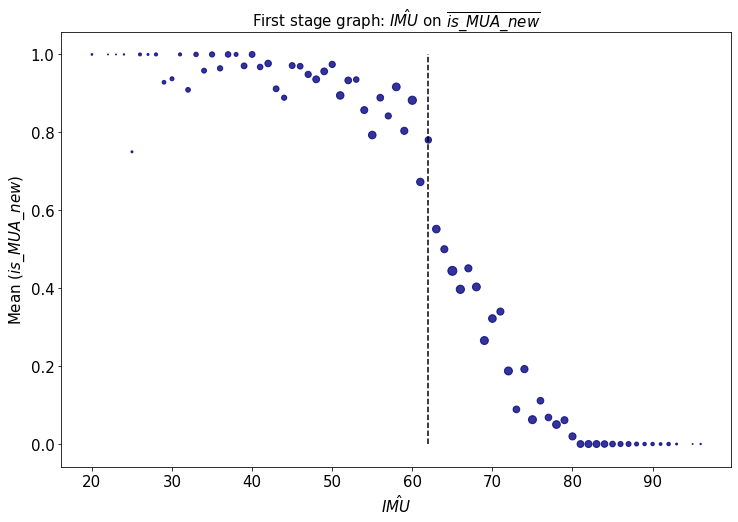

In [104]:
# FSG2
# With IMU_hat on the x_axis and is_MUA_new (from Federal Register on the Y-axis)
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_ds_3['imu_score_hat_ceil'], stats_ds_3['mean'], color='navy', alpha=0.8, s=stats_ds_3['count'])
plt.xlabel("$\hat{IMU}$", fontsize=15)
plt.ylabel("Mean ($is\_MUA\_new$)", fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('First stage graph: $\hat{IMU}$ on $\overline{is\_MUA\_new}$',fontsize=15)
#plt.plot(joined['imu_score_hat'], b + m * joined['imu_score_hat'], '-', linewidth=2.0, color='black')
plt.vlines(62, 0, 1, linestyles='dashed');
plt.savefig('images/first_stage_true_register.png',bbox_inches='tight')

## Recreating the first stage graph with IMU for all designated counties and IMU hat for all non-designated counties

In [105]:
new_dset.columns

Index(['State', 'State_Abbr', 'County', 'imu_subscore_4', 'num_physicians',
       'physicians_per_1000_population', 'county_fips', 'live_births',
       'infant_deaths', 'infant_mortality_rate', 'imu_subscore_2',
       'persons_in_poverty_1970', 'total_population', 'imu_subscore_1',
       'age_65_and_above', 'imu_subscore_3', 'imu_score_hat', 'is_MUA_hat',
       'SMSAA', 'Common State County FIPS Code', 'MUA/P Status Description',
       'IMU Score', 'is_MUA', 'imu_score_hat_ceil', 'TP', 'FP', 'TN', 'FN',
       'class', 'NAME', 'is_MUA_new', 'FIPS'],
      dtype='object')

In [106]:
def getImuOrImuHat(row):
    # If county is not present in HRSA dataset, is IMU_hat
    if pd.isnull(row["MUA/P Status Description"]):
        return row['imu_score_hat']
    # Else use IMU score
    else:
        return row['IMU Score']

new_dset['imu_fs'] = new_dset.apply(getImuOrImuHat, axis=1)
new_dset

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,imu_score_hat_ceil,TP,FP,TN,FN,class,NAME,is_MUA_new,FIPS,imu_fs
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,...,43.0,0,1,0,0,FP,Autauga,1.0,01001,42.3
1,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,...,44.0,0,1,0,0,FP,Barbour,1.0,01005,43.8
2,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,38.0,1,0,0,0,TP,Bibb,1.0,01007,47.7
3,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,51.0,1,0,0,0,TP,Blount,1.0,01009,56.1
4,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,37.0,1,0,0,0,TP,Bullock,1.0,01011,61.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2631,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,...,76.0,0,0,1,0,TN,Sweetwater,0.0,56037,75.2
2632,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,...,95.0,0,0,1,0,TN,Teton,0.0,56039,94.8
2633,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,...,96.0,0,0,1,0,TN,Uinta,0.0,56041,95.0
2634,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,...,75.0,0,0,1,0,TN,Washakie,0.0,56043,74.7


## First stage graph with is_MUA

In [107]:
# First stage graph with is_MUA
new_dset['imu_ceil'] = np.ceil(new_dset['imu_fs'])
stats_ds_4 = new_dset.groupby('imu_ceil')['is_MUA'].agg(['count', 'mean']).reset_index()
stats_ds_4

,imu_ceil,count,mean
0,19.0,1,1.00
1,20.0,1,1.00
2,22.0,2,1.00
3,24.0,4,0.75
4,25.0,4,0.75
...,...,...,...
70,91.0,8,0.00
71,92.0,11,0.00
72,93.0,4,0.00
73,95.0,1,0.00


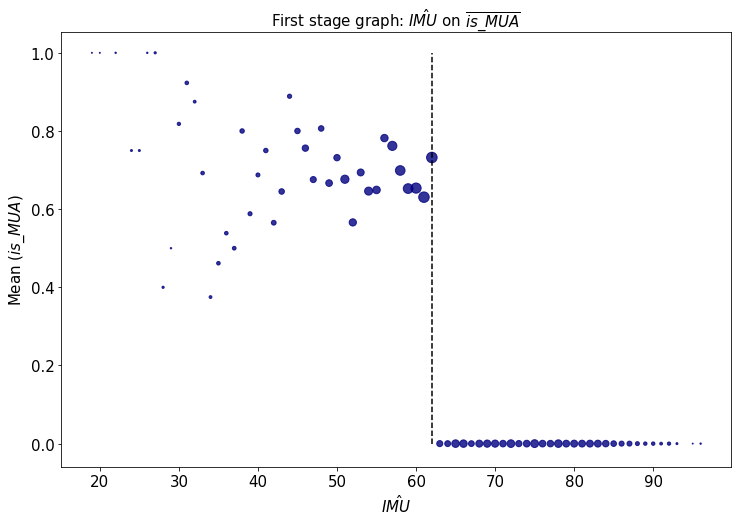

In [108]:
# FSG3
# With true IMU used for all classified MUA counties, and estimated IMU used for rest
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_ds_4['imu_ceil'], stats_ds_4['mean'], color='navy', alpha=0.8, s=stats_ds_4['count'])
plt.xlabel("$\hat{IMU}$", fontsize=15)
plt.ylabel("Mean ($is\_MUA$)", fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('First stage graph: $\hat{IMU}$ on $\overline{is\_MUA}$',fontsize=15)
plt.vlines(62, 0, 1, linestyles='dashed');
plt.savefig('images/first_stage_is_MUA_edition.png',bbox_inches='tight')

### First stage graph with is_MUA_new

In [109]:
# First stage graph with is_MUA_new
new_dset['imu_ceil_new'] = np.ceil(new_dset['imu_fs'])
stats_ds_5 = new_dset.groupby('imu_ceil_new')['is_MUA_new'].agg(['count', 'mean']).reset_index()
stats_ds_5

,imu_ceil_new,count,mean
0,19.0,1,1.00
1,20.0,1,1.00
2,22.0,2,1.00
3,24.0,4,0.75
4,25.0,4,0.75
...,...,...,...
70,91.0,8,0.00
71,92.0,11,0.00
72,93.0,4,0.00
73,95.0,1,0.00


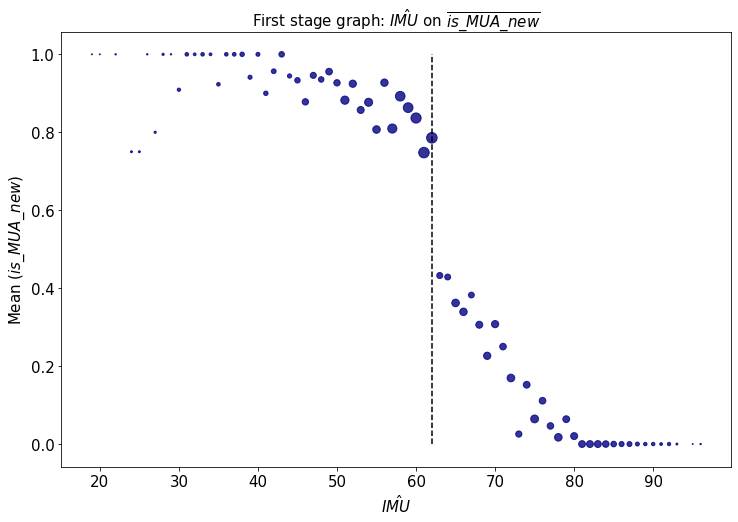

In [110]:
# FSG4
# With true IMU used for all classified MUA counties, and estimated IMU used for rest.
# Additionally, the Y-axis has been changed to reflect is_MUA in Federal Register rather than dataset
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_ds_5['imu_ceil_new'], stats_ds_5['mean'], color='navy', alpha=0.8, s=stats_ds_5['count'])
plt.xlabel("$\hat{IMU}$", fontsize=15)
plt.ylabel("Mean ($is\_MUA\_new$)", fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('First stage graph: $\hat{IMU}$ on $\overline{is\_MUA\_new}$',fontsize=15)
#plt.plot(joined['imu_score_hat'], b + m * joined['imu_score_hat'], '-', linewidth=2.0, color='black')
plt.vlines(62, 0, 1, linestyles='dashed');
plt.savefig('images/first_stage_is_MUA_new_edition.png',bbox_inches='tight')

## Heterogeneity in IMU_hat - IMU based on different characteristics

In [111]:
descriptive_data

TP        TN        FP        FN  \
                                                                               
total_population               Mean   15275.85  40415.42  15436.90  23256.95   
                               SD     12538.60  79466.10  12980.52  24455.90   
                               Count    836.00   1201.00    446.00    153.00   
age_65_and_above               Mean    1754.47   4449.65   1962.96   2510.79   
                               SD      1193.13   8374.40   2144.49   2404.53   
                               Count    836.00   1201.00    446.00    153.00   
persons_in_poverty_1970        Mean    4833.40   4959.50   3943.50   4904.89   
                               SD      4134.86   7085.94   4078.27   5373.20   
                               Count    836.00   1201.00    446.00    153.00   
num_physicians                 Mean       6.13     43.47      6.96     15.91   
                               SD         7.87    173.60      8.88     20.32   
                               Count    836.00   1201.00    446.00    153.00   
physicians_per_1000_population Mean       0.34      0.78      0.39      0.60   
                               SD         0.21      0.64      0.21      0.41   
                               Count    836.00   1201.00    446.00    153.00   
live_births                    Mean    1430.82   3423.32   1317.22   2084.37   
                               SD      1383.30   6706.01   1248.24   2391.08   
                               Count    836.00   1201.00    446.00    153.00   
infant_deaths                  Mean      42.08     68.89     36.08     47.76   
                               SD        44.71    131.81     39.78     63.16   
                               Count    836.00   1201.00    446.00    153.00   
infant_mortality_rate          Mean      27.87     19.27     26.70     18.85   
                               SD         9.05      5.15     13.32      6.80   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_1                 Mean       7.45     17.89     11.52     13.91   
                               SD         5.31      3.03      5.68      3.50   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_2                 Mean      10.05     17.47     11.16     17.50   
                               SD         6.70      4.69      6.47      5.71   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_3                 Mean      18.00     18.74     17.62     18.41   
                               SD         3.20      2.00      3.45      2.28   
                               Count    836.00   1201.00    446.00    153.00   
imu_subscore_4                 Mean       9.86     20.83     11.59     17.57   
                               SD         6.51      6.51      6.77      7.10   
                               Count    836.00   1201.00    446.00    153.00   

                                       Overall  
                                                
total_population               Mean   27220.30  
                               SD     56004.10  
                               Count   2636.00  
age_65_and_above               Mean    3061.61  
                               SD      5926.90  
                               Count   2636.00  
persons_in_poverty_1970        Mean    4744.44  
                               SD      5734.07  
                               Count   2636.00  
num_physicians                 Mean      23.85  
                               SD       118.76  
                               Count   2636.00  
physicians_per_1000_population Mean       0.57  
                               SD         0.51  
                               Count   2636.00  
live_births                    Mean    2357.34  
                               SD      4759.03  
                               Count   2636.00  
infant_deaths          

In [112]:
diff_checker = fs_merged_df[fs_merged_df["is_MUA"]==1]
diff_checker["imu_diff"] = diff_checker["imu_score_hat"] - diff_checker["IMU Score"]
diff_checker

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,MUA/P Status Description,IMU Score,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,class,imu_diff
2,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,Designated,47.7,1,38.0,1,0,0,0,TP,-10.3
3,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,Designated,56.1,1,51.0,1,0,0,0,TP,-6.0
4,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,Designated,61.7,1,37.0,1,0,0,0,TP,-25.1
6,Alabama,AL,Calhoun,20.7,62.0,0.601405,01015,9976,210,21.050521,...,Designated,61.9,1,73.0,0,0,0,1,FN,10.2
8,Alabama,AL,Cherokee,10.7,6.0,0.384468,01019,1177,25,21.240442,...,Designated,56.1,1,58.0,1,0,0,0,TP,1.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2575,Wisconsin,WI,Iron,4.1,1.0,0.153069,55051,317,12,37.854890,...,Designated,55.2,1,42.0,1,0,0,0,TP,-13.7
2595,Wisconsin,WI,Price,12.6,6.0,0.413223,55099,1057,22,20.813623,...,Designated,60.1,1,62.0,1,0,0,0,TP,1.2
2598,Wisconsin,WI,Rusk,12.6,6.0,0.421408,55107,1072,27,25.186567,...,Designated,59.4,1,56.0,1,0,0,0,TP,-3.7
2607,Wisconsin,WI,Vilas,14.8,5.0,0.456288,55125,667,14,20.989505,...,Designated,61.1,1,64.0,0,0,0,1,FN,2.4


In [113]:
diff_checker[diff_checker['State']=='Delaware']

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,MUA/P Status Description,IMU Score,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,class,imu_diff
234,Delaware,DE,Sussex,25.9,72.0,0.896013,10005,7759,216,27.838639,...,Designated,61.3,1,72.0,0,0,0,1,FN,10.1


### Heterogeneity by State

In [114]:
diff_by_state = diff_checker.groupby("State").mean()[["imu_diff"]].rename(columns={"imu_diff": "mean"})
diff_by_state["std_dev"] = diff_checker.groupby("State").std()["imu_diff"]
diff_by_state["count"] = diff_checker.groupby("State").count()["imu_diff"]
diff_by_state.sort_values("mean", ascending=True)

,mean,std_dev,count
State,,,
Alabama,-8.946154,12.900446,39
Louisiana,-8.517647,10.598579,51
Texas,-7.857843,11.550281,102
Tennessee,-7.514894,9.179845,47
Kentucky,-6.258491,12.994206,53
Missouri,-5.942857,9.824714,49
Georgia,-5.897170,12.036124,106
Virginia,-5.816364,12.209844,55
Florida,-3.950000,16.409725,12


In [115]:
np.mean(diff_checker['imu_diff'])

-2.7954499494438823

In [116]:
np.mean(diff_by_state['mean'])

1.2093300003960001

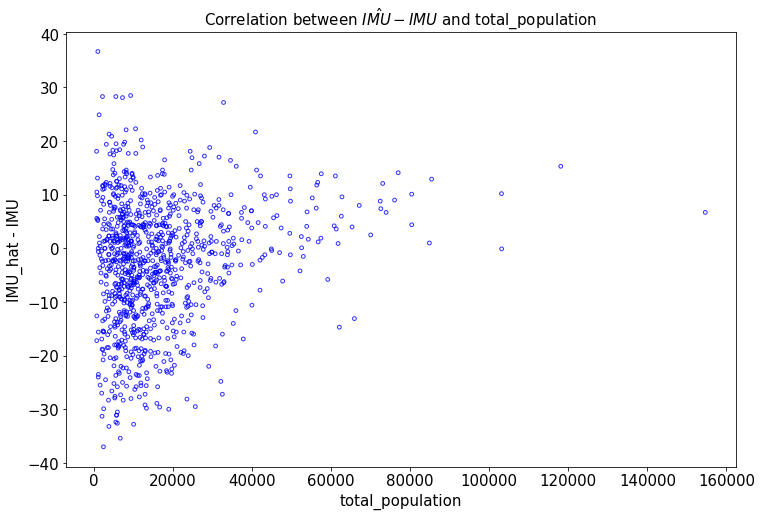

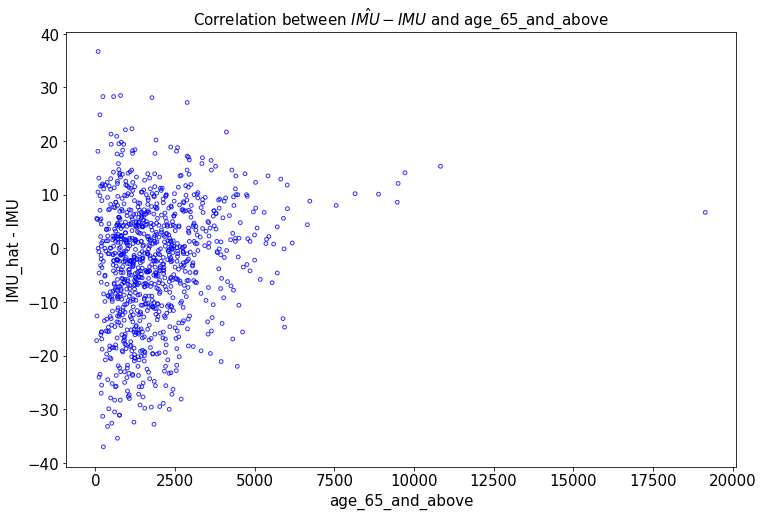

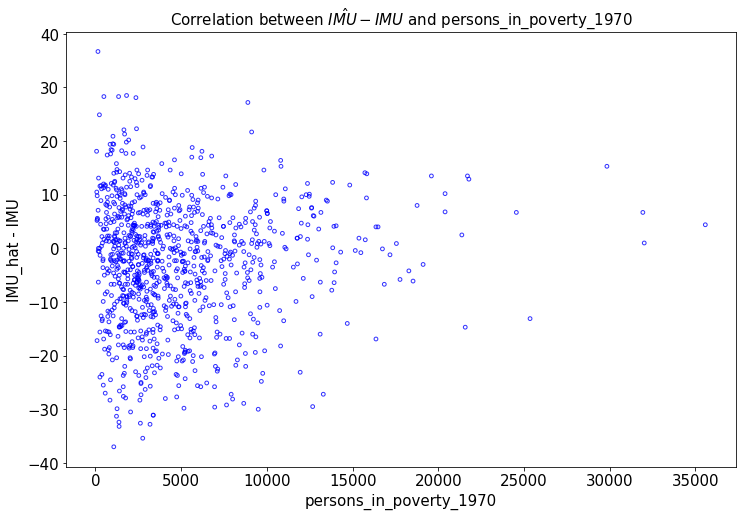

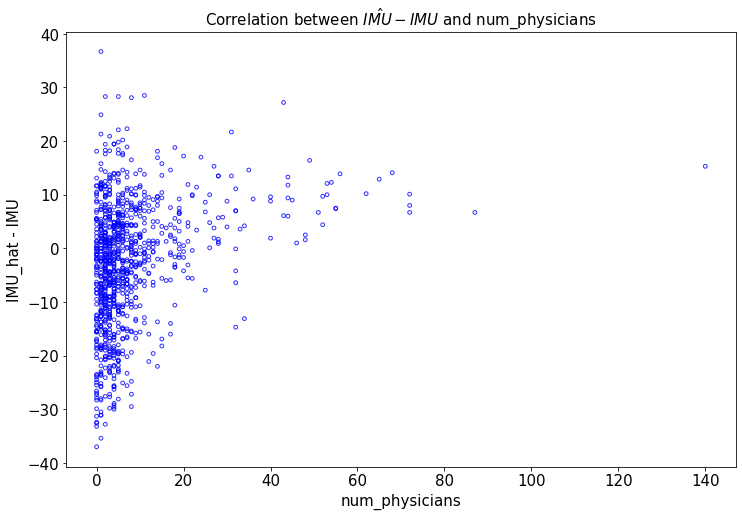

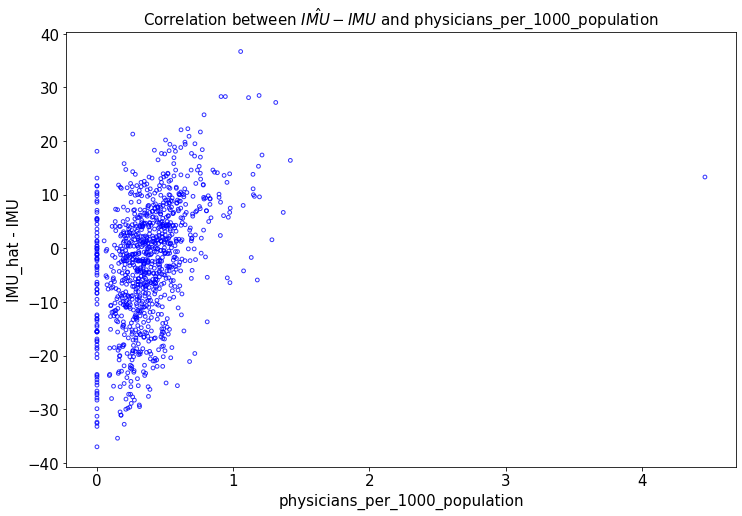

...

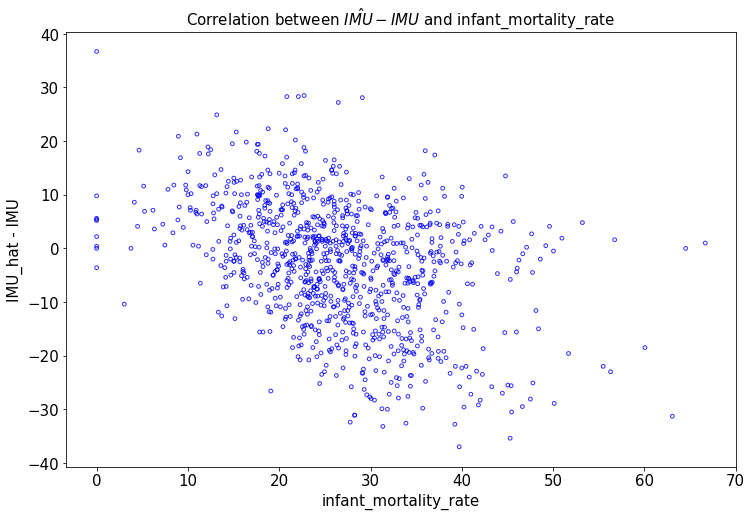

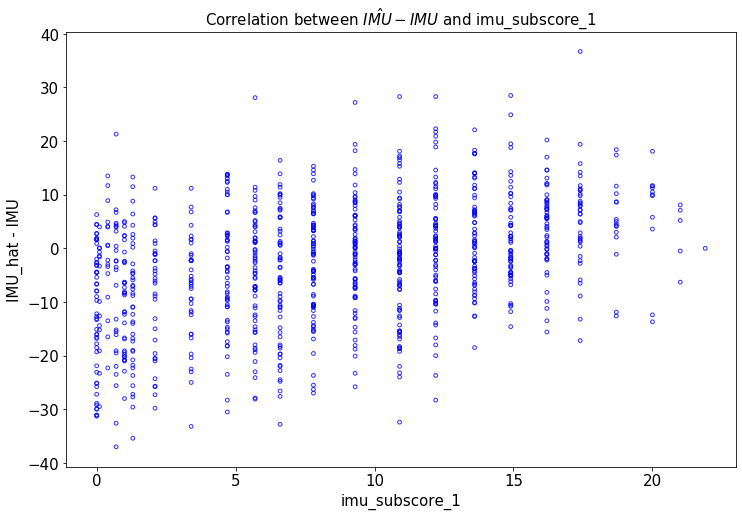

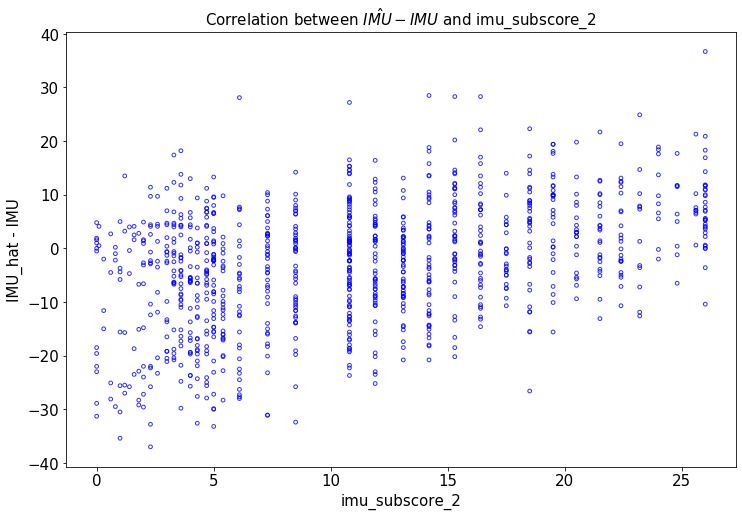

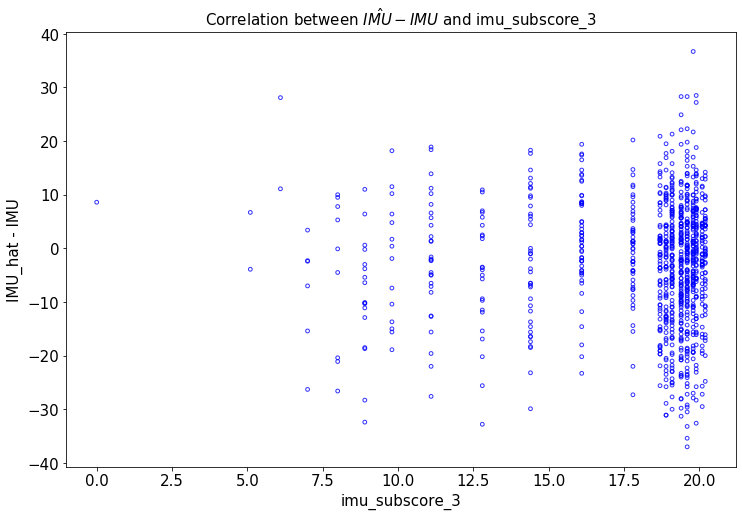

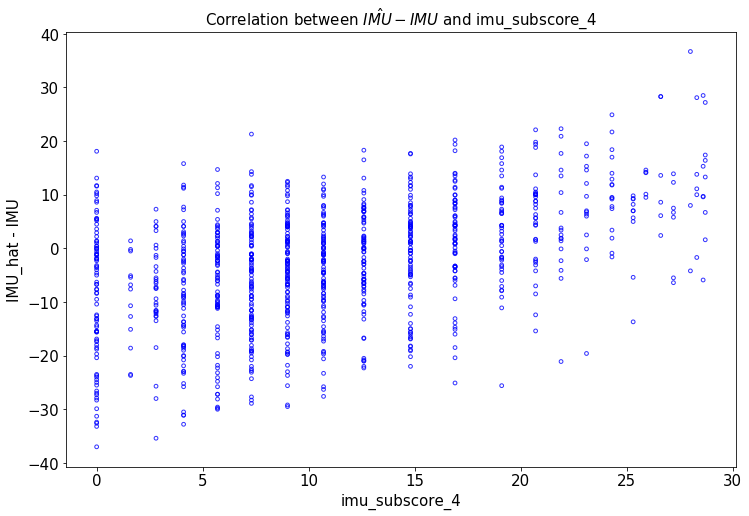

In [117]:
# Heterogeneity in IMU_hat - IMU based on different characteristics

variables = ['total_population', 'age_65_and_above', 'persons_in_poverty_1970',
             'num_physicians', 'physicians_per_1000_population', 'live_births',
             'infant_deaths', 'infant_mortality_rate',
             'imu_subscore_1', 'imu_subscore_2', 'imu_subscore_3', 'imu_subscore_4']

for statistic in variables:
    plt.rcParams["figure.figsize"] = (12,8)
    plt.scatter(diff_checker[statistic], diff_checker['imu_diff'], s=14.0, color='blue', alpha=0.8, facecolors='none')
    plt.xlabel(statistic, fontsize=15)
    plt.ylabel("IMU_hat - IMU", fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.title('Correlation between $\hat{IMU} - IMU$ and ' + statistic,fontsize=15)
    # plt.savefig('images/imu_correlation.png',bbox_inches='tight')
    plt.show()

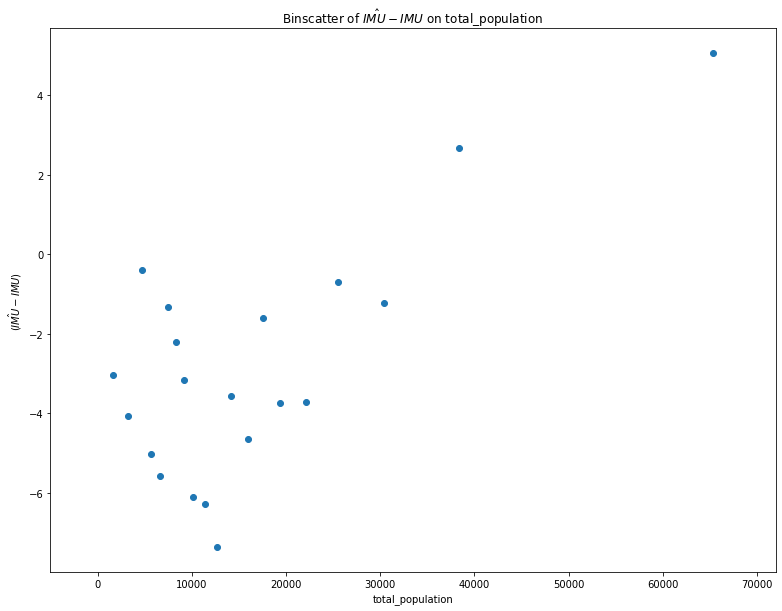

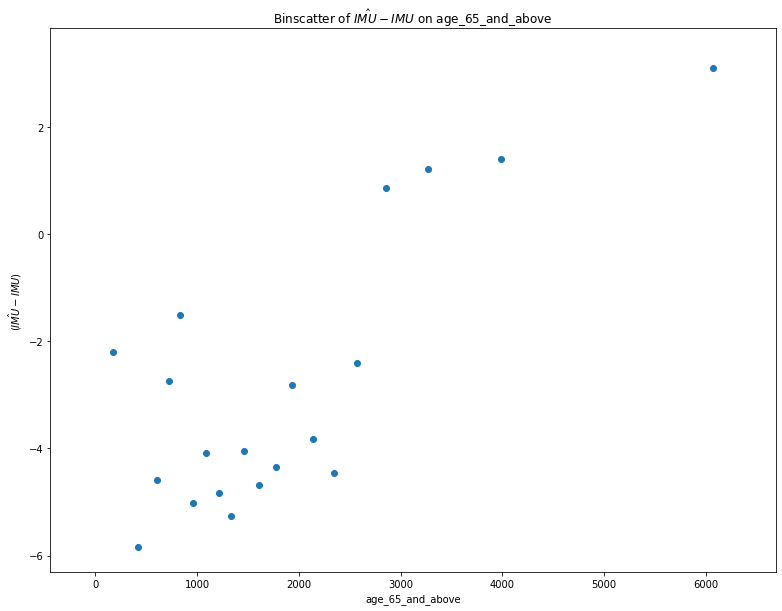

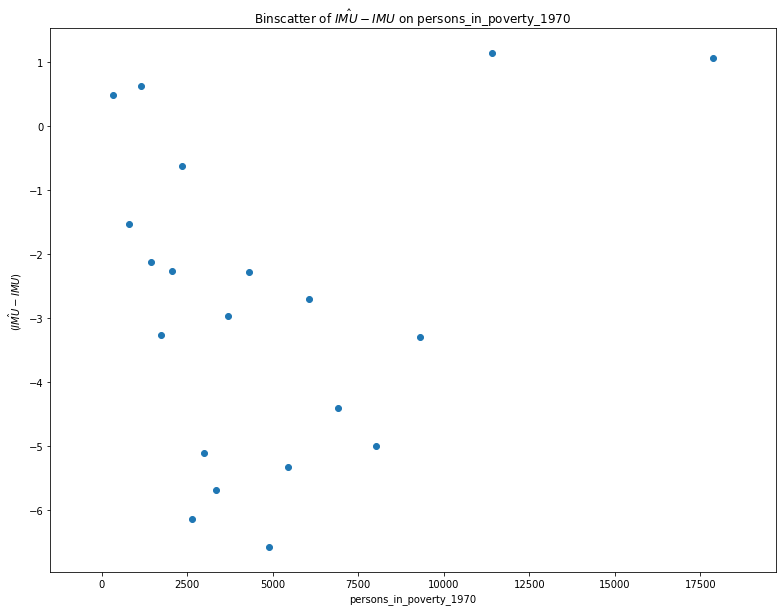

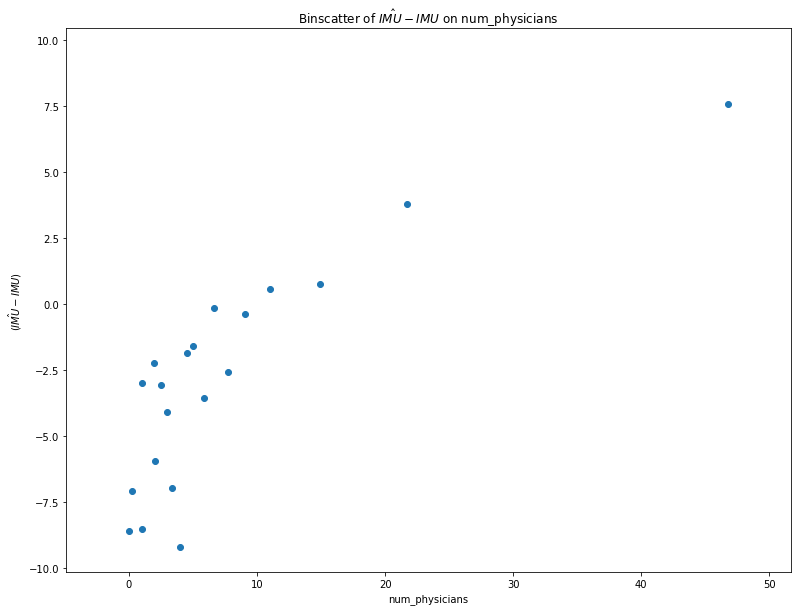

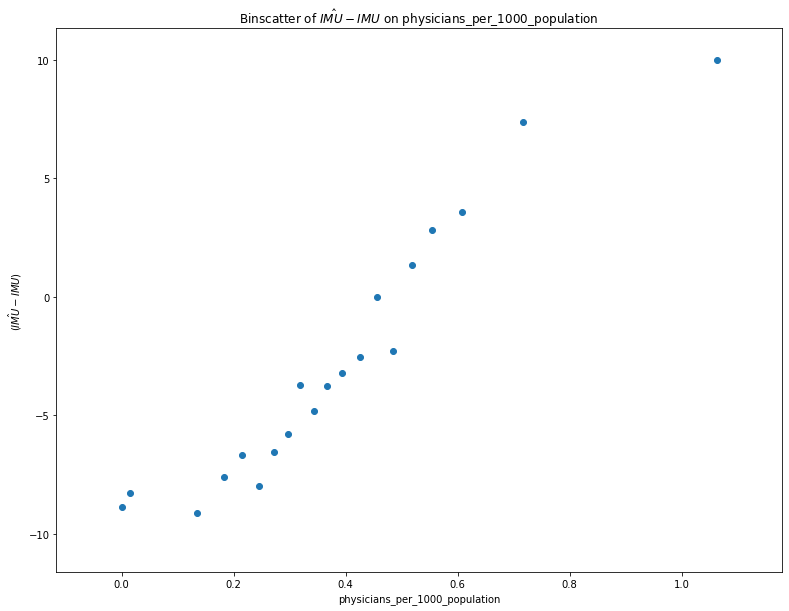

...

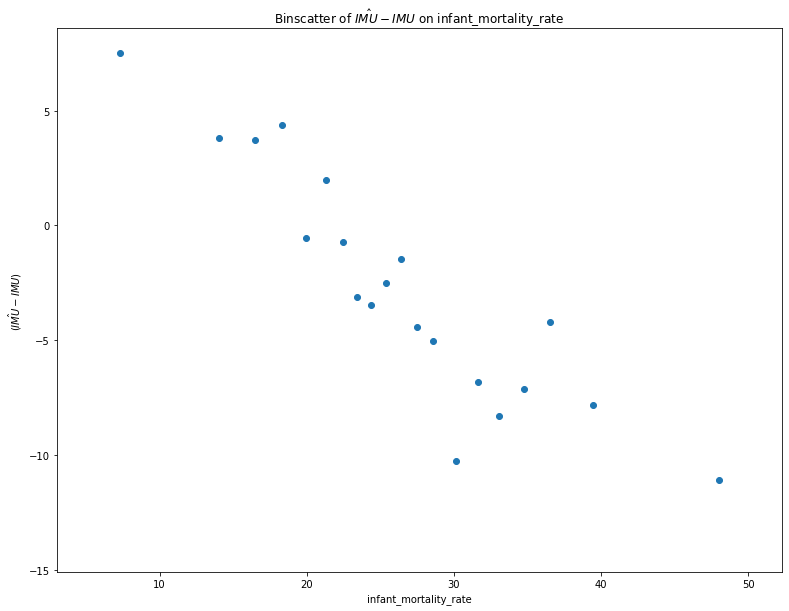

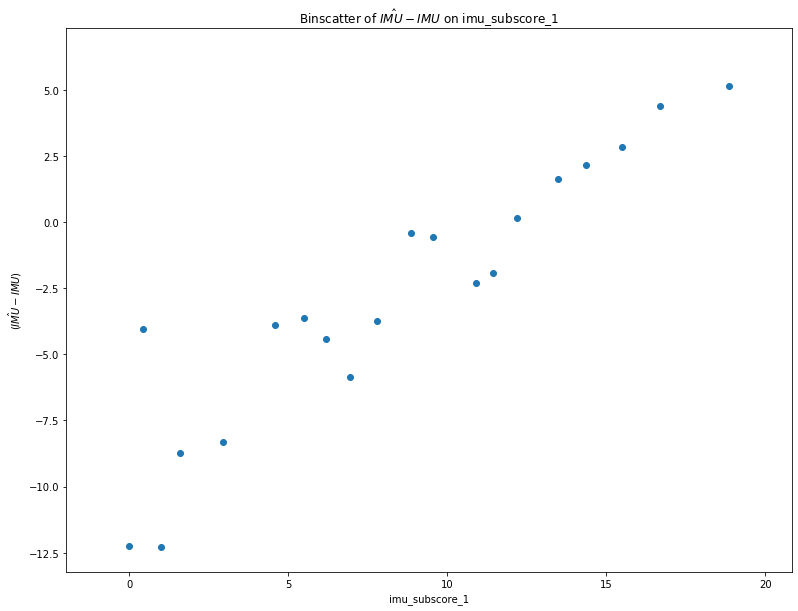

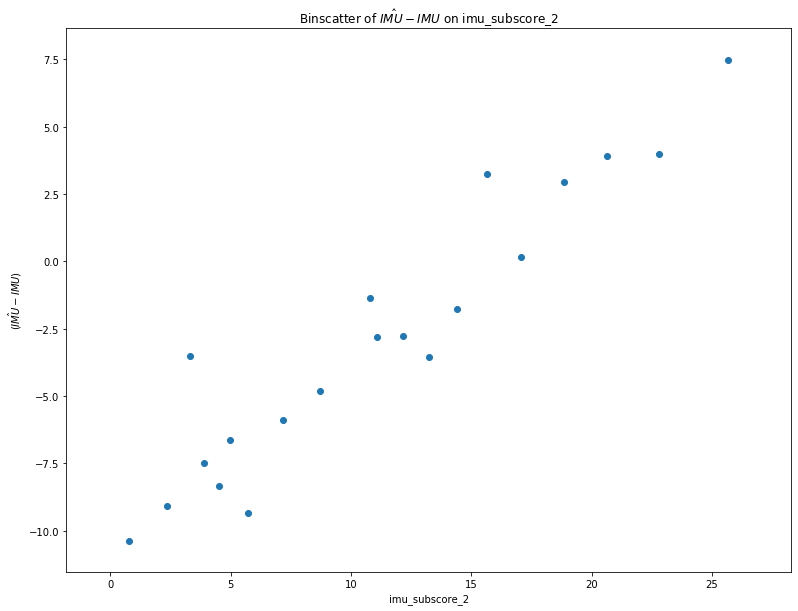

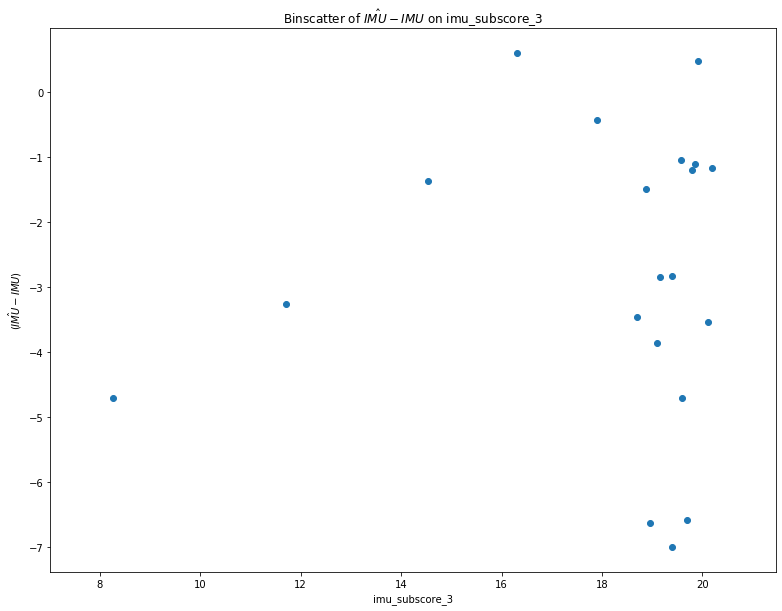

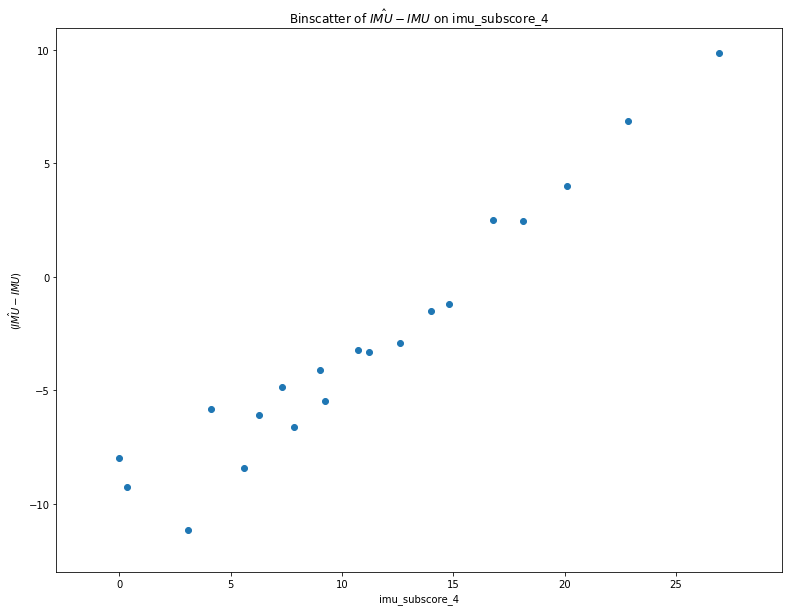

In [118]:
for statistic in variables:
    fig, ax = plt.subplots(figsize=(13, 10))
    
    ax.binscatter(diff_checker[statistic], diff_checker['imu_diff'], line_kwargs={"linewidth": 0})
    ax.set_title('Binscatter of $\hat{IMU}-IMU$ on ' + statistic)
    ax.set_xlabel(statistic)
    ax.set_ylabel('($\hat{IMU}-IMU$)')
    #ax.set_ylim(0, 1)
#plt.savefig('images/first_stage_binscatter.png',bbox_inches='tight');

## In-meeting work

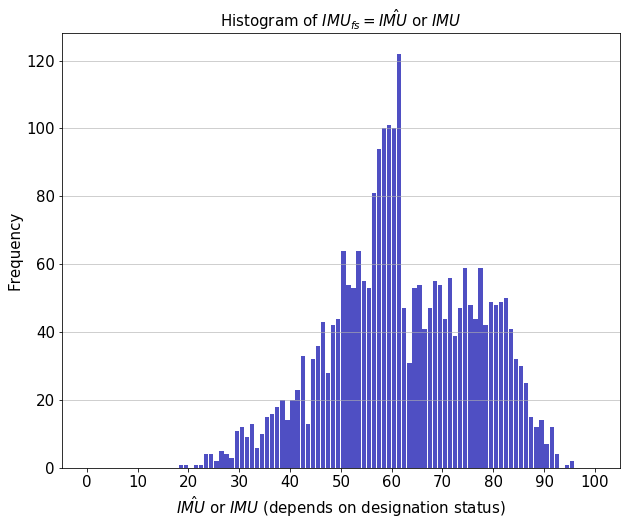

In [119]:
# Histogram of IMU_score_hat (for non-designated) and IMU Score (for designated counties)
plt.figure(figsize=[10,8])

n, bins, patches = plt.hist(x=new_dset['imu_fs'], bins=np.arange(0,101,1), color='#0504aa',alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('$\hat{IMU}$ or $IMU$ (depends on designation status)',fontsize=15)
plt.ylabel('Frequency',fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(0,101,10))
plt.yticks(fontsize=15)
plt.title('Histogram of $IMU_{fs} = \hat{IMU}$ or $IMU$',fontsize=15)
plt.savefig('images/imu_fs_histogram.png',bbox_inches='tight')
plt.show()

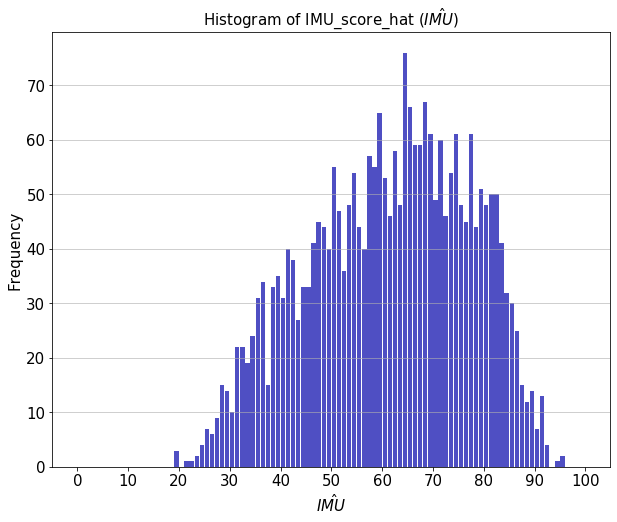

In [120]:
# Histogram of IMU_score_hat

plt.figure(figsize=[10,8])

n, bins, patches = plt.hist(x=new_dset['imu_score_hat'], bins=np.arange(0,101,1), color='#0504aa',alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('$\hat{IMU}$',fontsize=15)
plt.ylabel('Frequency',fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(0,101,10))
plt.yticks(fontsize=15)
plt.title('Histogram of IMU_score_hat $(\hat{IMU})$',fontsize=15)
plt.savefig('images/imu_score_hat_histogram.png',bbox_inches='tight')
plt.show()

## Balance Test

In [121]:
w_i_s = ['total_population', 'age_65_and_above', 'persons_in_poverty_1970',
             'num_physicians', 'physicians_per_1000_population', 'live_births',
             'infant_deaths', 'infant_mortality_rate']
w_i_s

['total_population',
 'age_65_and_above',
 'persons_in_poverty_1970',
 'num_physicians',
 'physicians_per_1000_population',
 'live_births',
 'infant_deaths',
 'infant_mortality_rate']

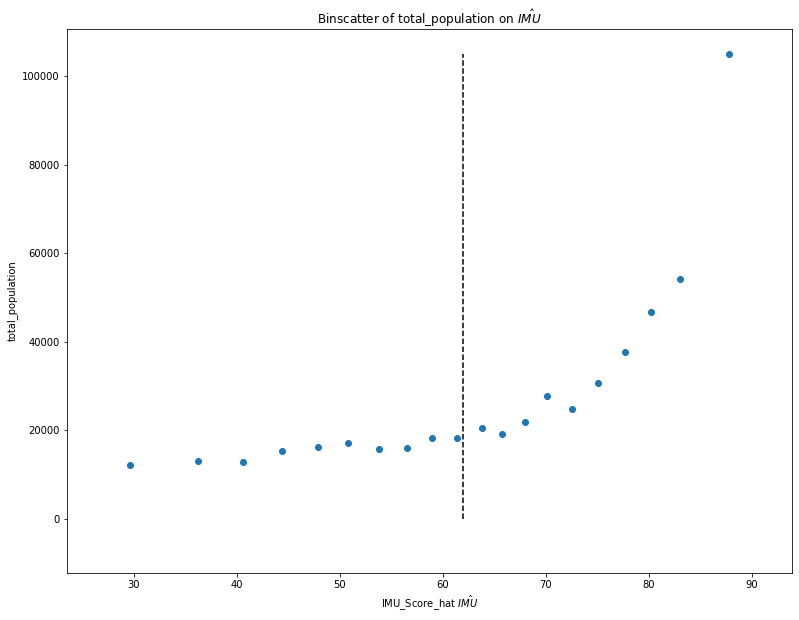

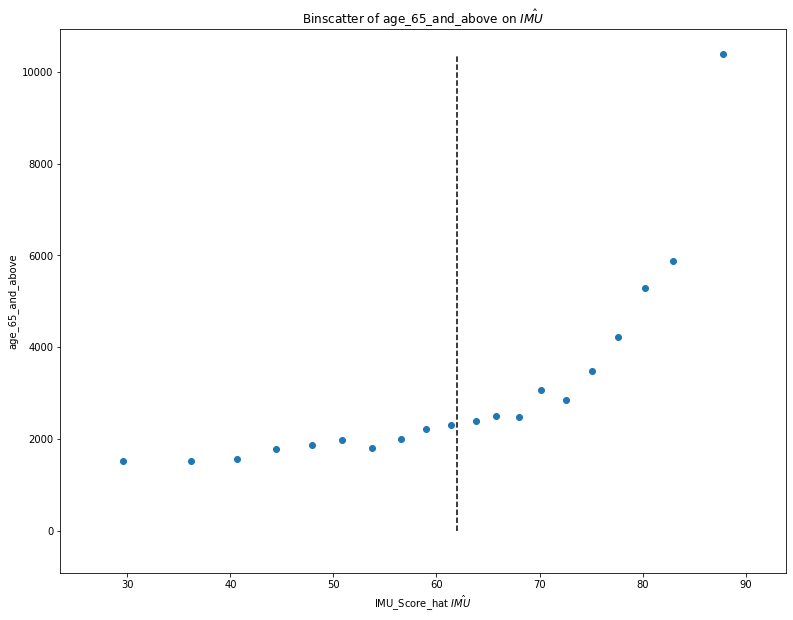

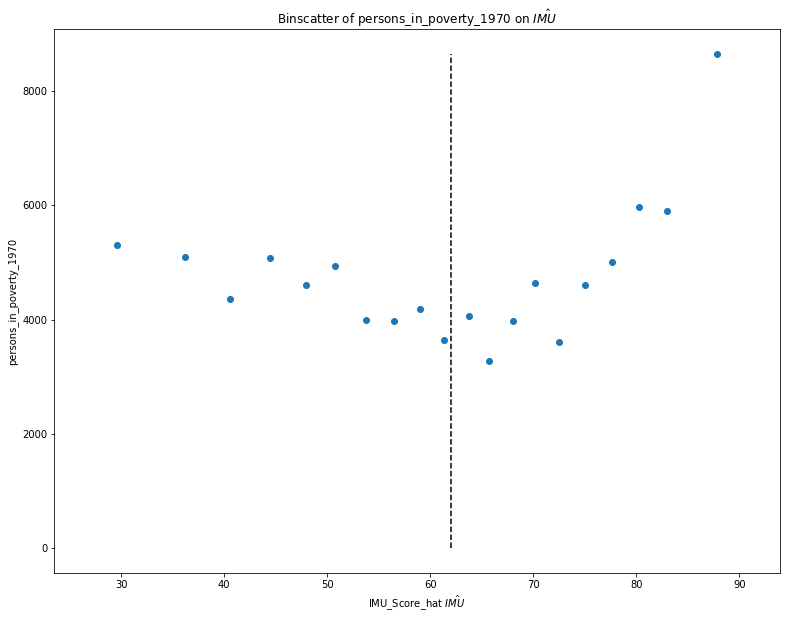

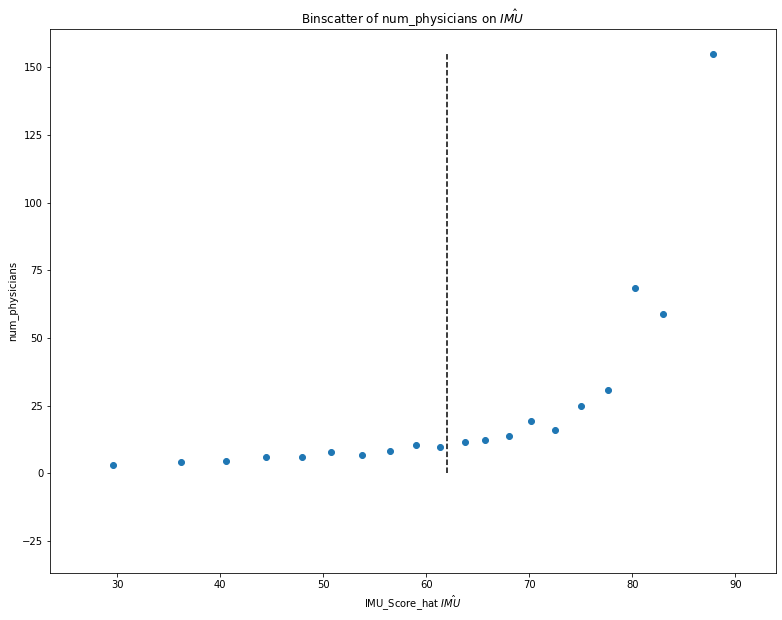

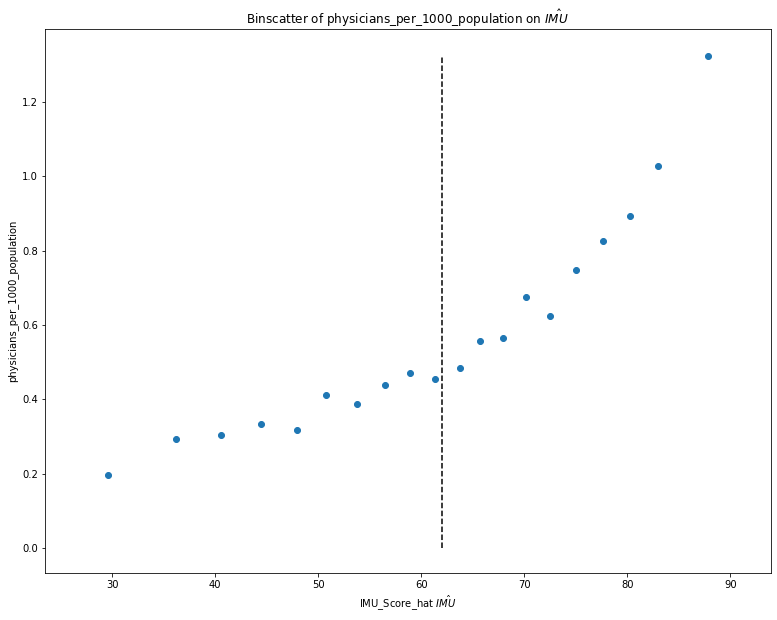

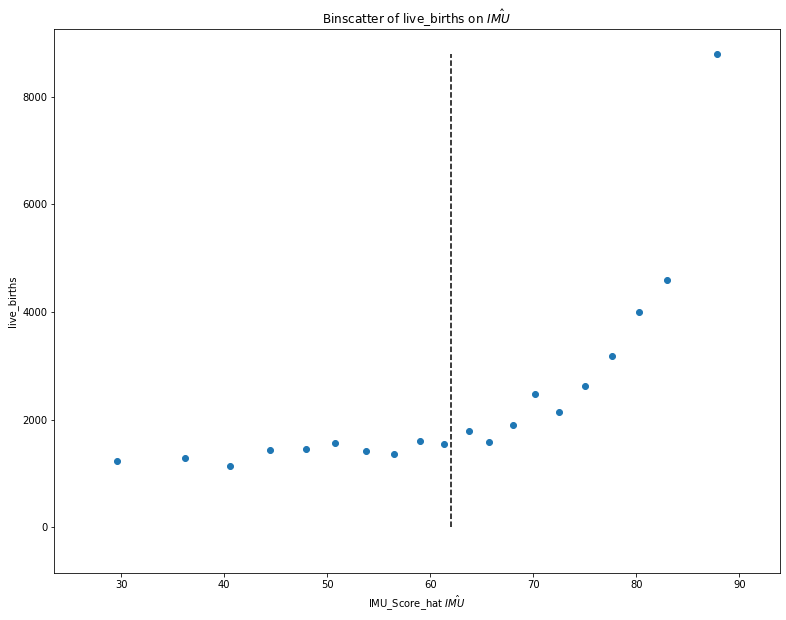

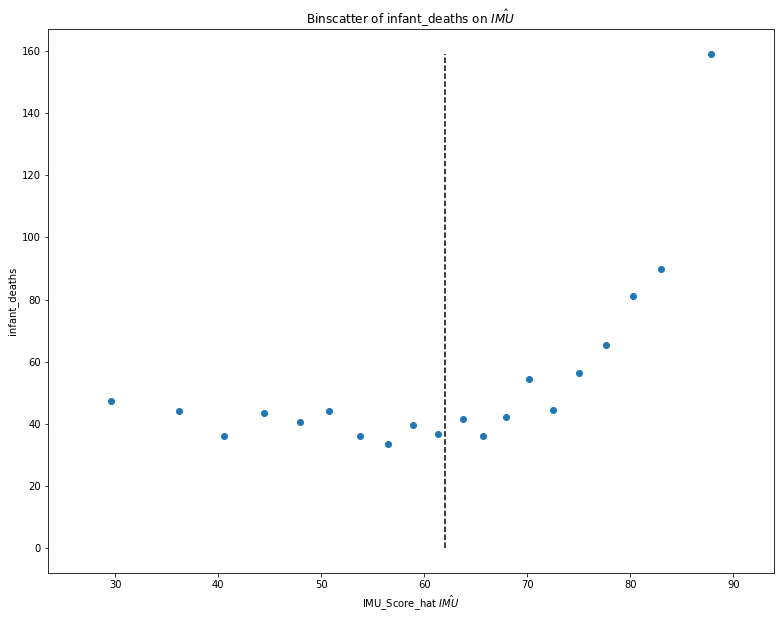

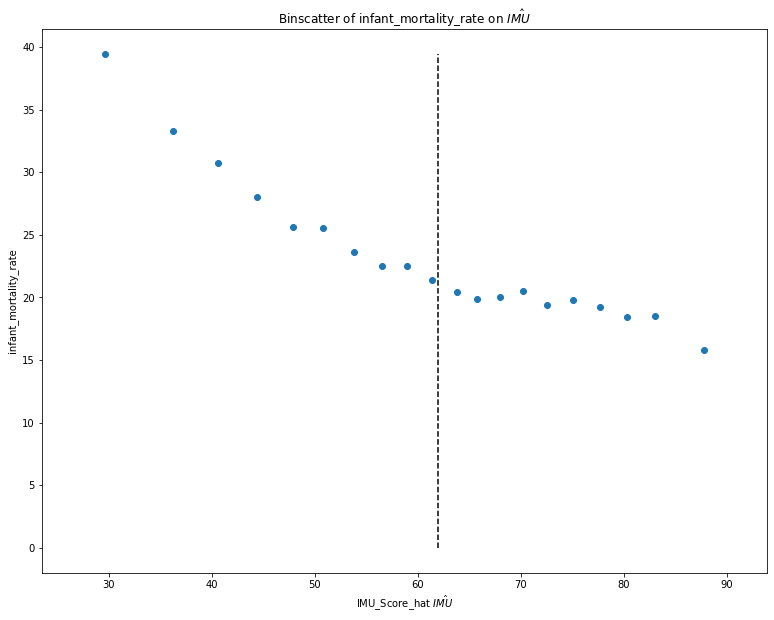

In [122]:
# Check if indicators/characteristics do not misbehave around cutoff

for w_i in w_i_s:
    fig, ax = plt.subplots(figsize=(13, 10))
    
    binscatterRange = ax.binscatter(fs_merged_df['imu_score_hat'], fs_merged_df[w_i], line_kwargs={"linewidth": 0})
    ax.vlines(62, 0, max(binscatterRange[1]), linestyles='dashed')
    ax.set_title('Binscatter of {} on '.format(w_i) + '$\hat{IMU}$')
    ax.set_xlabel("IMU_Score_hat $\hat{IMU}$")
    ax.set_ylabel(w_i)

## [Optional] Compute the true `IMU_subscore_4`

In [123]:
# Filtering only for designated counties as we are only certain about their IMU score
working_dataset = fs_merged_df[fs_merged_df['is_MUA']==1]

working_dataset['imu_subscore_4_new'] = working_dataset['IMU Score'] - working_dataset['imu_subscore_1'] - \
                                            working_dataset['imu_subscore_2'] - working_dataset['imu_subscore_3']
working_dataset

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,MUA/P Status Description,IMU Score,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,class,imu_subscore_4_new
2,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,Designated,47.7,1,38.0,1,0,0,0,TP,17.6
3,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,Designated,56.1,1,51.0,1,0,0,0,TP,10.1
4,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,Designated,61.7,1,37.0,1,0,0,0,TP,42.0
6,Alabama,AL,Calhoun,20.7,62.0,0.601405,01015,9976,210,21.050521,...,Designated,61.9,1,73.0,0,0,0,1,FN,10.5
8,Alabama,AL,Cherokee,10.7,6.0,0.384468,01019,1177,25,21.240442,...,Designated,56.1,1,58.0,1,0,0,0,TP,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2575,Wisconsin,WI,Iron,4.1,1.0,0.153069,55051,317,12,37.854890,...,Designated,55.2,1,42.0,1,0,0,0,TP,17.8
2595,Wisconsin,WI,Price,12.6,6.0,0.413223,55099,1057,22,20.813623,...,Designated,60.1,1,62.0,1,0,0,0,TP,11.4
2598,Wisconsin,WI,Rusk,12.6,6.0,0.421408,55107,1072,27,25.186567,...,Designated,59.4,1,56.0,1,0,0,0,TP,16.3
2607,Wisconsin,WI,Vilas,14.8,5.0,0.456288,55125,667,14,20.989505,...,Designated,61.1,1,64.0,0,0,0,1,FN,12.4


In [124]:
new_lst_v4

[(0.0, 0.0),
 (0.001, 0.5),
 (0.051, 1.6),
 (0.101, 2.8),
 (0.151, 4.1),
 (0.201, 5.7),
 (0.251, 7.3),
 (0.301, 9.0),
 (0.351, 10.7),
 (0.401, 12.6),
 (0.451, 14.8),
 (0.501, 16.9),
 (0.551, 19.1),
 (0.601, 20.7),
 (0.651, 21.9),
 (0.701, 23.1),
 (0.751, 24.3),
 (0.801, 25.3),
 (0.851, 25.9),
 (0.901, 26.6),
 (0.951, 27.2),
 (1.001, 27.7),
 (1.051, 28.0),
 (1.101, 28.3),
 (1.151, 28.6),
 (1.2, 28.7)]

In [125]:
def reversePhysicianSubscore(val, mapLst):
    for i in range(0, len(mapLst), 1):
        if (val <= mapLst[i][1]):
            return mapLst[i][0]
    return mapLst[len(mapLst)-1][0]

In [126]:
working_dataset['physician_indicator'] = working_dataset['imu_subscore_4_new'].apply(reversePhysicianSubscore, args=(new_lst_v4,))
working_dataset

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,IMU Score,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,class,imu_subscore_4_new,physician_indicator
2,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,47.7,1,38.0,1,0,0,0,TP,17.6,0.551
3,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,56.1,1,51.0,1,0,0,0,TP,10.1,0.351
4,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,61.7,1,37.0,1,0,0,0,TP,42.0,1.200
6,Alabama,AL,Calhoun,20.7,62.0,0.601405,01015,9976,210,21.050521,...,61.9,1,73.0,0,0,0,1,FN,10.5,0.351
8,Alabama,AL,Cherokee,10.7,6.0,0.384468,01019,1177,25,21.240442,...,56.1,1,58.0,1,0,0,0,TP,9.0,0.351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2575,Wisconsin,WI,Iron,4.1,1.0,0.153069,55051,317,12,37.854890,...,55.2,1,42.0,1,0,0,0,TP,17.8,0.551
2595,Wisconsin,WI,Price,12.6,6.0,0.413223,55099,1057,22,20.813623,...,60.1,1,62.0,1,0,0,0,TP,11.4,0.401
2598,Wisconsin,WI,Rusk,12.6,6.0,0.421408,55107,1072,27,25.186567,...,59.4,1,56.0,1,0,0,0,TP,16.3,0.501
2607,Wisconsin,WI,Vilas,14.8,5.0,0.456288,55125,667,14,20.989505,...,61.1,1,64.0,0,0,0,1,FN,12.4,0.401


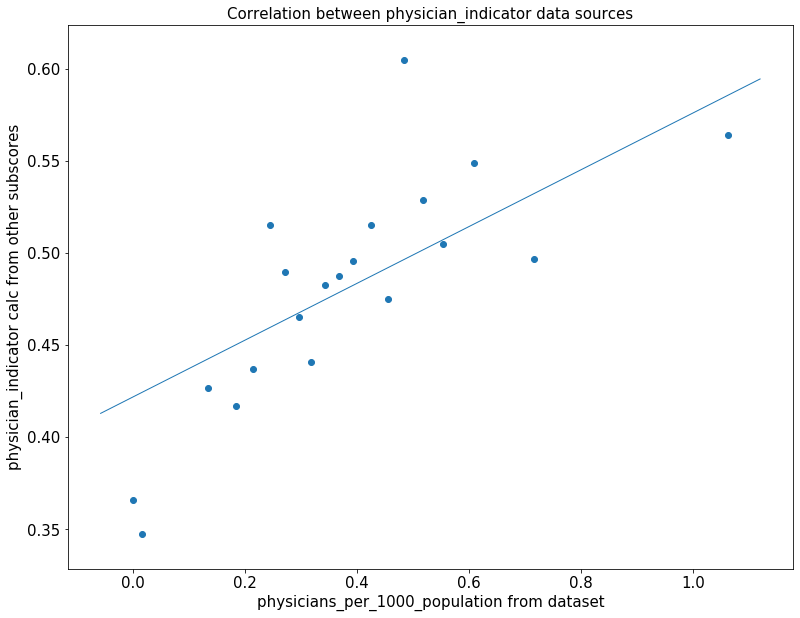

In [127]:
fig, ax = plt.subplots(figsize=(13, 10))

plt.rcParams["figure.figsize"] = (12,8)
#plt.scatter(working_dataset['physician_indicator'], working_dataset['physicians_per_1000_population'], s=14.0, color='blue', alpha=0.8, facecolors='none')
ax.binscatter(working_dataset['physicians_per_1000_population'], working_dataset['physician_indicator'], line_kwargs={"linewidth": 1})
plt.xlabel("physicians_per_1000_population from dataset", fontsize=15)
plt.ylabel("physician_indicator calc from other subscores", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Correlation between physician_indicator data sources',fontsize=15)
# plt.savefig('images/imu_correlation.png',bbox_inches='tight')
plt.show()

In [128]:
fs_merged_df.to_stata("output/fs_merged_df.dta")

## Test 1: Slope of binscatter of error on physician indicator

Text(0, 0.5, '($\\hat{IMU}-IMU$)')

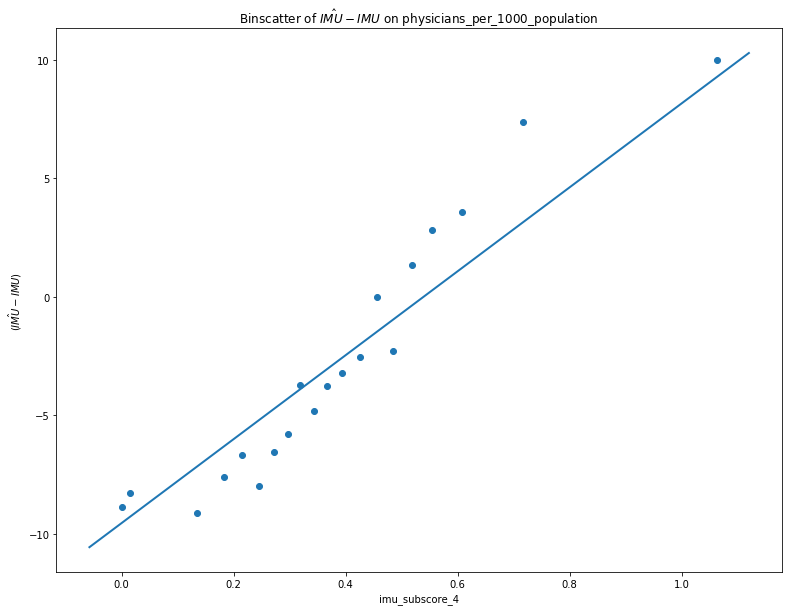

In [129]:
fig, ax = plt.subplots(figsize=(13, 10))

ax.binscatter(diff_checker["physicians_per_1000_population"], diff_checker['imu_diff'], line_kwargs={"linewidth": 2})
ax.set_title('Binscatter of $\hat{IMU}-IMU$ on ' + "physicians_per_1000_population")
ax.set_xlabel(statistic)
ax.set_ylabel('($\hat{IMU}-IMU$)')

In [130]:
import statsmodels.api as sm

# Running the OLS regression of IMU_diff on physicians_per_1000_population
Y = diff_checker['imu_diff']
X = diff_checker[['physicians_per_1000_population']]
X = sm.add_constant(X)

ols_model = sm.OLS(Y, X)
ols_results = ols_model.fit()

ols_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               imu_diff   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                  0.171
Method:                 Least Squares   F-statistic:                     204.8
Date:                Thu, 20 May 2021   Prob (F-statistic):           2.33e-42
Time:                        18:36:40   Log-Likelihood:                -3715.3
No. Observations:                 989   AIC:                             7435.
Df Residuals:                     987   BIC:                             7444.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -9.5462      0.575    -16.589      0.000     -10.675      -8.417
physicians_per_1000_population    17.7178      1.238     14.312      0.000      15.288      20.147
==============================================================================
Omnibus:                       41.086   Durbin-Watson:                   1.575
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               47.068
Skew:                          -0.466   Prob(JB):                     6.02e-11
Kurtosis:                       3.521   Cond. No.                         4.34
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Slope is  17.95

--

## Test 2: Compare the R^2 of the correlation between physician_indicator and back-calculated indicator

In [131]:
import statsmodels.api as sm

# Running the OLS regression of IMU_diff on physicians_per_1000_population
Y = working_dataset['physician_indicator']
X = working_dataset[['physicians_per_1000_population']]
X = sm.add_constant(X)

ols_model = sm.OLS(Y, X)
ols_results = ols_model.fit()

ols_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     physician_indicator   R-squared:                       0.016
Model:                             OLS   Adj. R-squared:                  0.015
Method:                  Least Squares   F-statistic:                     15.57
Date:                 Thu, 20 May 2021   Prob (F-statistic):           8.52e-05
Time:                         18:36:40   Log-Likelihood:                -297.03
No. Observations:                  989   AIC:                             598.1
Df Residuals:                      987   BIC:                             607.9
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                              0.4218      0.018     23.236      0.000       0.386       0.457
physicians_per_1000_population     0.1541      0.039      3.946      0.000       0.077       0.231
==============================================================================
Omnibus:                       80.393   Durbin-Watson:                   1.534
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               99.287
Skew:                           0.775   Prob(JB):                     2.76e-22
Kurtosis:                       3.093   Cond. No.                         4.34
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Outcome variables (diff-in-diff analysis)

In [132]:
# Exclude all non-metro counties designated at a later date
new_dset = new_dset[~new_dset["county_fips"].isin(excluded_counties_fips)]
new_dset

,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,county_fips,live_births,infant_deaths,infant_mortality_rate,...,FP,TN,FN,class,NAME,is_MUA_new,FIPS,imu_fs,imu_ceil,imu_ceil_new
0,Alabama,AL,Autauga,5.7,5.0,0.204415,01001,2356,78,33.106961,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
1,Alabama,AL,Barbour,19.1,13.0,0.576676,01005,2350,79,33.617021,...,1,0,0,FP,Barbour,1.0,01005,43.8,44.0,44.0
2,Alabama,AL,Bibb,7.3,4.0,0.289603,01007,1355,39,28.782288,...,0,0,0,TP,Bibb,1.0,01007,47.7,48.0,48.0
3,Alabama,AL,Blount,4.1,5.0,0.186199,01009,2089,48,22.977501,...,0,0,0,TP,Blount,1.0,01009,56.1,57.0,57.0
4,Alabama,AL,Bullock,16.9,6.0,0.507442,01011,1172,56,47.781570,...,0,0,0,TP,Bullock,1.0,01011,61.7,62.0,62.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2631,Wyoming,WY,Sweetwater,16.9,10.0,0.543744,56037,1603,32,19.962570,...,0,1,0,TN,Sweetwater,0.0,56037,75.2,76.0,76.0
2632,Wyoming,WY,Teton,28.7,7.0,1.451379,56039,466,6,12.875536,...,0,1,0,TN,Teton,0.0,56039,94.8,95.0,95.0
2633,Wyoming,WY,Uinta,28.7,10.0,1.408451,56041,625,7,11.200000,...,0,1,0,TN,Uinta,0.0,56041,95.0,96.0,96.0
2634,Wyoming,WY,Washakie,26.6,7.0,0.924825,56043,742,20,26.954178,...,0,1,0,TN,Washakie,0.0,56043,74.7,75.0,75.0


## Number of physicians from 1960-1990

In [133]:
num_physicians = pd.read_sas('input/Physician_Data/ahrf2020.sas7bdat')

num_physicians = num_physicians[["f00008", "f12424", "f00010", "f04437", "f00011", "f00012", "f0885770", "f0885760", "f0885780", "f0885790"]]
for col in num_physicians.columns:
    if (col[0:5]!="f0885"):
        num_physicians[col] = num_physicians[col].apply(lambda x: x.decode("utf-8"))

num_physicians

,f00008,f12424,f00010,f04437,f00011,f00012,f0885770,f0885760,f0885780,f0885790
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,7.0,4.0,19.0
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,31.0,60.0,106.0
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,11.0,12.0,16.0
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,7.0,3.0,9.0
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,6.0,6.0,13.0
...,...,...,...,...,...,...,...,...,...,...
3225,Puerto Rico,PR,Yabucoa,"Yabucoa, PR",72,151,NaN,NaN,NaN,NaN
3226,Puerto Rico,PR,Yauco,"Yauco, PR",72,153,NaN,NaN,NaN,NaN
3227,US Virgin Islands,VI,St. Croix,"St. Croix, VI",78,010,NaN,NaN,NaN,NaN
3228,US Virgin Islands,VI,St. John,"St. John, VI",78,020,NaN,NaN,NaN,NaN


In [134]:
num_physicians["county_fips"] = num_physicians["f00011"] + num_physicians["f00012"]
num_physicians

,f00008,f12424,f00010,f04437,f00011,f00012,f0885770,f0885760,f0885780,f0885790,county_fips
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,7.0,4.0,19.0,01001
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,31.0,60.0,106.0,01003
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,11.0,12.0,16.0,01005
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,7.0,3.0,9.0,01007
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,6.0,6.0,13.0,01009
...,...,...,...,...,...,...,...,...,...,...,...
3225,Puerto Rico,PR,Yabucoa,"Yabucoa, PR",72,151,NaN,NaN,NaN,NaN,72151
3226,Puerto Rico,PR,Yauco,"Yauco, PR",72,153,NaN,NaN,NaN,NaN,72153
3227,US Virgin Islands,VI,St. Croix,"St. Croix, VI",78,010,NaN,NaN,NaN,NaN,78010
3228,US Virgin Islands,VI,St. John,"St. John, VI",78,020,NaN,NaN,NaN,NaN,78020


In [135]:
num_physicians = num_physicians.dropna(axis=0, subset=["f0885770", "f0885760", "f0885780", "f0885790"])
num_physicians = num_physicians.rename({'f00008': "State", "f12424": "State_Abbr", "f00010":"County", "f04437":"County_State",
                    "f0885770": "1970", "f0885760": "1960",
                    "f0885780": "1980", "f0885790": "1990"}, axis=1)
num_physicians

,State,State_Abbr,County,County_State,f00011,f00012,1970,1960,1980,1990,county_fips
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,7.0,4.0,19.0,01001
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,31.0,60.0,106.0,01003
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,11.0,12.0,16.0,01005
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,7.0,3.0,9.0,01007
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,6.0,6.0,13.0,01009
...,...,...,...,...,...,...,...,...,...,...,...
3143,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,11.0,29.0,31.0,56037
3144,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,2.0,25.0,32.0,56039
3145,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,7.0,12.0,19.0,56041
3146,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,4.0,6.0,7.0,56043


In [136]:
from functools import reduce

# Read from existing `census_1970_population` dataframe
pop_1970 = census_1970_population[["county_fips", "total_population"]]
pop_1970.rename(columns={"total_population": "population_1970"}, inplace=True)

pop_1960 = pd.read_csv("input/Census_1960/Population/nhgis0007_ds91_1960_county.csv",
                           dtype={'STATEA': str, 'COUNTYA': str})
pop_1960.rename(columns={"B5O001": "population_1960"}, inplace=True)
pop_1960["county_fips"] = pop_1960["STATEA"].apply(lambda x: x[:-1])+pop_1960['COUNTYA'].apply(lambda x: x[:-1])
pop_1960 = pop_1960[["county_fips", "population_1960"]]

pop_1980 = pd.read_csv("input/Census_1980/Population/nhgis0007_ds104_1980_county.csv",
                           dtype={'STATEA': str, 'COUNTYA': str})
pop_1980.rename(columns={"C7L001": "population_1980"}, inplace=True)
pop_1980["county_fips"] = pop_1980["STATEA"]+pop_1980["COUNTYA"]
pop_1980 = pop_1980[["county_fips", "population_1980"]]

pop_1990 = pd.read_csv("input/Census_1990/Population/nhgis0007_ds120_1990_county.csv",
                           dtype={'STATEA': str, 'COUNTYA': str})
pop_1990.rename(columns={"ET1001": "population_1990"}, inplace=True)
pop_1990["county_fips"] = pop_1990["STATEA"]+pop_1990["COUNTYA"]
pop_1990 = pop_1990[["county_fips", "population_1990"]]

pop_dfs = [num_physicians, pop_1960, pop_1970, pop_1980, pop_1990]
physicians_pop = reduce(lambda left,right: pd.merge(left, right, on='county_fips'), pop_dfs)
physicians_pop

,State,State_Abbr,County,County_State,f00011,f00012,1970,1960,1980,1990,county_fips,population_1960,population_1970,population_1980,population_1990
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,7.0,4.0,19.0,01001,18739,24460,32259,34222
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,31.0,60.0,106.0,01003,49088,59382,78556,98280
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,11.0,12.0,16.0,01005,24700,22543,24756,25417
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,7.0,3.0,9.0,01007,14357,13812,15723,16576
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,6.0,6.0,13.0,01009,25449,26853,36459,39248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3067,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,11.0,29.0,31.0,56037,17920,18391,41723,38823
3068,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,2.0,25.0,32.0,56039,3062,4823,9355,11172
3069,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,7.0,12.0,19.0,56041,7484,7100,13021,18705
3070,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,4.0,6.0,7.0,56043,8883,7569,9496,8388


In [137]:
# Weighing the num_physicians by the populations
for yr in ["1960", "1970", "1980", "1990"]:
    physicians_pop["weighted_phy_{}".format(yr)] = physicians_pop[yr]/physicians_pop["population_{}".format(yr)]

physicians_pop

,State,State_Abbr,County,County_State,f00011,f00012,1970,1960,1980,1990,county_fips,population_1960,population_1970,population_1980,population_1990,weighted_phy_1960,weighted_phy_1970,weighted_phy_1980,weighted_phy_1990
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,7.0,4.0,19.0,01001,18739,24460,32259,34222,0.000374,0.000204,0.000124,0.000555
1,Alabama,AL,Baldwin,"Baldwin, AL",01,003,19.0,31.0,60.0,106.0,01003,49088,59382,78556,98280,0.000632,0.000320,0.000764,0.001079
2,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,11.0,12.0,16.0,01005,24700,22543,24756,25417,0.000445,0.000577,0.000485,0.000629
3,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,7.0,3.0,9.0,01007,14357,13812,15723,16576,0.000488,0.000290,0.000191,0.000543
4,Alabama,AL,Blount,"Blount, AL",01,009,5.0,6.0,6.0,13.0,01009,25449,26853,36459,39248,0.000236,0.000186,0.000165,0.000331
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3067,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,11.0,29.0,31.0,56037,17920,18391,41723,38823,0.000614,0.000544,0.000695,0.000798
3068,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,2.0,25.0,32.0,56039,3062,4823,9355,11172,0.000653,0.001451,0.002672,0.002864
3069,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,7.0,12.0,19.0,56041,7484,7100,13021,18705,0.000935,0.001408,0.000922,0.001016
3070,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,4.0,6.0,7.0,56043,8883,7569,9496,8388,0.000450,0.000925,0.000632,0.000835


In [138]:
physicians_pop.shape

(3072, 19)

In [139]:
# Only has non-metropolitan areas
new_dset.shape

(2572, 35)

In [140]:
new_dset.columns

Index(['State', 'State_Abbr', 'County', 'imu_subscore_4', 'num_physicians',
       'physicians_per_1000_population', 'county_fips', 'live_births',
       'infant_deaths', 'infant_mortality_rate', 'imu_subscore_2',
       'persons_in_poverty_1970', 'total_population', 'imu_subscore_1',
       'age_65_and_above', 'imu_subscore_3', 'imu_score_hat', 'is_MUA_hat',
       'SMSAA', 'Common State County FIPS Code', 'MUA/P Status Description',
       'IMU Score', 'is_MUA', 'imu_score_hat_ceil', 'TP', 'FP', 'TN', 'FN',
       'class', 'NAME', 'is_MUA_new', 'FIPS', 'imu_fs', 'imu_ceil',
       'imu_ceil_new'],
      dtype='object')

In [141]:
num_physicians_merged = physicians_pop.merge(new_dset, on="county_fips")
num_physicians_merged

,State_x,State_Abbr_x,County_x,County_State,f00011,f00012,1970,1960,1980,1990,...,FP,TN,FN,class,NAME,is_MUA_new,FIPS,imu_fs,imu_ceil,imu_ceil_new
0,Alabama,AL,Autauga,"Autauga, AL",01,001,5.0,7.0,4.0,19.0,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
1,Alabama,AL,Barbour,"Barbour, AL",01,005,13.0,11.0,12.0,16.0,...,1,0,0,FP,Barbour,1.0,01005,43.8,44.0,44.0
2,Alabama,AL,Bibb,"Bibb, AL",01,007,4.0,7.0,3.0,9.0,...,0,0,0,TP,Bibb,1.0,01007,47.7,48.0,48.0
3,Alabama,AL,Blount,"Blount, AL",01,009,5.0,6.0,6.0,13.0,...,0,0,0,TP,Blount,1.0,01009,56.1,57.0,57.0
4,Alabama,AL,Bullock,"Bullock, AL",01,011,6.0,7.0,4.0,7.0,...,0,0,0,TP,Bullock,1.0,01011,61.7,62.0,62.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2567,Wyoming,WY,Sweetwater,"Sweetwater, WY",56,037,10.0,11.0,29.0,31.0,...,0,1,0,TN,Sweetwater,0.0,56037,75.2,76.0,76.0
2568,Wyoming,WY,Teton,"Teton, WY",56,039,7.0,2.0,25.0,32.0,...,0,1,0,TN,Teton,0.0,56039,94.8,95.0,95.0
2569,Wyoming,WY,Uinta,"Uinta, WY",56,041,10.0,7.0,12.0,19.0,...,0,1,0,TN,Uinta,0.0,56041,95.0,96.0,96.0
2570,Wyoming,WY,Washakie,"Washakie, WY",56,043,7.0,4.0,6.0,7.0,...,0,1,0,TN,Washakie,0.0,56043,74.7,75.0,75.0


In [142]:
num_physicians_merged.groupby("is_MUA").mean()

,1970,1960,1980,1990,population_1960,population_1970,population_1980,population_1990,weighted_phy_1960,weighted_phy_1970,...,IMU Score,imu_score_hat_ceil,TP,FP,TN,FN,is_MUA_new,imu_fs,imu_ceil,imu_ceil_new
is_MUA,,,,,,,,,,,,,,,,,,,,,
0,31.854075,26.889450,48.688566,63.186355,30635.589387,33725.380922,38881.444725,42094.135186,0.000696,0.000685,...,NaN,69.629817,0.000000,0.255843,0.744157,0.000000,0.314593,69.184144,69.629817,69.629817
1,7.644085,8.382204,11.117290,14.438827,16549.188069,16510.537917,19257.770475,20179.394338,0.000451,0.000381,...,51.561173,49.218402,0.845298,0.000000,0.000000,0.154702,0.898888,51.561173,52.003033,52.003033


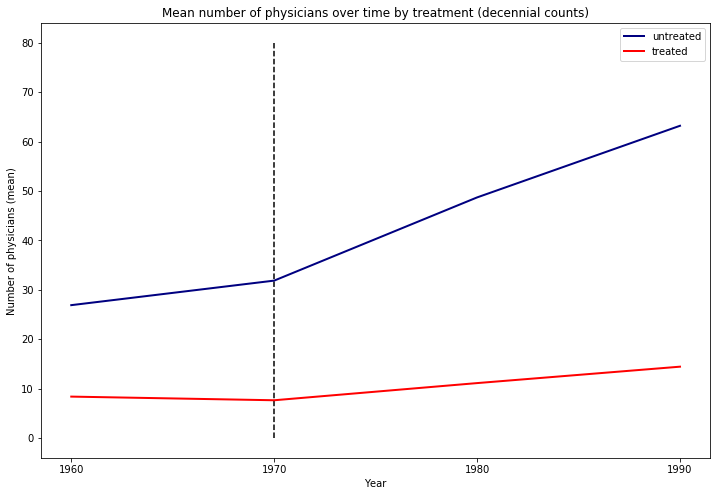

In [143]:
# Raw number of physicians over time
x_axis = ["1960", "1970", "1980", "1990"]

untreated = list(num_physicians_merged.groupby("is_MUA").mean().loc[0][["1960", "1970", "1980", "1990"]])
treated = list(num_physicians_merged.groupby("is_MUA").mean().loc[1][["1960", "1970", "1980", "1990"]])

plt.plot(x_axis, untreated, label="untreated", color="navy", lw=2.)
plt.plot(x_axis, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Mean number of physicians over time by treatment (decennial counts)")
plt.xlabel("Year")
plt.ylabel("Number of physicians (mean)")
plt.vlines("1970", 0, 80, linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

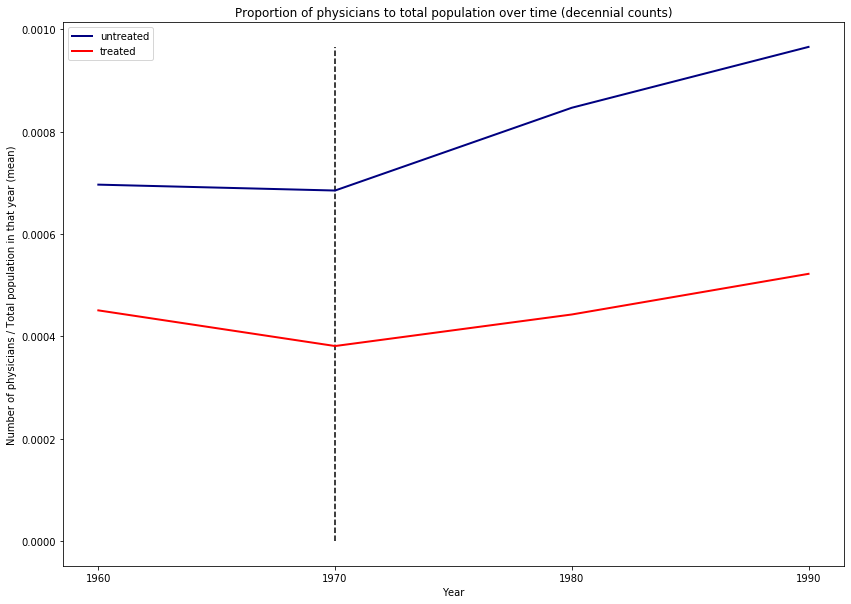

In [144]:
# Proportion of physicians to total population over time
x_axis = ["1960", "1970", "1980", "1990"]

untreated = list(num_physicians_merged.groupby("is_MUA").mean().loc[0][["weighted_phy_1960", "weighted_phy_1970", "weighted_phy_1980", "weighted_phy_1990"]])
treated = list(num_physicians_merged.groupby("is_MUA").mean().loc[1][["weighted_phy_1960", "weighted_phy_1970", "weighted_phy_1980", "weighted_phy_1990"]])

plt.plot(x_axis, untreated, label="untreated", color="navy", lw=2.)
plt.plot(x_axis, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Proportion of physicians to total population over time (decennial counts)")
plt.xlabel("Year")
plt.ylabel("Number of physicians / Total population in that year (mean)")
plt.vlines("1970", 0, max(untreated), linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

In [145]:
# Weighted average function, source: https://pbpython.com/weighted-average.html

def wavg(group, avg_name, weight_name):
    """ http://stackoverflow.com/questions/10951341/pandas-dataframe-aggregate-function-using-multiple-columns
    In rare instance, we may not have weights, so just return the mean. Customize this if your business case
    should return otherwise.
    """
    d = group[avg_name]
    w = group[weight_name]
    try:
        return (d * w).sum() / w.sum()
    except ZeroDivisionError:
        return d.mean()

In [146]:
num_physicians_merged.columns

Index(['State_x', 'State_Abbr_x', 'County_x', 'County_State', 'f00011',
       'f00012', '1970', '1960', '1980', '1990', 'county_fips',
       'population_1960', 'population_1970', 'population_1980',
       'population_1990', 'weighted_phy_1960', 'weighted_phy_1970',
       'weighted_phy_1980', 'weighted_phy_1990', 'State_y', 'State_Abbr_y',
       'County_y', 'imu_subscore_4', 'num_physicians',
       'physicians_per_1000_population', 'live_births', 'infant_deaths',
       'infant_mortality_rate', 'imu_subscore_2', 'persons_in_poverty_1970',
       'total_population', 'imu_subscore_1', 'age_65_and_above',
       'imu_subscore_3', 'imu_score_hat', 'is_MUA_hat', 'SMSAA',
       'Common State County FIPS Code', 'MUA/P Status Description',
       'IMU Score', 'is_MUA', 'imu_score_hat_ceil', 'TP', 'FP', 'TN', 'FN',
       'class', 'NAME', 'is_MUA_new', 'FIPS', 'imu_fs', 'imu_ceil',
       'imu_ceil_new'],
      dtype='object')

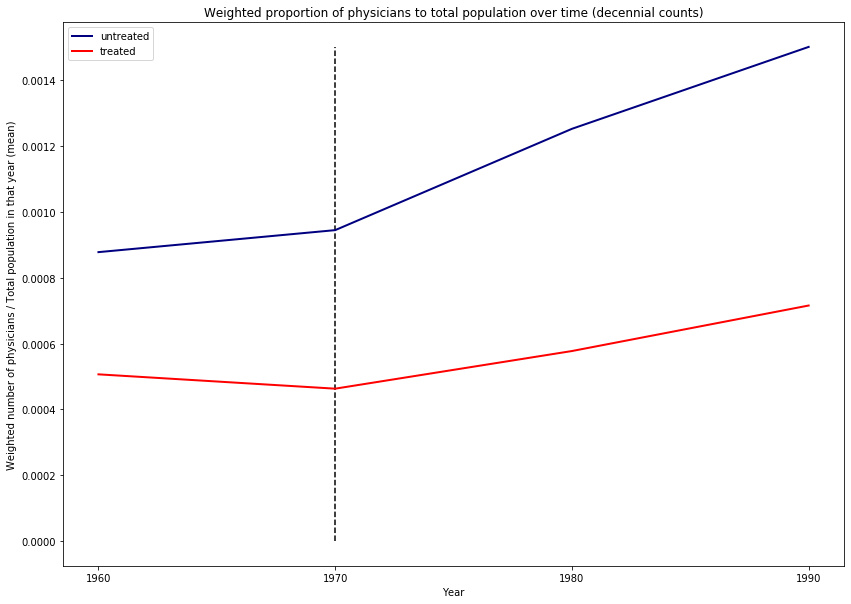

In [147]:
# Proportion of physicians to total population WEIGHTED by total_population over time (weighted_mean)
x_axis = ["1960", "1970", "1980", "1990"]

untreated = [num_physicians_merged.groupby("is_MUA").apply \
             (wavg, "weighted_phy_{}".format(yr), "population_{}".format(yr))[0] for yr in x_axis]
treated = [num_physicians_merged.groupby("is_MUA").apply \
             (wavg, "weighted_phy_{}".format(yr), "population_{}".format(yr))[1] for yr in x_axis]

plt.plot(x_axis, untreated, label="untreated", color="navy", lw=2.)
plt.plot(x_axis, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Weighted proportion of physicians to total population over time (decennial counts)")
plt.xlabel("Year")
plt.ylabel("Weighted number of physicians / Total population in that year (mean)")
plt.vlines("1970", 0, max(untreated), linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

Todo:
- [DONE] [Rishab] Change this outcome to per capita -- divide by `total_population` in the county
    - Do both weighted and unweighted, based on total_population (similar to `infant_mortality_rate`)

- [Kaveh] Physician masterfile (more granular data for physician)

## Infant Mortality Rate

In [148]:
infant_dsets = []

for year in range(1960, 1972+1):
    infant_dsets.append(get_merged_infant_df(year))
    
infant_data_merged = pd.concat(infant_dsets)
infant_data_merged

,GISJOIN_,YEAR_,STATE_,STATEA_,COUNTY_,COUNTYA_,AREANAME_,live_births,county_fips,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,AREANAME,infant_deaths
0,G0100010,1960,Alabama,01,Autauga,001,AUTAUGA,510,01001,G0100010,1960,Alabama,01,Autauga,001,AUTAUGA,12.0
1,G0100030,1960,Alabama,01,Baldwin,003,BALDWIN,1312,01003,G0100030,1960,Alabama,01,Baldwin,003,BALDWIN,36.0
2,G0100050,1960,Alabama,01,Barbour,005,BARBOUR,608,01005,G0100050,1960,Alabama,01,Barbour,005,BARBOUR,28.0
3,G0100070,1960,Alabama,01,Bibb,007,BIBB,332,01007,G0100070,1960,Alabama,01,Bibb,007,BIBB,15.0
4,G0100090,1960,Alabama,01,Blount,009,BLOUNT,504,01009,G0100090,1960,Alabama,01,Blount,009,BLOUNT,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,G5600390,1972,Wyoming,56,Teton,039,TETON,82,56039,G5600390,1972,Wyoming,56,Teton,039,TETON,6.0
3138,G5600410,1972,Wyoming,56,Uinta,041,UINTA,136,56041,G5600410,1972,Wyoming,56,Uinta,041,UINTA,4.0
3139,G5600430,1972,Wyoming,56,Washakie,043,WASHAKIE,120,56043,G5600430,1972,Wyoming,56,Washakie,043,WASHAKIE,4.0
3140,G5600450,1972,Wyoming,56,Weston,045,WESTON,98,56045,G5600450,1972,Wyoming,56,Weston,045,WESTON,4.0


In [149]:
infant_data_merged.shape

(40803, 17)

In [150]:
infant_data_merged = infant_data_merged.dropna(axis=0, subset=["infant_deaths", "live_births"])
infant_data_merged["infant_deaths"] = infant_data_merged["infant_deaths"].astype(int)
infant_data_merged["live_births"] = infant_data_merged["live_births"].astype(int)
infant_data_merged = infant_data_merged[infant_data_merged["live_births"]!=0]
infant_data_merged

,GISJOIN_,YEAR_,STATE_,STATEA_,COUNTY_,COUNTYA_,AREANAME_,live_births,county_fips,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,AREANAME,infant_deaths
0,G0100010,1960,Alabama,01,Autauga,001,AUTAUGA,510,01001,G0100010,1960,Alabama,01,Autauga,001,AUTAUGA,12
1,G0100030,1960,Alabama,01,Baldwin,003,BALDWIN,1312,01003,G0100030,1960,Alabama,01,Baldwin,003,BALDWIN,36
2,G0100050,1960,Alabama,01,Barbour,005,BARBOUR,608,01005,G0100050,1960,Alabama,01,Barbour,005,BARBOUR,28
3,G0100070,1960,Alabama,01,Bibb,007,BIBB,332,01007,G0100070,1960,Alabama,01,Bibb,007,BIBB,15
4,G0100090,1960,Alabama,01,Blount,009,BLOUNT,504,01009,G0100090,1960,Alabama,01,Blount,009,BLOUNT,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3136,G5600370,1972,Wyoming,56,Sweetwater,037,SWEETWATER,414,56037,G5600370,1972,Wyoming,56,Sweetwater,037,SWEETWATER,10
3137,G5600390,1972,Wyoming,56,Teton,039,TETON,82,56039,G5600390,1972,Wyoming,56,Teton,039,TETON,6
3138,G5600410,1972,Wyoming,56,Uinta,041,UINTA,136,56041,G5600410,1972,Wyoming,56,Uinta,041,UINTA,4
3139,G5600430,1972,Wyoming,56,Washakie,043,WASHAKIE,120,56043,G5600430,1972,Wyoming,56,Washakie,043,WASHAKIE,4


In [151]:
infant_data_merged.shape

(40738, 17)

In [152]:
infant_data_merged["infant_mortality_rate_year"] = infant_data_merged["infant_deaths"]/infant_data_merged["live_births"] * 1000
infant_data_merged

,GISJOIN_,YEAR_,STATE_,STATEA_,COUNTY_,COUNTYA_,AREANAME_,live_births,county_fips,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,AREANAME,infant_deaths,infant_mortality_rate_year
0,G0100010,1960,Alabama,01,Autauga,001,AUTAUGA,510,01001,G0100010,1960,Alabama,01,Autauga,001,AUTAUGA,12,23.529412
1,G0100030,1960,Alabama,01,Baldwin,003,BALDWIN,1312,01003,G0100030,1960,Alabama,01,Baldwin,003,BALDWIN,36,27.439024
2,G0100050,1960,Alabama,01,Barbour,005,BARBOUR,608,01005,G0100050,1960,Alabama,01,Barbour,005,BARBOUR,28,46.052632
3,G0100070,1960,Alabama,01,Bibb,007,BIBB,332,01007,G0100070,1960,Alabama,01,Bibb,007,BIBB,15,45.180723
4,G0100090,1960,Alabama,01,Blount,009,BLOUNT,504,01009,G0100090,1960,Alabama,01,Blount,009,BLOUNT,11,21.825397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3136,G5600370,1972,Wyoming,56,Sweetwater,037,SWEETWATER,414,56037,G5600370,1972,Wyoming,56,Sweetwater,037,SWEETWATER,10,24.154589
3137,G5600390,1972,Wyoming,56,Teton,039,TETON,82,56039,G5600390,1972,Wyoming,56,Teton,039,TETON,6,73.170732
3138,G5600410,1972,Wyoming,56,Uinta,041,UINTA,136,56041,G5600410,1972,Wyoming,56,Uinta,041,UINTA,4,29.411765
3139,G5600430,1972,Wyoming,56,Washakie,043,WASHAKIE,120,56043,G5600430,1972,Wyoming,56,Washakie,043,WASHAKIE,4,33.333333


In [153]:
infant_data_merged_main = infant_data_merged.merge(new_dset, left_on="county_fips", right_on="county_fips")
infant_data_merged_main

,GISJOIN_,YEAR_,STATE_,STATEA_,COUNTY_,COUNTYA_,AREANAME_,live_births_x,county_fips,GISJOIN,...,FP,TN,FN,class,NAME,is_MUA_new,FIPS,imu_fs,imu_ceil,imu_ceil_new
0,G0100010,1960,Alabama,01,Autauga,001,AUTAUGA,510,01001,G0100010,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
1,G0100010,1961,Alabama,01,Autauga,001,AUTAUGA,578,01001,G0100010,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
2,G0100010,1962,Alabama,01,Autauga,001,AUTAUGA,490,01001,G0100010,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
3,G0100010,1963,Alabama,01,Autauga,001,AUTAUGA,502,01001,G0100010,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
4,G0100010,1964,Alabama,01,Autauga,001,AUTAUGA,488,01001,G0100010,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33431,G5600450,1968,Wyoming,56,Weston,045,WESTON,110,56045,G5600450,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
33432,G5600450,1969,Wyoming,56,Weston,045,WESTON,120,56045,G5600450,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
33433,G5600450,1970,Wyoming,56,Weston,045,WESTON,104,56045,G5600450,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
33434,G5600450,1971,Wyoming,56,Weston,045,WESTON,86,56045,G5600450,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0


In [154]:
years = np.arange(1960, 1972+1)
untreated = []
treated = []

for year in years:
    untreated_val = infant_data_merged_main[infant_data_merged_main["YEAR"]==year].groupby("is_MUA_hat").mean().loc[0]["infant_mortality_rate_year"]
    treated_val = infant_data_merged_main[infant_data_merged_main["YEAR"]==year].groupby("is_MUA_hat").mean().loc[1]["infant_mortality_rate_year"]
    untreated.append(untreated_val)
    treated.append(treated_val)

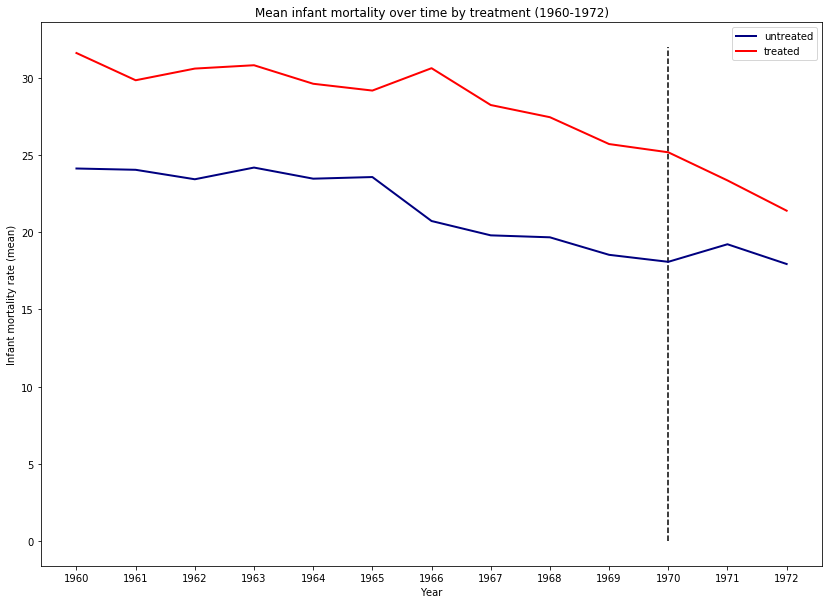

In [155]:
plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
plt.plot(years, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Mean infant mortality over time by treatment (1960-1972)")
plt.xlabel("Year")
plt.ylabel("Infant mortality rate (mean)")
plt.xticks(np.arange(1960, 1973, 1))
plt.vlines(1970, 0, 32, linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

In [156]:
# `live_births_y` is the incorrect # for the number of births in that year (takes 5-year sum)
# Same goes for `infant_deaths_y`
# `infant_mortality_rate_year` is the correct infant mortality rate, `infant_mortality_rate` takes 5 year average
infant_data_merged_main[["YEAR_", "county_fips", "live_births_x", "live_births_y",
                         "infant_deaths_x", "infant_deaths_y", "infant_mortality_rate", "infant_mortality_rate_year"]]

,YEAR_,county_fips,live_births_x,live_births_y,infant_deaths_x,infant_deaths_y,infant_mortality_rate,infant_mortality_rate_year
0,1960,01001,510,2356,12,78,33.106961,23.529412
1,1961,01001,578,2356,14,78,33.106961,24.221453
2,1962,01001,490,2356,20,78,33.106961,40.816327
3,1963,01001,502,2356,21,78,33.106961,41.832669
4,1964,01001,488,2356,16,78,33.106961,32.786885
...,...,...,...,...,...,...,...,...
33431,1968,56045,110,547,3,20,36.563071,27.272727
33432,1969,56045,120,547,8,20,36.563071,66.666667
33433,1970,56045,104,547,1,20,36.563071,9.615385
33434,1971,56045,86,547,0,20,36.563071,0.000000


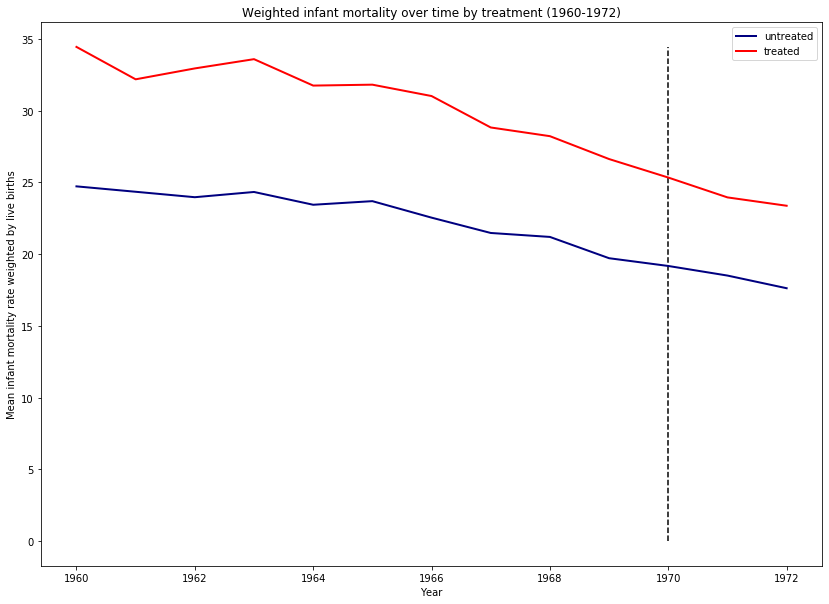

In [157]:
# Infant mortality rate WEIGHTED by live_births over time (weighted_mean)
years = np.arange(1960, 1972+1)

untreated = [infant_data_merged_main[infant_data_merged_main["YEAR_"] == yr].groupby("is_MUA"). \
                        apply(wavg, "infant_mortality_rate_year", "live_births_x")[0] for yr in years]

treated = [infant_data_merged_main[infant_data_merged_main["YEAR_"] == yr].groupby("is_MUA"). \
                        apply(wavg, "infant_mortality_rate_year", "live_births_x")[1] for yr in years]

plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
plt.plot(years, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Weighted infant mortality over time by treatment (1960-1972)")
plt.xlabel("Year")
plt.ylabel("Mean infant mortality rate weighted by live births")
plt.vlines(1970, 0, max(treated), linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

Todo:
- [DONE] Weigh by # of live_births
- Expanding the dataset beyond 1972

## Mortality

In [158]:
mortality_tables = [pd.read_csv("input/Mortality/mort7988", delimiter="\n", header=None), pd.read_csv("input/Mortality/mort6878", delimiter="\n", header=None)]
mortality = pd.concat(mortality_tables)
mortality

,0
0,0100119791045789780 1
1,0100119791047980770 1
2,0100119791088121800 1
3,0100119791093439780 1
4,0100119791098120800 2
...,...
8774859,5604519782164124370 1
8774860,5604519782164339440 1
8774861,5604519782164442480 1
8774862,560451978216471 510 2


In [159]:
mortality["county_fips"] = mortality[0].str[0:5]
mortality["year"] = mortality[0].str[5:9]
mortality["sex"] = mortality[0].str[9:10]
mortality["age_category"] = mortality[0].str[10:12]
mortality["icd"] = mortality[0].str[12:16]
mortality["cause"] = mortality[0].str[16:19]
#mortality["num_deaths"] = mortality[0].str.rsplit()[-1]
mortality

,0,county_fips,year,sex,age_category,icd,cause
0,0100119791045789780 1,01001,1979,1,04,5789,780
1,0100119791047980770 1,01001,1979,1,04,7980,770
2,0100119791088121800 1,01001,1979,1,08,8121,800
3,0100119791093439780 1,01001,1979,1,09,3439,780
4,0100119791098120800 2,01001,1979,1,09,8120,800
...,...,...,...,...,...,...,...
8774859,5604519782164124370 1,56045,1978,2,16,4124,370
8774860,5604519782164339440 1,56045,1978,2,16,4339,440
8774861,5604519782164442480 1,56045,1978,2,16,4442,480
8774862,560451978216471 510 2,56045,1978,2,16,471,510


In [160]:
#mortality.drop(0, axis=1, inplace=True)
mortality["num_deaths"] = mortality[0].str[-4:].str.strip()
mortality

,0,county_fips,year,sex,age_category,icd,cause,num_deaths
0,0100119791045789780 1,01001,1979,1,04,5789,780,1
1,0100119791047980770 1,01001,1979,1,04,7980,770,1
2,0100119791088121800 1,01001,1979,1,08,8121,800,1
3,0100119791093439780 1,01001,1979,1,09,3439,780,1
4,0100119791098120800 2,01001,1979,1,09,8120,800,2
...,...,...,...,...,...,...,...,...
8774859,5604519782164124370 1,56045,1978,2,16,4124,370,1
8774860,5604519782164339440 1,56045,1978,2,16,4339,440,1
8774861,5604519782164442480 1,56045,1978,2,16,4442,480,1
8774862,560451978216471 510 2,56045,1978,2,16,471,510,2


In [161]:
mortality['icd_0'] = mortality['icd'].str[0]
mortality

,0,county_fips,year,sex,age_category,icd,cause,num_deaths,icd_0
0,0100119791045789780 1,01001,1979,1,04,5789,780,1,5
1,0100119791047980770 1,01001,1979,1,04,7980,770,1,7
2,0100119791088121800 1,01001,1979,1,08,8121,800,1,8
3,0100119791093439780 1,01001,1979,1,09,3439,780,1,3
4,0100119791098120800 2,01001,1979,1,09,8120,800,2,8
...,...,...,...,...,...,...,...,...,...
8774859,5604519782164124370 1,56045,1978,2,16,4124,370,1,4
8774860,5604519782164339440 1,56045,1978,2,16,4339,440,1,4
8774861,5604519782164442480 1,56045,1978,2,16,4442,480,1,4
8774862,560451978216471 510 2,56045,1978,2,16,471,510,2,4


In [162]:
mortality.groupby("icd_0").count()

,0,county_fips,year,sex,age_category,icd,cause,num_deaths
icd_0,,,,,,,,
0,292250,292250,292250,292250,292250,292250,292250,292250
1,3341605,3341605,3341605,3341605,3341605,3341605,3341605,3341605
2,1410120,1410120,1410120,1410120,1410120,1410120,1410120,1410120
3,664963,664963,664963,664963,664963,664963,664963,664963
4,6484597,6484597,6484597,6484597,6484597,6484597,6484597,6484597
5,1798155,1798155,1798155,1798155,1798155,1798155,1798155,1798155
6,65252,65252,65252,65252,65252,65252,65252,65252
7,1076199,1076199,1076199,1076199,1076199,1076199,1076199,1076199
8,1299885,1299885,1299885,1299885,1299885,1299885,1299885,1299885


In [163]:
#mortality.drop(["sex", 0, "age_category", "icd", "cause"], axis=1, inplace=True)
mortality["num_deaths"] = mortality["num_deaths"].astype(int)
mortality_grouped = mortality.groupby(["county_fips", "year"]).sum().reset_index()
mortality_grouped

,county_fips,year,num_deaths
0,01001,1968,226
1,01001,1969,191
2,01001,1970,204
3,01001,1971,229
4,01001,1972,206
...,...,...,...
64981,56045,1984,70
64982,56045,1985,53
64983,56045,1986,61
64984,56045,1987,50


In [164]:
mortality_merged = mortality_grouped.merge(new_dset, on="county_fips")
mortality_merged

,county_fips,year,num_deaths,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,live_births,...,FP,TN,FN,class,NAME,is_MUA_new,FIPS,imu_fs,imu_ceil,imu_ceil_new
0,01001,1968,226,Alabama,AL,Autauga,5.7,5.0,0.204415,2356,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
1,01001,1969,191,Alabama,AL,Autauga,5.7,5.0,0.204415,2356,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
2,01001,1970,204,Alabama,AL,Autauga,5.7,5.0,0.204415,2356,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
3,01001,1971,229,Alabama,AL,Autauga,5.7,5.0,0.204415,2356,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
4,01001,1972,206,Alabama,AL,Autauga,5.7,5.0,0.204415,2356,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53996,56045,1984,70,Wyoming,WY,Weston,14.8,3.0,0.475662,547,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
53997,56045,1985,53,Wyoming,WY,Weston,14.8,3.0,0.475662,547,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
53998,56045,1986,61,Wyoming,WY,Weston,14.8,3.0,0.475662,547,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
53999,56045,1987,50,Wyoming,WY,Weston,14.8,3.0,0.475662,547,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0


### Reading in `population` dataset from https://www.nber.org/research/data/vital-statistics-compressed-mortality-file-1968-1988

In [165]:
population_dfs = [pd.read_csv("input/Mortality/pop7988", delimiter="\n", header=None), pd.read_csv("input/Mortality/pop6878", delimiter="\n", header=None)]
population = pd.concat(population_dfs)
population

,0
0,0000019791 1460512 5347000 7176000 7841000 912...
1,0000019792 1382355 5078000 6824000 7482000 878...
2,0000019793 282869 951000 1273000 1362000 149...
3,0000019794 274815 936000 1256000 1347000 150...
4,0000019795 47886 165000 212000 211000 22...
...,...
206707,5604519782 71 242 294 305 ...
206708,5604519783 0 0 0 0 ...
206709,5604519784 0 0 0 0 ...
206710,5604519785 2 2 5 9 ...


In [166]:
population["record_type"] = population[0].str[139]
population["county_fips"] = population[0].str[0:5]
population["year"] = population[0].str[5:9]
population["race_sex"] = population[0].str[9:10]
population["live_births"] = population[0].str[10:18]

population["total_population"] = population["live_births"].astype(int)
for i in range(0,12):
    population["category_{}".format(i)] = population[0].str[18+i*8:18+i*8+8].astype(int)
    population["total_population"] = population["total_population"] + population["category_{}".format(i)]

population

,0,record_type,county_fips,year,race_sex,live_births,total_population,category_0,category_1,category_2,category_3,category_4,category_5,category_6,category_7,category_8,category_9,category_10,category_11
0,0000019791 1460512 5347000 7176000 7841000 912...,1,00000,1979,1,1460512,94493512,5347000,7176000,7841000,9127000,9044000,15573000,10835000,9853000,9061000,5997000,2562000,617000
1,0000019792 1382355 5078000 6824000 7482000 878...,1,00000,1979,2,1382355,99259355,5078000,6824000,7482000,8781000,8909000,15535000,11042000,10389000,10216000,7841000,4373000,1407000
2,0000019793 282869 951000 1273000 1362000 149...,1,00000,1979,3,282869,12471869,951000,1273000,1362000,1495000,1287000,1886000,1212000,1024000,845000,564000,238000,52000
3,0000019794 274815 936000 1256000 1347000 150...,1,00000,1979,4,274815,13883815,936000,1256000,1347000,1502000,1408000,2177000,1458000,1251000,1044000,766000,360000,104000
4,0000019795 47886 165000 212000 211000 22...,1,00000,1979,5,47886,2204886,165000,212000,211000,228000,224000,403000,266000,190000,135000,87000,29000,7000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206707,5604519782 71 242 294 305 ...,3,56045,1978,2,71,3456,242,294,305,315,303,514,399,351,303,211,100,48
206708,5604519783 0 0 0 0 ...,3,56045,1978,3,0,5,0,0,0,1,2,0,1,1,0,0,0,0
206709,5604519784 0 0 0 0 ...,3,56045,1978,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
206710,5604519785 2 2 5 9 ...,3,56045,1978,5,2,38,2,5,9,6,5,5,2,1,1,0,0,0


In [167]:
county_population = population[population["record_type"]=="3"].drop(0, axis=1)
county_population = county_population.groupby(["year", "county_fips"]).sum().reset_index()
county_population

,year,county_fips,total_population,category_0,category_1,category_2,category_3,category_4,category_5,category_6,category_7,category_8,category_9,category_10,category_11
0,1968,01001,23214,1952,3135,2919,2053,1267,3051,2751,2051,1862,1071,510,104
1,1968,01003,58489,4265,6577,6709,5727,3399,6516,6534,6203,5734,3715,1735,373
2,1968,01005,21910,1642,2378,2452,2133,1455,1944,2250,2545,2283,1543,654,179
3,1968,01007,13698,1084,1476,1504,1362,832,1471,1302,1380,1509,994,439,95
4,1968,01009,25588,1783,2468,2547,2246,1644,3066,2883,2927,2976,1711,802,139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65016,1988,56037,39948,3002,4347,3804,3185,2273,7385,6442,3665,2609,1566,797,252
65017,1988,56039,10655,697,788,643,543,670,2471,2113,1097,772,415,179,46
65018,1988,56041,19551,1670,2492,2122,1614,959,3631,3073,1479,1119,618,299,102
65019,1988,56043,8840,562,830,752,708,383,1307,1258,914,881,660,368,94


### Comparing our `county_population` with `census_1970_population`

In [168]:
census_1970_population

,GISJOIN,YEAR,STATE,STATEA,COUNTY,COUNTYA,CTY_SUBA,PLACEA,TRACTA,ENUMDISTA,...,SMSAA,URB_AREAA,BLCK_GRPA,BLOCKA,ANXTERRA,URBRURALA,CDA,AREANAME,total_population,county_fips
0,G0100010,1970,Alabama,01,Autauga,001,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Autauga,24460,01001
1,G0100030,1970,Alabama,01,Baldwin,003,NaN,NaN,NaN,NaN,...,5160.0,NaN,NaN,NaN,NaN,NaN,NaN,Baldwin,59382,01003
2,G0100050,1970,Alabama,01,Barbour,005,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Barbour,22543,01005
3,G0100070,1970,Alabama,01,Bibb,007,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bibb,13812,01007
4,G0100090,1970,Alabama,01,Blount,009,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Blount,26853,01009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,G5600370,1970,Wyoming,56,Sweetwater,037,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sweetwater,18391,56037
3136,G5600390,1970,Wyoming,56,Teton,039,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Teton,4823,56039
3137,G5600410,1970,Wyoming,56,Uinta,041,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Uinta,7100,56041
3138,G5600430,1970,Wyoming,56,Washakie,043,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Washakie,7569,56043


In [169]:
county_population[county_population["year"]=="1970"]

,year,county_fips,total_population,category_0,category_1,category_2,category_3,category_4,category_5,category_6,category_7,category_8,category_9,category_10,category_11
6160,1970,01001,24509,1908,3080,3096,2280,1516,3185,2893,2218,1915,1231,540,121
6161,1970,01003,59510,4067,6306,6775,5907,3775,6661,6423,6321,5833,4033,1834,431
6162,1970,01005,22622,1589,2391,2539,2245,1605,2164,2215,2570,2347,1610,673,198
6163,1970,01007,13837,1021,1446,1533,1396,921,1499,1305,1400,1451,1031,441,113
6164,1970,01009,26762,1784,2555,2675,2433,1832,3278,2997,3018,2986,1860,826,164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9235,1970,56037,18444,1288,1942,1949,1708,1100,2158,2147,2204,1811,1150,518,93
9236,1970,56039,4844,341,495,547,440,321,702,673,569,368,201,71,10
9237,1970,56041,7098,497,671,838,712,366,726,829,866,741,446,245,39
9238,1970,56043,7589,510,813,891,799,413,863,877,915,736,391,193,40


## Merge with `mortality_grouped`

In [170]:
mortality_pop_grouped = pd.merge(mortality_grouped, county_population[["year", "county_fips", "total_population"]],
                                on=["year", "county_fips"])
mortality_pop_grouped["proportion_deaths"] = mortality_pop_grouped["num_deaths"]/mortality_pop_grouped["total_population"]
mortality_pop_grouped

,county_fips,year,num_deaths,total_population,proportion_deaths
0,01001,1968,226,23214,0.009736
1,01001,1969,191,23855,0.008007
2,01001,1970,204,24509,0.008323
3,01001,1971,229,25520,0.008973
4,01001,1972,206,27210,0.007571
...,...,...,...,...,...
64981,56045,1984,70,7853,0.008914
64982,56045,1985,53,7769,0.006822
64983,56045,1986,61,7573,0.008055
64984,56045,1987,50,7242,0.006904


Todo
- Merge with `total_population` at the (county,year) level -- NBER dataset
https://www.nber.org/research/data/vital-statistics-compressed-mortality-file-1968-1988

- County, year specific mortality rates

- Groupby `is_MUA` and calculate 1) unweighted average and then 2) weighted average based on population


000 - 136: Infectious diseases

140 - 239: Neoplasm

240 - 279: Endocrin or Nutrition

280 - 289: Diseases of the blood

290 - 315: Mental disorders

320 - 389: Nervous system

390 - 458: Circulatory system

460 - 519: Respiratory system

--
520 - 579: Gastrointestinal

580 - 629: Geneto-urinary

630 - 679: Pregnancy

680 - 709: Skin

710 - 739: Musculoskeletal

740 - 759: Conginetal

760 - 779: Perinatal

780 - 799: Symptoms and signs

800 - 999: Injury

Two ways of doing this
1. Create new dataset with codes based on a particular cause of death
2. Groupby (county_fips, year, icd_code)

- Do injury, infectious, neoplasm, circulatory, repeat procedure above


## Plot for `proportion_deaths` across all ICD-8 codes

In [171]:
# Merging with our non-metropolitan counties dataset `new_dset`
mortality_population_merged = mortality_pop_grouped.merge(new_dset, on="county_fips")
mortality_population_merged

,county_fips,year,num_deaths,total_population_x,proportion_deaths,State,State_Abbr,County,imu_subscore_4,num_physicians,...,FP,TN,FN,class,NAME,is_MUA_new,FIPS,imu_fs,imu_ceil,imu_ceil_new
0,01001,1968,226,23214,0.009736,Alabama,AL,Autauga,5.7,5.0,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
1,01001,1969,191,23855,0.008007,Alabama,AL,Autauga,5.7,5.0,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
2,01001,1970,204,24509,0.008323,Alabama,AL,Autauga,5.7,5.0,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
3,01001,1971,229,25520,0.008973,Alabama,AL,Autauga,5.7,5.0,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
4,01001,1972,206,27210,0.007571,Alabama,AL,Autauga,5.7,5.0,...,1,0,0,FP,Autauga,1.0,01001,42.3,43.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53996,56045,1984,70,7853,0.008914,Wyoming,WY,Weston,14.8,3.0,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
53997,56045,1985,53,7769,0.006822,Wyoming,WY,Weston,14.8,3.0,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
53998,56045,1986,61,7573,0.008055,Wyoming,WY,Weston,14.8,3.0,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0
53999,56045,1987,50,7242,0.006904,Wyoming,WY,Weston,14.8,3.0,...,1,0,0,FP,Weston,1.0,56045,58.9,59.0,59.0


In [172]:
#years = np.arange(1968, 1978+1)
years = np.arange(1968, 1988+1)
untreated = []
treated = []

for year in years:
    untreated_val = mortality_population_merged[mortality_merged["year"]==str(year)].groupby("is_MUA_hat").mean().loc[0]["proportion_deaths"]
    treated_val = mortality_population_merged[mortality_merged["year"]==str(year)].groupby("is_MUA_hat").mean().loc[1]["proportion_deaths"]
    untreated.append(untreated_val)
    treated.append(treated_val)

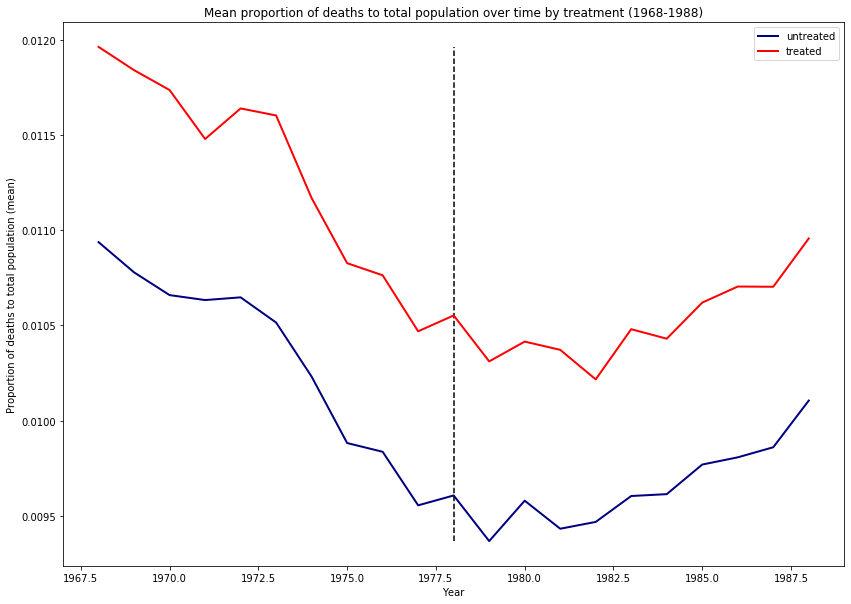

In [173]:
plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
plt.plot(years, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Mean proportion of deaths to total population over time by treatment (1968-1988)")
plt.xlabel("Year")
plt.ylabel("Proportion of deaths to total population (mean)")
#plt.xticks(np.arange(1960, 1973, 1))
plt.vlines(1978, min(untreated), max(treated), linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

## Weighted average

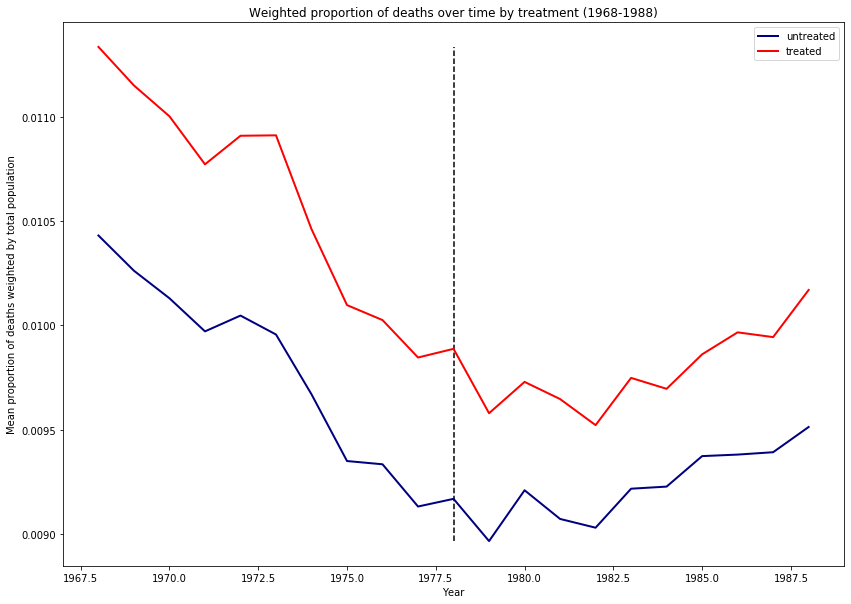

In [174]:
# Proportion of deaths WEIGHTED by total_population over time (weighted_mean)
untreated = [mortality_population_merged[mortality_population_merged["year"] == str(yr)].groupby("is_MUA"). \
                        apply(wavg, "proportion_deaths", "total_population_x")[0] for yr in years]

treated = [mortality_population_merged[mortality_population_merged["year"] == str(yr)].groupby("is_MUA"). \
                        apply(wavg, "proportion_deaths", "total_population_x")[1] for yr in years]

plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
plt.plot(years, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Weighted proportion of deaths over time by treatment (1968-1988)")
plt.xlabel("Year")
plt.ylabel("Mean proportion of deaths weighted by total population")
plt.vlines(1978, min(untreated), max(treated), linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

## ICD specific plots

In [175]:
def set_icd_category(value):
    if value <= 136:
        return "Infectious diseases"
    elif value <= 239:
        return "Neoplasm"
    elif value <= 279:
        return "Endocrin or Nutrition"
    elif value <=289:
        return "Diseases of the blood"
    elif value <= 315:
        return "Mental disorders"
    elif value <= 389:
        return "Nervous system"
    elif value <= 458:
        return "Circulatory system"
    elif value <= 519:
        return "Respiratory system"
    elif value <= 579:
        return "Gastrointestinal"
    elif value <= 629:
        return "Geneto-urinary"
    elif value <= 679:
        return "Pregnancy"
    elif value <= 709:
        return "Skin"
    elif value <= 739:
        return "Musculoskeletal"
    elif value <= 759:
        return "Conginetal"
    elif value <= 779:
        return "Perinatal"
    elif value <= 799:
        return "Symptoms and signs"
    elif (value<=999):
        return "Injury"
    else:
        return "Unclassified"

In [176]:
mortality['icd_0_3'] = mortality['icd'].str[0:3].astype(int)
mortality["icd_disease"] = mortality['icd_0_3'].apply(set_icd_category)
mortality

,0,county_fips,year,sex,age_category,icd,cause,num_deaths,icd_0,icd_0_3,icd_disease
0,0100119791045789780 1,01001,1979,1,04,5789,780,1,5,578,Gastrointestinal
1,0100119791047980770 1,01001,1979,1,04,7980,770,1,7,798,Symptoms and signs
2,0100119791088121800 1,01001,1979,1,08,8121,800,1,8,812,Injury
3,0100119791093439780 1,01001,1979,1,09,3439,780,1,3,343,Nervous system
4,0100119791098120800 2,01001,1979,1,09,8120,800,2,8,812,Injury
...,...,...,...,...,...,...,...,...,...,...,...
8774859,5604519782164124370 1,56045,1978,2,16,4124,370,1,4,412,Circulatory system
8774860,5604519782164339440 1,56045,1978,2,16,4339,440,1,4,433,Circulatory system
8774861,5604519782164442480 1,56045,1978,2,16,4442,480,1,4,444,Circulatory system
8774862,560451978216471 510 2,56045,1978,2,16,471,510,2,4,471,Respiratory system


In [177]:
estimate_error_maps = {"0-100": ("DiD (full sample)", "se_0"), "42-82": ("DiD (42, 82)", "se_1"), "52-72": ("DiD (52, 72)", "se_1")}

def create_icd_plots(category, start_imu_hat, end_imu_hat):
    years = np.arange(1968, 1988+1)
    
    years = np.delete(years, np.where(years == 1972))
    
    mortality_pop_subset_grouped = mortality_reshaped_pop_21.copy(deep=True)
    
    # Deaths for that cause as a proportion of total population (per 1000)
    mortality_pop_subset_grouped["required_outcome_deaths"] = mortality_reshaped_pop_21[[category]].sum(axis=1)
    mortality_pop_subset_grouped["proportion_deaths"] = mortality_pop_subset_grouped["required_outcome_deaths"]/mortality_pop_subset_grouped["total_population"] * 1000
    mortality_population_subset_merged = mortality_pop_subset_grouped.merge(new_dset, on="county_fips")
    
    mortality_population_subset_merged = mortality_population_subset_merged[mortality_population_subset_merged["imu_score_hat"].between(start_imu_hat, end_imu_hat)]
    
    # Raw num_deaths
    untreated = []
    treated = []

    for year in years:
        untreated_val = mortality_population_subset_merged[mortality_population_subset_merged["year"]==str(year)].groupby("is_MUA").sum().loc[0]["num_deaths"]
        treated_val = mortality_population_subset_merged[mortality_population_subset_merged["year"]==str(year)].groupby("is_MUA").sum().loc[1]["num_deaths"]
        untreated.append(untreated_val)
        treated.append(treated_val)
        
    plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
    plt.plot(years, treated, label="treated", color="red", lw=2.)

    # Create plot
    plt.title("{}: Mean mortality over time by treatment (1968-1988)".format(category))
    plt.xlabel("Year")
    plt.ylabel("Mortality rate (mean)")
    plt.xticks(years)
    plt.vlines(1978, min(treated), max(untreated), linestyles='dashed')
    plt.rcParams["figure.figsize"] = (14,10)
    plt.legend(loc="best")
    plt.savefig("images/mortality/raw/{}_{}-{}.png".format(category, start_imu_hat, end_imu_hat),bbox_inches='tight')
    plt.show()
    
    # Unweighted
    untreated = []
    treated = []

    for year in years:
        untreated_val = mortality_population_subset_merged[mortality_population_subset_merged["year"]==str(year)].groupby("is_MUA").mean().loc[0]["proportion_deaths"]
        treated_val = mortality_population_subset_merged[mortality_population_subset_merged["year"]==str(year)].groupby("is_MUA").mean().loc[1]["proportion_deaths"]
        untreated.append(untreated_val)
        treated.append(treated_val)

    plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
    plt.plot(years, treated, label="treated", color="red", lw=2.)

    # Create plot
    estimate_tuple = estimate_error_maps["{}-{}".format(int(start_imu_hat), int(end_imu_hat))]
    did_estimate = round(mega_table[mega_table["Outcome"] == category].iloc[0][estimate_tuple[0]], 4)
    did_se = round(mega_table[mega_table["Outcome"] == category].iloc[0][estimate_tuple[1]], 4)
    
    plt.title("{}: Mean proportion of deaths to total population over time by treatment (1968-1988), DiD estimate: {} ({})".format(category, did_estimate, did_se))
    plt.xlabel("Year")
    plt.ylabel("Proportion of deaths to total population (mean)")
    plt.xticks(years)
    plt.vlines(1978, min(untreated), max(treated), linestyles='dashed')
    plt.rcParams["figure.figsize"] = (14,10)
    plt.legend(loc="best")
    plt.savefig("images/mortality/unweighted/{}_{}-{}.png".format(category, start_imu_hat, end_imu_hat),bbox_inches='tight')
    plt.show()
    
    # Weighted
    # Proportion of deaths WEIGHTED by total_population over time (weighted_mean)

    untreated = [mortality_population_subset_merged[mortality_population_subset_merged["year"] == str(yr)].groupby("is_MUA"). \
                            apply(wavg, "proportion_deaths", "total_population_x")[0] for yr in years]

    treated = [mortality_population_subset_merged[mortality_population_subset_merged["year"] == str(yr)].groupby("is_MUA"). \
                            apply(wavg, "proportion_deaths", "total_population_x")[1] for yr in years]

    plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
    plt.plot(years, treated, label="treated", color="red", lw=2.)

    # Create plot
    plt.title("{}: Weighted proportion of deaths over time by treatment (1968-1988)".format(category))
    plt.xlabel("Year")
    plt.ylabel("Mean proportion of deaths weighted by total population")
    plt.vlines(1978, min(untreated), max(treated), linestyles='dashed')
    plt.xticks(years)
    plt.rcParams["figure.figsize"] = (14,10)
    plt.legend(loc="best")
    plt.savefig("images/mortality/weighted/{}_{}-{}.png".format(category, start_imu_hat, end_imu_hat),bbox_inches='tight')
    plt.show()

In [178]:
one_hot = pd.get_dummies(mortality['icd_disease'])
one_hot

,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,Infectious diseases,Injury,Mental disorders,Musculoskeletal,Neoplasm,Nervous system,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8774859,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8774860,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8774861,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8774862,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [179]:
mortality_collapsed = mortality.groupby(["county_fips", "year", "icd_disease"]).sum().reset_index()
mortality_collapsed

,county_fips,year,icd_disease,num_deaths,icd_0_3
0,01001,1968,Circulatory system,117,32953
1,01001,1968,Endocrin or Nutrition,1,250
2,01001,1968,Gastrointestinal,4,2263
3,01001,1968,Geneto-urinary,6,3551
4,01001,1968,Infectious diseases,2,126
...,...,...,...,...,...
803874,56045,1988,Injury,8,7390
803875,56045,1988,Mental disorders,3,890
803876,56045,1988,Neoplasm,17,2653
803877,56045,1988,Perinatal,1,761


In [180]:
one_hot = pd.get_dummies(mortality_collapsed['icd_disease'])
one_hot

,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,Infectious diseases,Injury,Mental disorders,Musculoskeletal,Neoplasm,Nervous system,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
803874,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
803875,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
803876,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
803877,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [181]:
causes_lst = ["Infectious diseases", "Neoplasm", "Endocrin or Nutrition", "Diseases of the blood", "Mental disorders",
       "Nervous system", "Circulatory system", "Respiratory system", "Gastrointestinal", "Geneto-urinary",
       "Pregnancy", "Skin", "Musculoskeletal", "Conginetal", "Perinatal", "Symptoms and signs", "Injury"]
causes_lst

['Infectious diseases',
 'Neoplasm',
 'Endocrin or Nutrition',
 'Diseases of the blood',
 'Mental disorders',
 'Nervous system',
 'Circulatory system',
 'Respiratory system',
 'Gastrointestinal',
 'Geneto-urinary',
 'Pregnancy',
 'Skin',
 'Musculoskeletal',
 'Conginetal',
 'Perinatal',
 'Symptoms and signs',
 'Injury']

In [182]:
mortality_reshaped = mortality_collapsed.join(one_hot).drop("icd_disease", axis=1)
mortality_reshaped[causes_lst] = mortality_reshaped[causes_lst].multiply(mortality_reshaped["num_deaths"], axis="index")
mortality_reshaped = mortality_reshaped.groupby(["county_fips", "year"]).sum().reset_index().drop(["icd_0_3"], axis=1)
mortality_reshaped

,county_fips,year,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,Infectious diseases,Injury,Mental disorders,Musculoskeletal,Neoplasm,Nervous system,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs
0,01001,1968,226,117,0,0,1,4,6,2,30,2,0,19,3,6,0,9,1,26
1,01001,1969,191,98,1,1,2,6,6,3,23,0,0,28,1,5,0,5,0,12
2,01001,1970,204,99,4,0,4,2,5,3,24,1,2,28,1,6,0,12,1,12
3,01001,1971,229,100,4,0,7,12,3,3,23,0,3,33,2,2,0,21,1,15
4,01001,1972,206,96,2,2,6,6,6,0,26,2,0,24,2,8,0,10,0,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64981,56045,1984,70,21,3,1,2,0,1,0,9,1,0,27,1,0,0,4,0,0
64982,56045,1985,53,21,0,0,3,2,2,0,7,0,0,8,1,0,0,7,0,2
64983,56045,1986,61,22,0,0,1,0,0,3,6,1,0,14,2,1,0,9,0,2
64984,56045,1987,50,20,0,0,0,1,0,0,5,0,0,17,0,2,0,4,0,1


In [183]:
only_21_counties = county_population.groupby("county_fips").count().reset_index()
only_21_counties = only_21_counties[only_21_counties["year"]==21]
only_21_counties

,county_fips,year,total_population,category_0,category_1,category_2,category_3,category_4,category_5,category_6,category_7,category_8,category_9,category_10,category_11
0,01001,21,21,21,21,21,21,21,21,21,21,21,21,21,21
1,01003,21,21,21,21,21,21,21,21,21,21,21,21,21,21
2,01005,21,21,21,21,21,21,21,21,21,21,21,21,21,21
3,01007,21,21,21,21,21,21,21,21,21,21,21,21,21,21
4,01009,21,21,21,21,21,21,21,21,21,21,21,21,21,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3110,56037,21,21,21,21,21,21,21,21,21,21,21,21,21,21
3111,56039,21,21,21,21,21,21,21,21,21,21,21,21,21,21
3112,56041,21,21,21,21,21,21,21,21,21,21,21,21,21,21
3113,56043,21,21,21,21,21,21,21,21,21,21,21,21,21,21


In [184]:
county_population_21 = county_population[county_population["county_fips"].isin(only_21_counties["county_fips"])]
mortality_reshaped_pop_21 = county_population_21[["year", "county_fips", "total_population"]].merge(mortality_reshaped, on=["year", "county_fips"], how="left")
mortality_reshaped_pop_21

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Injury,Mental disorders,Musculoskeletal,Neoplasm,Nervous system,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,30.0,2.0,0.0,19.0,3.0,6.0,0.0,9.0,1.0,26.0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,46.0,1.0,2.0,73.0,7.0,7.0,0.0,31.0,0.0,26.0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,25.0,1.0,0.0,43.0,3.0,5.0,1.0,22.0,0.0,13.0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,25.0,2.0,0.0,19.0,2.0,4.0,0.0,3.0,0.0,13.0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,29.0,1.0,0.0,44.0,2.0,5.0,0.0,9.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64675,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,27.0,3.0,0.0,32.0,4.0,0.0,0.0,17.0,0.0,1.0
64676,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,15.0,0.0,0.0,8.0,1.0,0.0,0.0,2.0,0.0,0.0
64677,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,19.0,2.0,0.0,12.0,1.0,0.0,0.0,9.0,0.0,1.0
64678,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,5.0,0.0,0.0,13.0,1.0,0.0,0.0,6.0,0.0,2.0


In [185]:
# Sanity check - should be equal to total # of deaths
mortality_reshaped_pop_21[causes_lst].sum(axis=1)

0        226.0
1        507.0
2        306.0
3        169.0
4        253.0
         ...  
64675    168.0
64676     56.0
64677     79.0
64678     69.0
64679     67.0
Length: 64680, dtype: float64

In [186]:
def return_diff_in_diff_estimate(categories, outcome_var, start_imu_hat, end_imu_hat):
    """
    categories: list of mortality categories (cause of death)
    start_imu_hat: Starting IMU_hat score for range
    end_imu_hat: Ending IMU_hat score for range
    """
    years = np.arange(1968, 1988+1)
    years = np.delete(years, np.where(years == 1972))
    
    mortality_pop_subset_grouped = mortality_reshaped_pop_21.copy(deep=True)
    mortality_pop_subset_grouped["year"] = mortality_pop_subset_grouped["year"].astype(int)
    mortality_pop_subset_grouped = mortality_pop_subset_grouped[mortality_pop_subset_grouped["year"].isin(years)]
    
    # Deaths for that cause as a proportion of total population (per 1000)
    mortality_pop_subset_grouped["required_outcome_deaths"] = mortality_reshaped_pop_21[categories].sum(axis=1)
    mortality_pop_subset_grouped["proportion_deaths"] = mortality_pop_subset_grouped["required_outcome_deaths"]/mortality_pop_subset_grouped["total_population"] * 1000
    # Join with our MUA dataset (only non-metropolitan counties)
    mortality_population_subset_merged = mortality_pop_subset_grouped.merge(new_dset, on="county_fips")
    
    # Only taking counties between (imu_start, imu_end)
    mortality_population_subset_merged = mortality_population_subset_merged[mortality_population_subset_merged["imu_score_hat"].between(start_imu_hat, end_imu_hat)]
    
    # Removing year 1972    
    mortality_population_subset_merged = mortality_population_subset_merged[mortality_population_subset_merged["year"]!="1972"]
    
    # Variables for the regression
    outcome = mortality_population_subset_merged[outcome_var]
    t = (mortality_population_subset_merged["year"].astype(int)>=1978).astype(int)
    mua = mortality_population_subset_merged["is_MUA"]
    county_fips = mortality_population_subset_merged["county_fips"]

    # Preparing the regression
    Y = outcome
    X = pd.DataFrame()
    X["t"] = t
    X["is_MUA"] = mua
    X["t * is_MUA"] = t * mua
    X = sm.add_constant(X)

    ols_model = sm.OLS(Y, X)
    ols_results = ols_model.fit(cov_type='cluster', cov_kwds={'groups': county_fips})
    did_estimate = ols_results.params["t * is_MUA"]
    did_se = ols_results.bse["t * is_MUA"]
    print("Parameter returned: {}, with SE: {}".format(did_estimate, did_se))
    
    # Additional parameters 
    n = len(mortality_population_subset_merged)
    mean_treatment = np.mean(mortality_population_subset_merged[(mortality_population_subset_merged["year"]==1977) & (mortality_population_subset_merged["is_MUA"]==1)][outcome_var])
    mean_control = np.mean(mortality_population_subset_merged[(mortality_population_subset_merged["year"]==1977) & (mortality_population_subset_merged["is_MUA"]==0)][outcome_var])
    print("N: {}, mean_treatment: {}, mean_control: {}".format(n, mean_treatment, mean_control))
    
    return did_estimate, did_se, n, mean_treatment, mean_control

## Create mega diff-in-diff table

In [187]:
# Construct dataframe
mega_table = pd.DataFrame(columns=["Outcome", "DiD (full sample)", "se_0", "N_0", "mt_0", "mc_0", "DiD (42, 82)", "se_1", "N_1", "mt_1", "mc_1", "DiD (52, 72)", "se_2", "N_2", "mt_2", "mc_2"])

# Create row for total population
pop_full_sample = return_diff_in_diff_estimate(causes_lst, "total_population_x", 0.0, 100.0)
pop_subset_1 = return_diff_in_diff_estimate(causes_lst, "total_population_x", 42.0, 82.0)
pop_subset_2 = return_diff_in_diff_estimate(causes_lst, "total_population_x", 52.0, 72.0)
mega_table.loc[len(mega_table)] = ["total_population", pop_full_sample[0], pop_full_sample[1], pop_full_sample[2], pop_full_sample[3], pop_full_sample[4],
                                   pop_subset_1[0], pop_subset_1[1], pop_subset_1[2], pop_subset_1[3], pop_subset_1[4],
                                   pop_subset_2[0], pop_subset_2[1], pop_subset_2[2], pop_subset_2[3], pop_subset_2[4]]
mega_table

Parameter returned: -2213.904258281478, with SE: 296.07626699004874
N: 51440, mean_treatment: 18632.19009100101, mean_control: 37668.81238155401
Parameter returned: -1156.8247415761332, with SE: 321.4235621306791
N: 39380, mean_treatment: 20865.243004418262, mean_control: 28782.96899224806
Parameter returned: -699.9534026375559, with SE: 452.2683654453969
N: 21540, mean_treatment: 22520.813513513513, mean_control: 23244.0099009901


,Outcome,DiD (full sample),se_0,N_0,mt_0,mc_0,"DiD (42, 82)",se_1,N_1,mt_1,mc_1,"DiD (52, 72)",se_2,N_2,mt_2,mc_2
0,total_population,-2213.904258,296.076267,51440,18632.190091,37668.812382,-1156.824742,321.423562,39380,20865.243004,28782.968992,-699.953403,452.268365,21540,22520.813514,23244.009901


In [188]:
# Create row for total mortality
mortality_full_sample = return_diff_in_diff_estimate(causes_lst, "proportion_deaths", 0.0, 100.0)
mortality_subset_1 = return_diff_in_diff_estimate(causes_lst, "proportion_deaths", 42.0, 82.0)
mortality_subset_2 = return_diff_in_diff_estimate(causes_lst, "proportion_deaths", 52.0, 72.0)
mega_table.loc[len(mega_table)] = ["overall_mortality", mortality_full_sample[0], mortality_full_sample[1], mortality_full_sample[2], mortality_full_sample[3], mortality_full_sample[4],
                                   mortality_subset_1[0], mortality_subset_1[1], mortality_subset_1[2], mortality_subset_1[3], mortality_subset_1[4],
                                   mortality_subset_2[0], mortality_subset_2[1], mortality_subset_2[2], mortality_subset_2[3], mortality_subset_2[4]]
mega_table

Parameter returned: -0.08516296937010467, with SE: 0.04082580398101164
N: 51440, mean_treatment: 10.457803272630564, mean_control: 9.702325451230207
Parameter returned: -0.05162397226354917, with SE: 0.048662443810400996
N: 39380, mean_treatment: 10.335777710939857, mean_control: 9.890770008247266
Parameter returned: -0.045467589172117295, with SE: 0.06629365022643814
N: 21540, mean_treatment: 10.291846610031506, mean_control: 10.0534746542886


,Outcome,DiD (full sample),se_0,N_0,mt_0,mc_0,"DiD (42, 82)",se_1,N_1,mt_1,mc_1,"DiD (52, 72)",se_2,N_2,mt_2,mc_2
0,total_population,-2213.904258,296.076267,51440,18632.190091,37668.812382,-1156.824742,321.423562,39380,20865.243004,28782.968992,-699.953403,452.268365,21540,22520.813514,23244.009901
1,overall_mortality,-0.085163,0.040826,51440,10.457803,9.702325,-0.051624,0.048662,39380,10.335778,9.890770,-0.045468,0.066294,21540,10.291847,10.053475


In [189]:
# Construct for all causes
for cause in causes_lst:
    print(cause)
    cause_full_sample = return_diff_in_diff_estimate([cause], "proportion_deaths", 0.0, 100.0)
    cause_subset_1 = return_diff_in_diff_estimate([cause], "proportion_deaths", 42.0, 82.0)
    cause_subset_2 = return_diff_in_diff_estimate([cause], "proportion_deaths", 52.0, 72.0)
    mega_table.loc[len(mega_table)] = [cause, cause_full_sample[0], cause_full_sample[1], cause_full_sample[2], cause_full_sample[3], cause_full_sample[4],
                                       cause_subset_1[0], cause_subset_1[1], cause_subset_1[2], cause_subset_1[3], cause_subset_1[4],
                                       cause_subset_2[0], cause_subset_2[1], cause_subset_2[2], cause_subset_2[3], cause_subset_2[4]]
    print("--------")

mega_table

Infectious diseases
Parameter returned: -0.00855277703700409, with SE: 0.002270935280204164
N: 51440, mean_treatment: 0.0952703785807892, mean_control: 0.07016632070151188
Parameter returned: -0.0009699958940763102, with SE: 0.002535830048201111
N: 39380, mean_treatment: 0.08984282356176618, mean_control: 0.07209474470602206
Parameter returned: -0.0007168334887028389, with SE: 0.0035591580462031374
N: 21540, mean_treatment: 0.0898663930397245, mean_control: 0.07540576741332698
--------
Neoplasm
Parameter returned: 0.040780123522176324, with SE: 0.011890212707633399
N: 51440, mean_treatment: 1.8429571143844061, mean_control: 1.8451929115264958
Parameter returned: 0.02394234859717114, with SE: 0.014002887088483334
N: 39380, mean_treatment: 1.849252635707061, mean_control: 1.8662828889196428
Parameter returned: 0.0002046242979702297, with SE: 0.01908598143465998
N: 21540, mean_treatment: 1.8862213383115338, mean_control: 1.8882401474867392
--------
Endocrin or Nutrition
Parameter returned

--------


,Outcome,DiD (full sample),se_0,N_0,mt_0,mc_0,"DiD (42, 82)",se_1,N_1,mt_1,mc_1,"DiD (52, 72)",se_2,N_2,mt_2,mc_2
0,total_population,-2213.904258,296.076267,51440,18632.190091,37668.812382,-1156.824742,321.423562,39380,20865.243004,28782.968992,-699.953403,452.268365,21540,22520.813514,23244.009901
1,overall_mortality,-0.085163,0.040826,51440,10.457803,9.702325,-0.051624,0.048662,39380,10.335778,9.890770,-0.045468,0.066294,21540,10.291847,10.053475
2,Infectious diseases,-0.008553,0.002271,51440,0.095270,0.070166,-0.000970,0.002536,39380,0.089843,0.072095,-0.000717,0.003559,21540,0.089866,0.075406
3,Neoplasm,0.040780,0.011890,51440,1.842957,1.845193,0.023942,0.014003,39380,1.849253,1.866283,0.000205,0.019086,21540,1.886221,1.888240
4,Endocrin or Nutrition,0.000180,0.004099,51440,0.226729,0.210903,0.000315,0.004710,39380,0.223240,0.213221,-0.003282,0.006611,21540,0.229120,0.216966
5,Diseases of the blood,-0.001189,0.001111,51440,0.030363,0.027998,-0.000324,0.001280,39380,0.030224,0.029099,-0.000949,0.001719,21540,0.029781,0.029722
6,Mental disorders,-0.001901,0.002047,51440,0.047032,0.045719,-0.002332,0.002384,39380,0.046091,0.046325,0.003006,0.003516,21540,0.042125,0.048765
7,Nervous system,-0.004029,0.002407,51440,0.083535,0.086290,-0.001322,0.002741,39380,0.082251,0.087585,0.000885,0.003835,21540,0.079103,0.092368
8,Circulatory system,-0.034733,0.028986,51440,5.470788,5.177181,-0.014129,0.033822,39380,5.454884,5.290399,0.022462,0.044959,21540,5.467526,5.372008
9,Respiratory system,-0.020197,0.007620,51440,0.637185,0.610431,-0.018050,0.009016,39380,0.645138,0.622107,-0.020516,0.012299,21540,0.642359,0.646551


In [190]:
mega_table_rounded = mega_table.round(5)

In [191]:
mega_table_rounded.to_excel("output/mortality_did_se.xlsx", index=False)

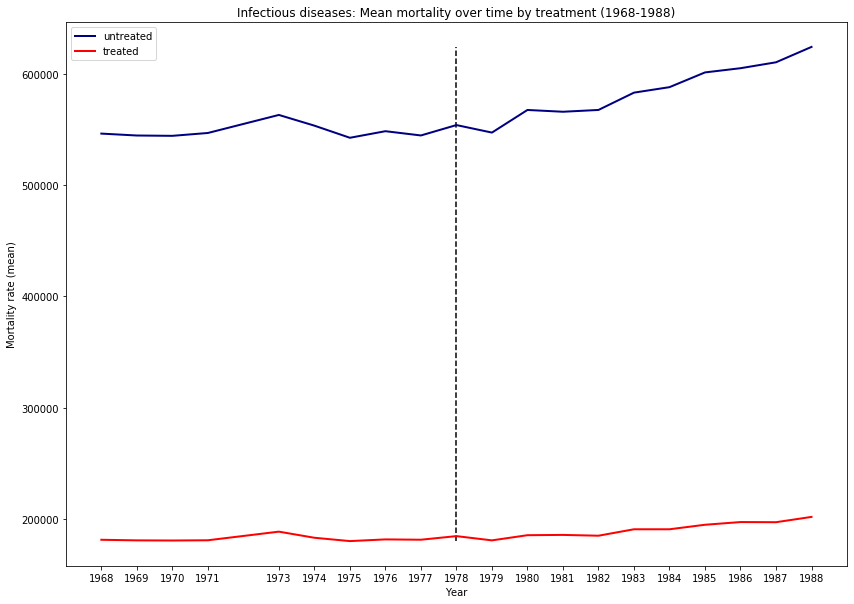

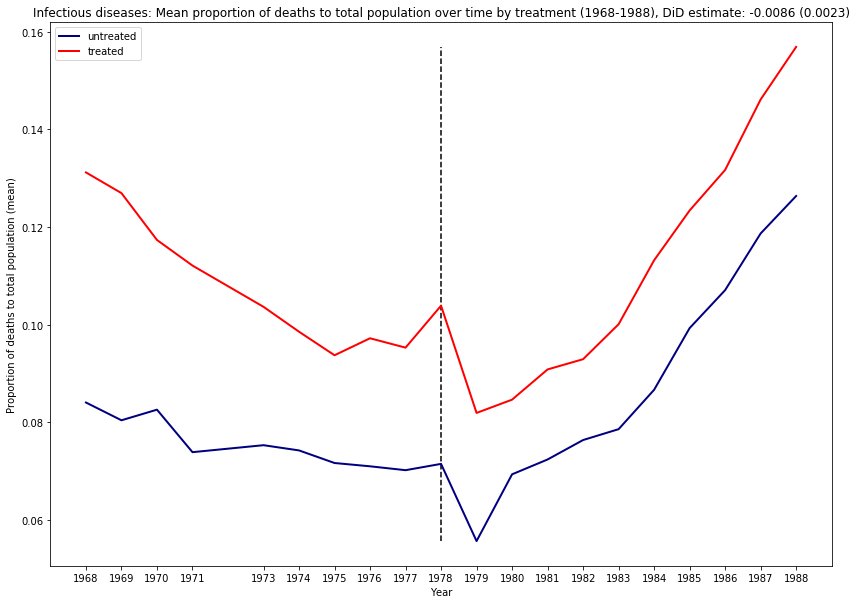

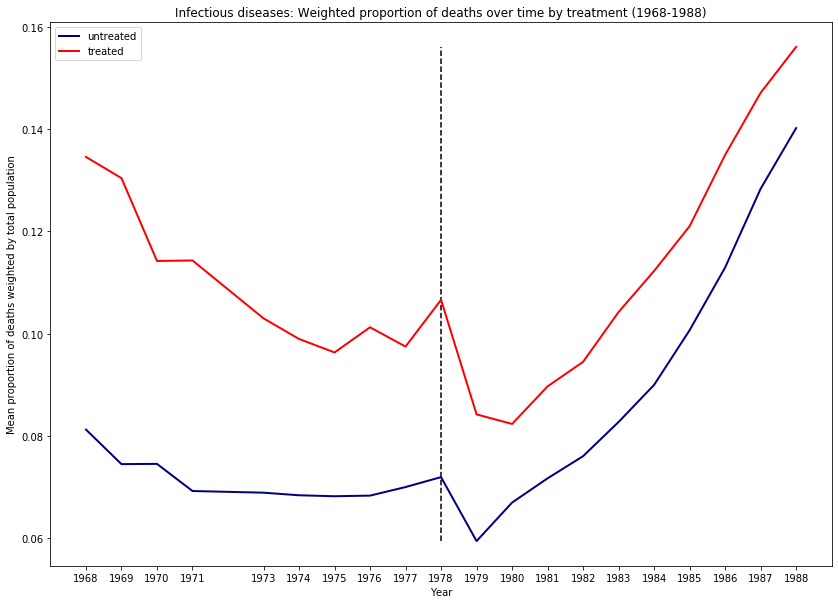

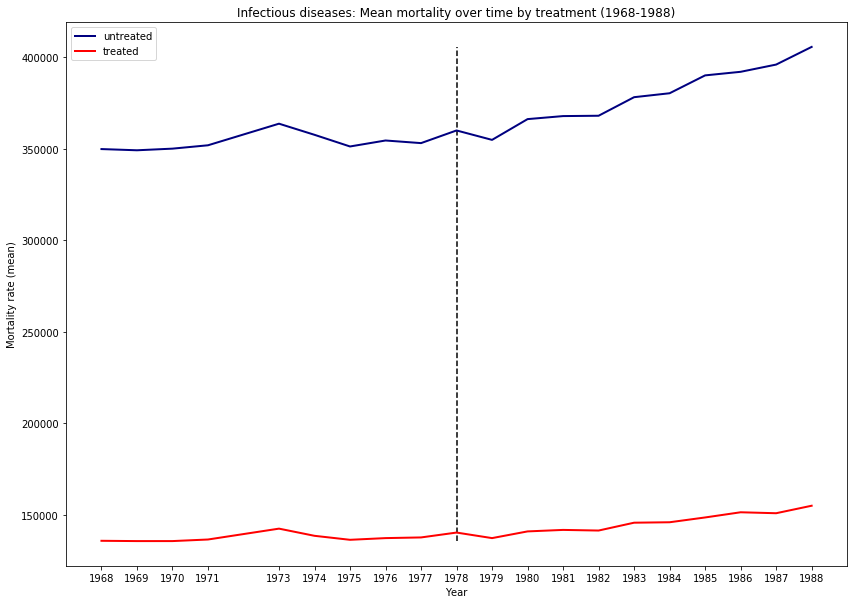

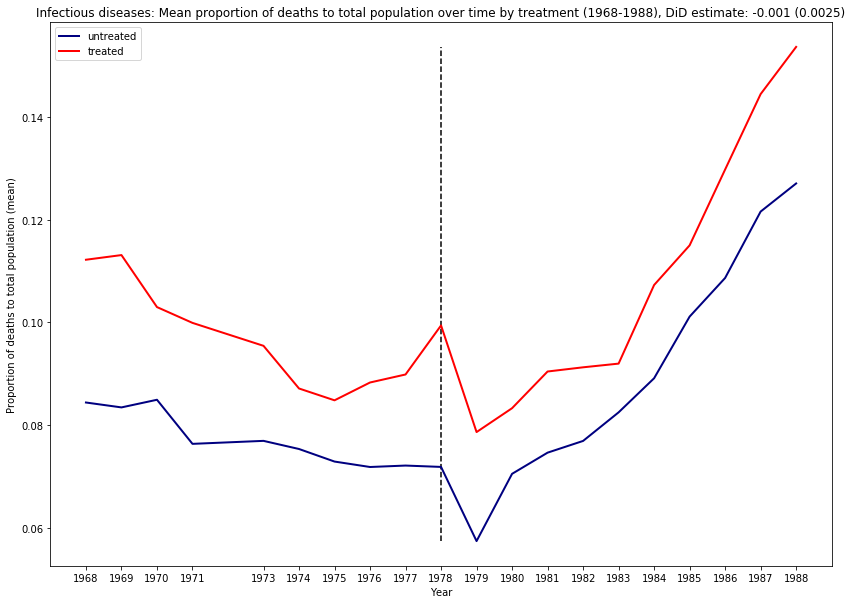

...

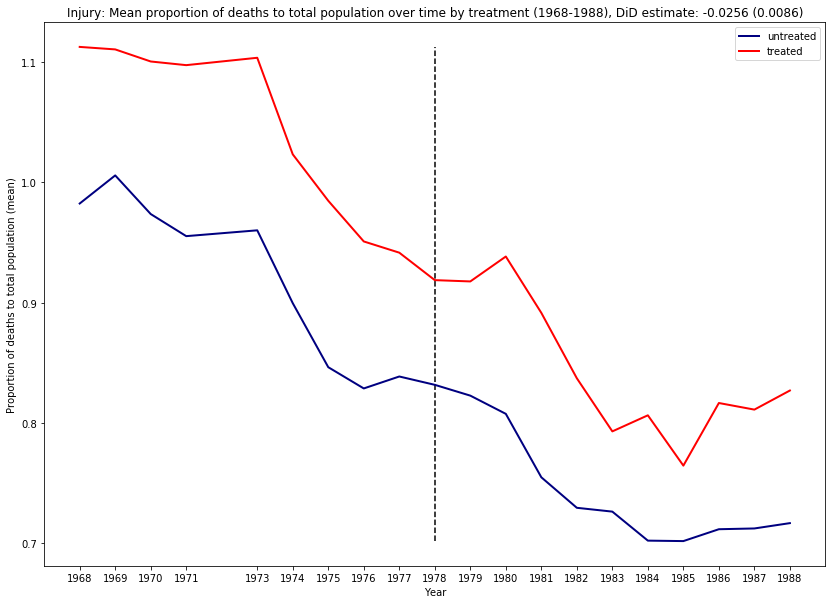

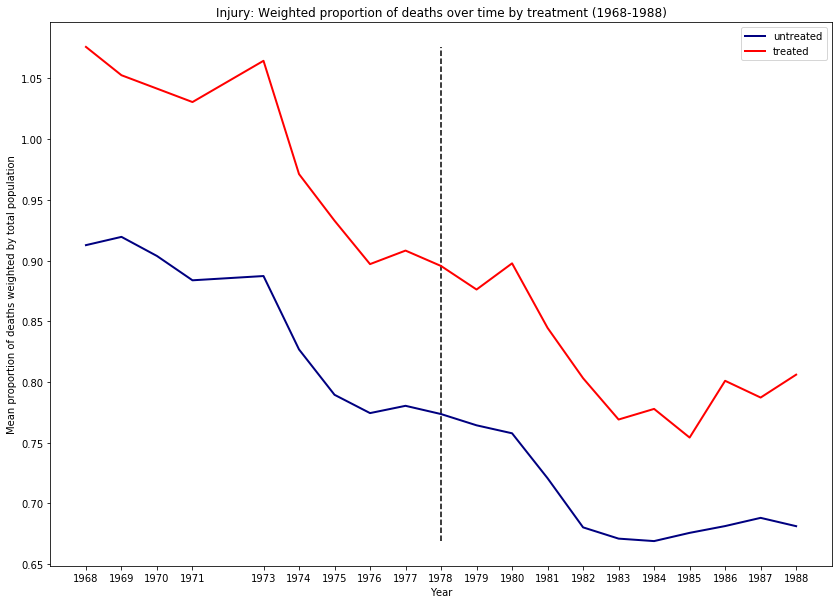

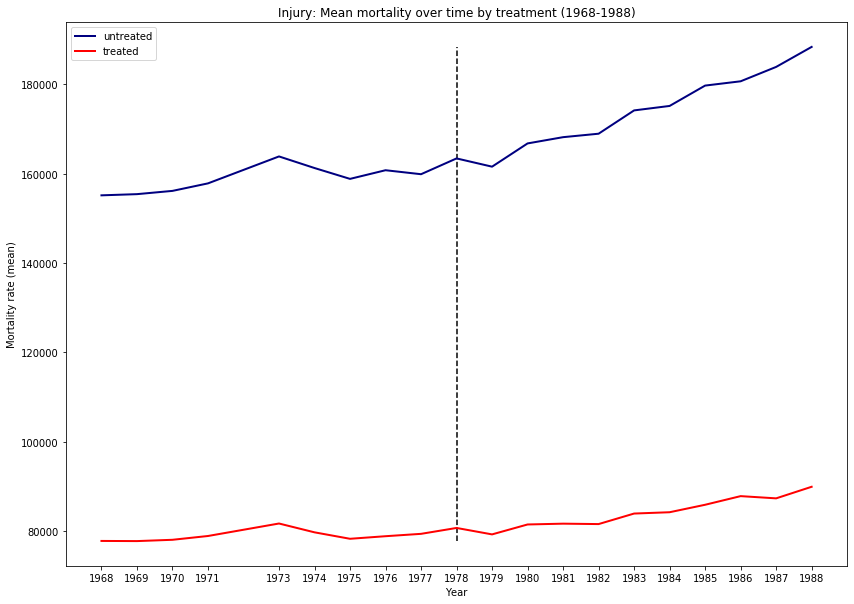

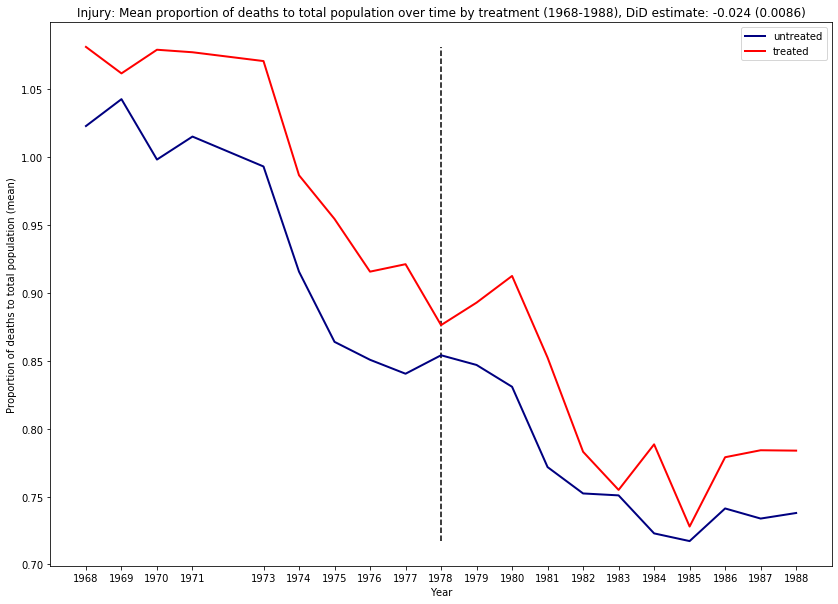

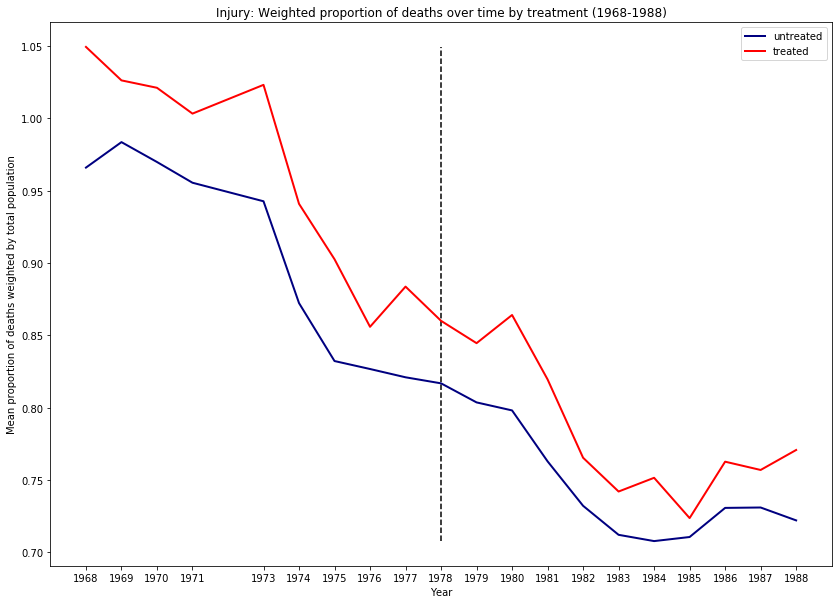

In [192]:
for cause in causes_lst:
    create_icd_plots(cause, 0, 100)
    create_icd_plots(cause, 42, 82)
    create_icd_plots(cause, 52, 72)

### Plot for `num_deaths` (across all ICD-8 codes)

In [193]:
years = np.arange(1968, 1988+1)
years = np.delete(years, np.where(years == 1972))

untreated = []
treated = []

for year in years:
    untreated_val = mortality_merged[mortality_merged["year"]==str(year)].groupby("is_MUA_hat").mean().loc[0]["num_deaths"]
    treated_val = mortality_merged[mortality_merged["year"]==str(year)].groupby("is_MUA_hat").mean().loc[1]["num_deaths"]
    untreated.append(untreated_val)
    treated.append(treated_val)

In [194]:
# Note that 1972 has half the data
mortality_merged.groupby("year").count()

,county_fips,num_deaths,State,State_Abbr,County,imu_subscore_4,num_physicians,physicians_per_1000_population,live_births,infant_deaths,...,FP,TN,FN,class,NAME,is_MUA_new,FIPS,imu_fs,imu_ceil,imu_ceil_new
year,,,,,,,,,,,,,,,,,,,,,
1968,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572,...,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572
1969,2571,2571,2571,2571,2571,2571,2571,2571,2571,2571,...,2571,2571,2571,2571,2571,2571,2571,2571,2571,2571
1970,2571,2571,2571,2571,2571,2571,2571,2571,2571,2571,...,2571,2571,2571,2571,2571,2571,2571,2571,2571,2571
1971,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572,...,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572
1972,2570,2570,2570,2570,2570,2570,2570,2570,2570,2570,...,2570,2570,2570,2570,2570,2570,2570,2570,2570,2570
1973,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572,...,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572
1974,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572,...,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572
1975,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572,...,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572
1976,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572,...,2572,2572,2572,2572,2572,2572,2572,2572,2572,2572


In [195]:
mortality_merged.shape

(54001, 37)

In [196]:
mortality_merged.groupby("year").mean()

,num_deaths,imu_subscore_4,num_physicians,physicians_per_1000_population,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2,persons_in_poverty_1970,total_population,...,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,is_MUA_new,imu_fs,imu_ceil,imu_ceil_new
year,,,,,,,,,,,,,,,,,,,,,
1968,282.908631,15.658281,22.544712,0.567964,2343.702955,53.036159,23.171654,14.089813,4688.157854,27105.832037,...,0.384526,61.781104,0.325039,0.157465,0.458009,0.059487,0.539269,62.407659,62.851866,62.851866
1969,282.143524,15.664372,22.553481,0.568185,2344.612991,53.056398,23.083429,14.095294,4689.964994,27116.311163,...,0.384675,61.792688,0.325165,0.157137,0.458187,0.059510,0.539090,62.419837,62.863866,62.863866
1970,281.982108,15.664372,22.553481,0.568185,2344.612991,53.056398,23.083429,14.095294,4689.964994,27116.311163,...,0.384675,61.792688,0.325165,0.157137,0.458187,0.059510,0.539090,62.419837,62.863866,62.863866
1971,282.950233,15.658281,22.544712,0.567964,2343.702955,53.036159,23.171654,14.089813,4688.157854,27105.832037,...,0.384526,61.781104,0.325039,0.157465,0.458009,0.059487,0.539269,62.407659,62.851866,62.851866
1972,290.306615,15.670467,22.562257,0.568406,2345.508171,53.077043,23.092411,14.090661,4691.743969,27126.516732,...,0.384436,61.791440,0.325292,0.157198,0.458366,0.059144,0.539300,62.420973,62.864981,62.864981
1973,292.260498,15.658281,22.544712,0.567964,2343.702955,53.036159,23.171654,14.089813,4688.157854,27105.832037,...,0.384526,61.781104,0.325039,0.157465,0.458009,0.059487,0.539269,62.407659,62.851866,62.851866
1974,286.391135,15.658281,22.544712,0.567964,2343.702955,53.036159,23.171654,14.089813,4688.157854,27105.832037,...,0.384526,61.781104,0.325039,0.157465,0.458009,0.059487,0.539269,62.407659,62.851866,62.851866
1975,280.989502,15.658281,22.544712,0.567964,2343.702955,53.036159,23.171654,14.089813,4688.157854,27105.832037,...,0.384526,61.781104,0.325039,0.157465,0.458009,0.059487,0.539269,62.407659,62.851866,62.851866
1976,283.874417,15.658281,22.544712,0.567964,2343.702955,53.036159,23.171654,14.089813,4688.157854,27105.832037,...,0.384526,61.781104,0.325039,0.157465,0.458009,0.059487,0.539269,62.407659,62.851866,62.851866


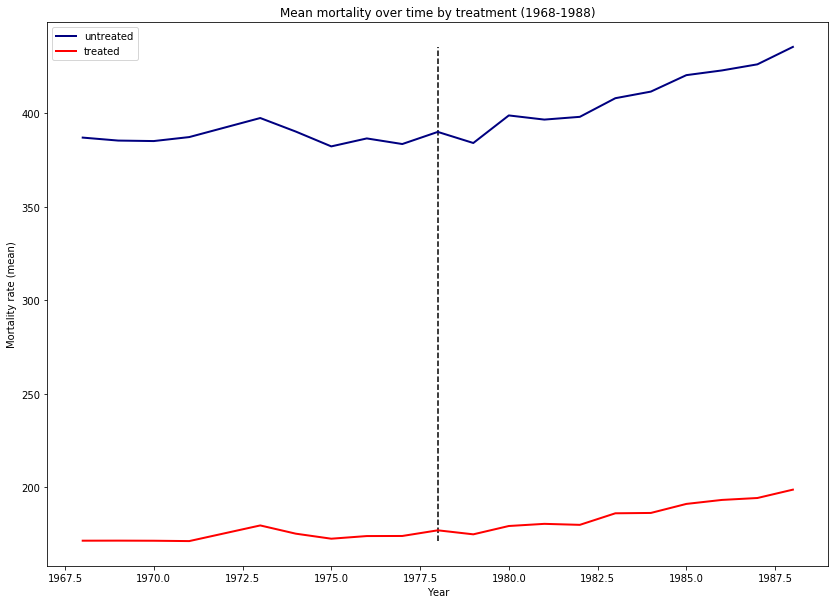

In [197]:
plt.plot(years, untreated, label="untreated", color="navy", lw=2.)
plt.plot(years, treated, label="treated", color="red", lw=2.)

# Create plot
plt.title("Mean mortality over time by treatment (1968-1988)")
plt.xlabel("Year")
plt.ylabel("Mortality rate (mean)")
#plt.xticks(np.arange(1960, 1973, 1))
plt.vlines(1978, min(treated), max(untreated), linestyles='dashed')
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.savefig("images/mortality/overall_mortality_mean.png", bbox_inches="tight")
plt.show()

In [198]:
mortality_merged.describe()

,num_deaths,imu_subscore_4,num_physicians,physicians_per_1000_population,live_births,infant_deaths,infant_mortality_rate,imu_subscore_2,persons_in_poverty_1970,total_population,...,is_MUA,imu_score_hat_ceil,TP,FP,TN,FN,is_MUA_new,imu_fs,imu_ceil,imu_ceil_new
count,54001.00000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,5.400100e+04,...,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000,54001.000000
mean,293.09248,15.661471,22.549305,0.568080,2344.177774,53.046832,23.143968,14.090758,4689.102387,2.711129e+04,...,0.384567,61.784689,0.325105,0.157367,0.458066,0.059462,0.539249,62.411696,62.855855,62.855855
std,528.52356,8.309886,87.935471,0.501591,4638.554328,92.239168,8.959547,6.739585,5338.253159,5.486739e+04,...,0.486497,15.845763,0.468418,0.364150,0.498243,0.236489,0.498462,14.193454,14.190256,14.190256
min,1.00000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,17.000000,1.640000e+02,...,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.100000,19.000000,19.000000
25%,99.00000,9.000000,3.000000,0.332171,638.000000,13.000000,17.935046,8.500000,1677.000000,8.222000e+03,...,0.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.200000,54.000000,54.000000
50%,183.00000,14.800000,7.000000,0.490884,1301.000000,31.000000,22.099448,15.300000,3208.000000,1.581000e+04,...,0.000000,63.000000,0.000000,0.000000,0.000000,0.000000,1.000000,61.100000,62.000000,62.000000
75%,326.00000,23.100000,18.000000,0.713842,2587.000000,62.000000,27.284946,19.500000,5952.000000,2.948100e+04,...,1.000000,75.000000,1.000000,0.000000,1.000000,0.000000,1.000000,73.800000,74.000000,74.000000
max,13125.00000,28.700000,2238.000000,12.546321,119504.000000,2113.000000,250.000000,26.000000,88903.000000,1.397268e+06,...,1.000000,96.000000,1.000000,1.000000,1.000000,1.000000,1.000000,95.900000,96.000000,96.000000


## Reduced form models for outcomes

### 1. Number of physicians

In [199]:
yr = "1980"

num_physicians_merged['imu_score_hat_ceil'] = np.ceil(num_physicians_merged['imu_score_hat'])
stats_outcome = num_physicians_merged.groupby('imu_score_hat_ceil')[yr].agg(['count', 'mean']).reset_index()
stats_outcome

,imu_score_hat_ceil,count,mean
0,20.0,3,0.000000
1,22.0,1,2.000000
2,23.0,1,0.000000
3,24.0,2,3.000000
4,25.0,4,29.500000
...,...,...,...
70,91.0,8,84.750000
71,92.0,12,257.166667
72,93.0,4,121.750000
73,95.0,1,25.000000


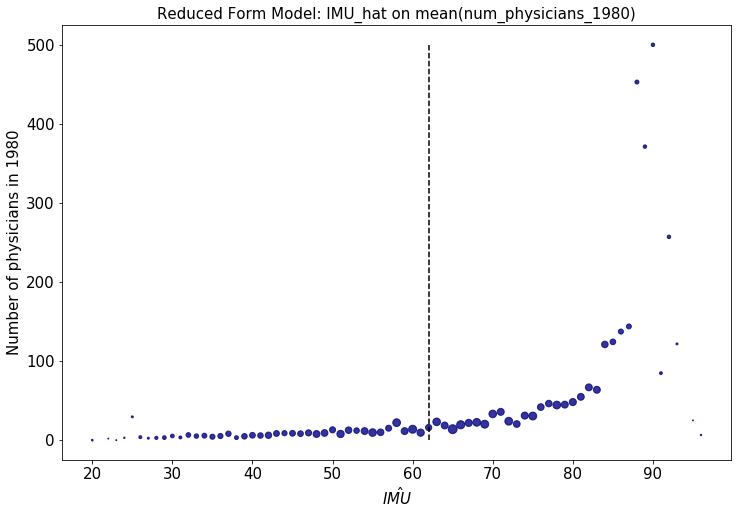

In [200]:
# With IMU_score_hat ceiling and mean(num_physicians) on Y-axis
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_outcome['imu_score_hat_ceil'], stats_outcome['mean'], color='navy', alpha=0.8, s=stats_outcome['count'])
plt.xlabel("$\hat{IMU}$", fontsize=15)
plt.ylabel("Number of physicians in {}".format(yr), fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 101, 10))
plt.yticks(fontsize=15)
plt.title('Reduced Form Model: IMU_hat on mean(num_physicians_{})'.format(yr),fontsize=15)
plt.vlines(62, 0, max(stats_outcome['mean']), linestyles='dashed');

In [201]:
yr = "1980"

num_physicians_merged['imu_fs_ceil'] = np.ceil(num_physicians_merged['imu_fs'])
stats_outcome_2 = num_physicians_merged.groupby('imu_fs_ceil')[yr].agg(['count', 'mean']).reset_index()
stats_outcome_2

,imu_fs_ceil,count,mean
0,19.0,1,6.000000
1,20.0,1,0.000000
2,22.0,2,3.500000
3,24.0,4,2.250000
4,25.0,4,28.750000
...,...,...,...
70,91.0,8,84.750000
71,92.0,11,280.454545
72,93.0,4,121.750000
73,95.0,1,25.000000


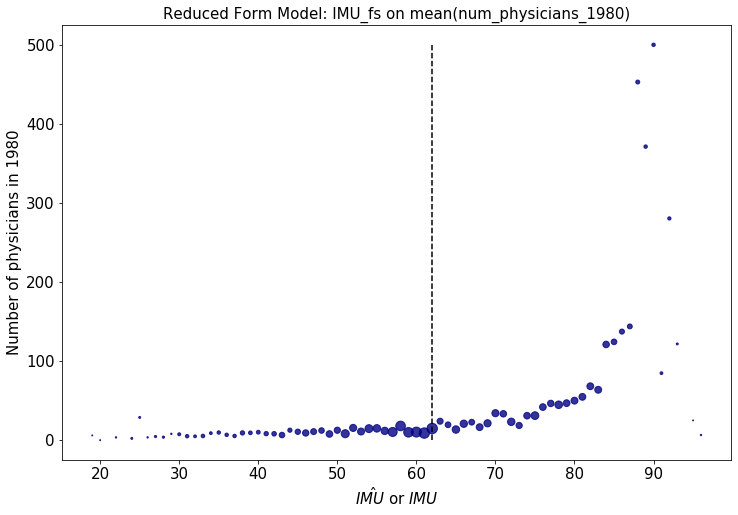

In [202]:
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_outcome_2['imu_fs_ceil'], stats_outcome_2['mean'], color='navy', alpha=0.8, s=stats_outcome_2['count'])
plt.xlabel("$\hat{IMU}$ or $IMU$", fontsize=15)
plt.ylabel("Number of physicians in {}".format(yr), fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(0, 101, 10))
plt.yticks(fontsize=15)
plt.title('Reduced Form Model: IMU_fs on mean(num_physicians_{})'.format(yr),fontsize=15)
plt.vlines(62, 0, max(stats_outcome_2['mean']), linestyles='dashed');

### 2. Infant mortality rate

In [203]:
yr = "1972"

outcome_dset = infant_data_merged_main[infant_data_merged_main["YEAR"]==int(yr)]

outcome_dset['imu_score_hat_ceil'] = np.ceil(outcome_dset['imu_score_hat'])
stats_outcome = outcome_dset.groupby('imu_score_hat_ceil')["infant_mortality_rate_year"].agg(['count', 'mean']).reset_index()
stats_outcome

,imu_score_hat_ceil,count,mean
0,20.0,3,56.759546
1,22.0,1,41.666667
2,23.0,1,55.555556
3,24.0,2,12.781497
4,25.0,4,21.861443
...,...,...,...
70,91.0,8,8.572840
71,92.0,12,12.511915
72,93.0,4,8.160613
73,95.0,1,73.170732


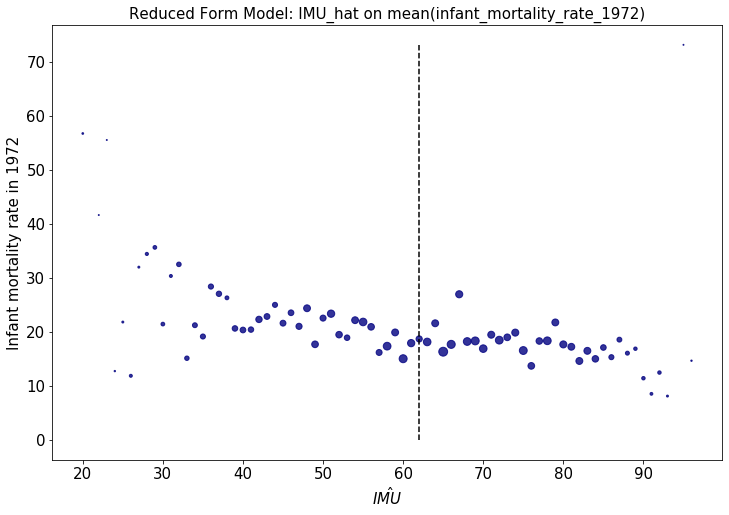

In [204]:
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_outcome['imu_score_hat_ceil'], stats_outcome['mean'], color='navy', alpha=0.8, s=stats_outcome['count'])
plt.xlabel("$\hat{IMU}$", fontsize=15)
plt.ylabel("Infant mortality rate in {}".format(yr), fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('Reduced Form Model: IMU_hat on mean(infant_mortality_rate_{})'.format(yr),fontsize=15)
plt.vlines(62, 0, max(stats_outcome['mean']), linestyles='dashed');

In [205]:
yr = "1972"

outcome_dset = infant_data_merged_main[infant_data_merged_main["YEAR"]==int(yr)]

outcome_dset['imu_fs_ceil'] = np.ceil(outcome_dset['imu_fs'])
stats_outcome_2 = outcome_dset.groupby('imu_fs_ceil')["infant_mortality_rate_year"].agg(['count', 'mean']).reset_index()
stats_outcome_2

,imu_fs_ceil,count,mean
0,19.0,1,46.511628
1,20.0,1,117.647059
2,22.0,2,35.717133
3,24.0,4,48.289411
4,25.0,4,28.855367
...,...,...,...
70,91.0,8,8.572840
71,92.0,11,13.649362
72,93.0,4,8.160613
73,95.0,1,73.170732


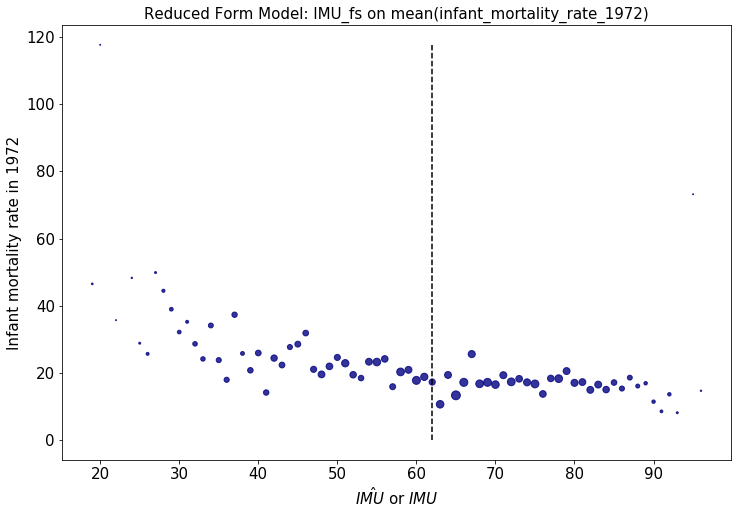

In [206]:
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_outcome_2['imu_fs_ceil'], stats_outcome_2['mean'], color='navy', alpha=0.8, s=stats_outcome['count'])
plt.xlabel("$\hat{IMU}$ or $IMU$", fontsize=15)
plt.ylabel("Infant mortality rate in {}".format(yr), fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('Reduced Form Model: IMU_fs on mean(infant_mortality_rate_{})'.format(yr),fontsize=15)
plt.vlines(62, 0, max(stats_outcome_2['mean']), linestyles='dashed');

## 3. Mortality

In [207]:
yr = "1972"

outcome_dset = mortality_merged[mortality_merged["year"]==yr]

outcome_dset['imu_score_hat_ceil'] = np.ceil(outcome_dset['imu_score_hat'])
stats_outcome = outcome_dset.groupby('imu_score_hat_ceil')["num_deaths"].agg(['count', 'mean']).reset_index()
stats_outcome

,imu_score_hat_ceil,count,mean
0,20.0,3,26.666667
1,22.0,1,158.000000
2,23.0,1,16.000000
3,24.0,2,83.000000
4,25.0,4,489.000000
...,...,...,...
70,91.0,8,384.000000
71,92.0,12,839.833333
72,93.0,4,651.500000
73,95.0,1,34.000000


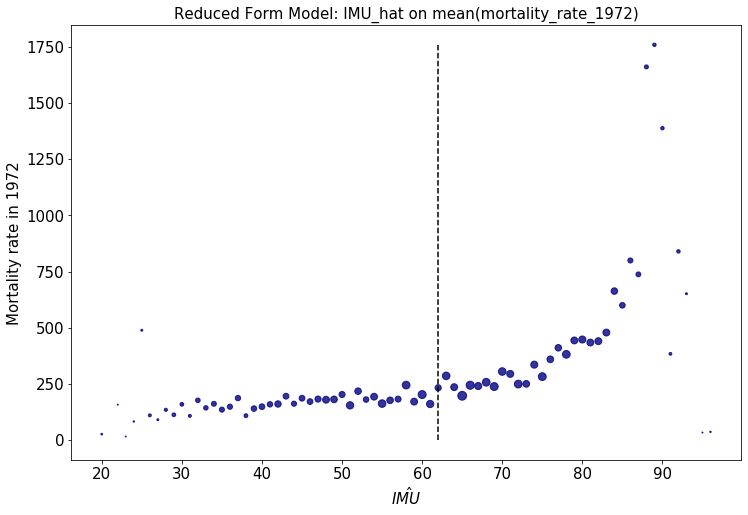

In [208]:
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_outcome['imu_score_hat_ceil'], stats_outcome['mean'], color='navy', alpha=0.8, s=stats_outcome['count'])
plt.xlabel("$\hat{IMU}$", fontsize=15)
plt.ylabel("Mortality rate in {}".format(yr), fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('Reduced Form Model: IMU_hat on mean(mortality_rate_{})'.format(yr),fontsize=15)
plt.vlines(62, 0, max(stats_outcome['mean']), linestyles='dashed');

In [209]:
yr = "1972"

outcome_dset = mortality_merged[mortality_merged["year"]==yr]

outcome_dset['imu_fs_ceil'] = np.ceil(outcome_dset['imu_fs'])
stats_outcome_2 = outcome_dset.groupby('imu_fs_ceil')["num_deaths"].agg(['count', 'mean']).reset_index()
stats_outcome_2

,imu_fs_ceil,count,mean
0,19.0,1,162.000000
1,20.0,1,24.000000
2,22.0,2,131.000000
3,24.0,4,64.500000
4,25.0,4,458.500000
...,...,...,...
70,91.0,8,384.000000
71,92.0,11,915.818182
72,93.0,4,651.500000
73,95.0,1,34.000000


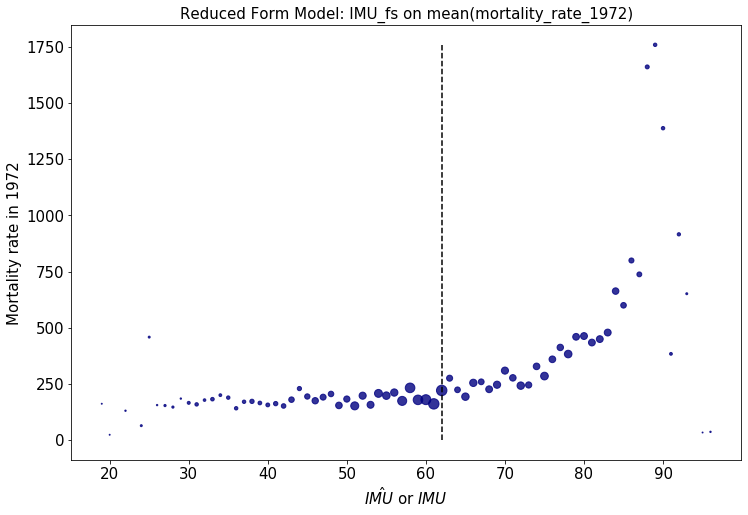

In [210]:
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(stats_outcome_2['imu_fs_ceil'], stats_outcome_2['mean'], color='navy', alpha=0.8, s=stats_outcome_2['count'])
plt.xlabel("$\hat{IMU}$ or $IMU$", fontsize=15)
plt.ylabel("Mortality rate in {}".format(yr), fontsize=15)
plt.xticks(fontsize=15)
plt.xticks(np.arange(20, 100, 10))
plt.yticks(fontsize=15)
plt.title('Reduced Form Model: IMU_fs on mean(mortality_rate_{})'.format(yr),fontsize=15)
plt.vlines(62, 0, max(stats_outcome['mean']), linestyles='dashed');

## Validate mortality statistics from NBER


In [211]:
nber = mortality_pop_grouped.groupby("year").sum().reset_index().drop("proportion_deaths", axis=1)
nber

,year,num_deaths,total_population
0,1968,1930082,199532338
1,1969,1921990,201567573
2,1970,1921031,203603563
3,1971,1927542,206937673
4,1972,1963944,209126534
5,1973,1973003,211130824
6,1974,1934388,213209874
7,1975,1892879,215387693
8,1976,1909440,217607997
9,1977,1899597,219974322


In [212]:
cdc = pd.read_csv("input/CDC/cdc_wonder_clpse_year_1968-1978.txt", delimiter="\t")
cdc = pd.concat([cdc, pd.read_csv("input/CDC/cdc_wonder_clpse_year_1979-1998.txt", delimiter="\t")], ignore_index=True)
cdc

,Notes,Year,Year Code,Deaths,Population,Crude Rate
0,NaN,1968,1968,1930082,199533564,967.30
1,NaN,1969,1969,1921990,201568206,953.52
2,NaN,1970,1970,1921031,203458035,944.19
3,NaN,1971,1971,1927542,206782970,932.16
4,NaN,1972,1972,1963944,209237411,938.62
5,NaN,1973,1973,1973003,211361965,933.47
6,NaN,1974,1974,1934388,213436958,906.30
7,NaN,1975,1975,1892879,215457198,878.54
8,NaN,1976,1976,1909440,217615788,877.44
9,NaN,1977,1977,1899597,219808632,864.20


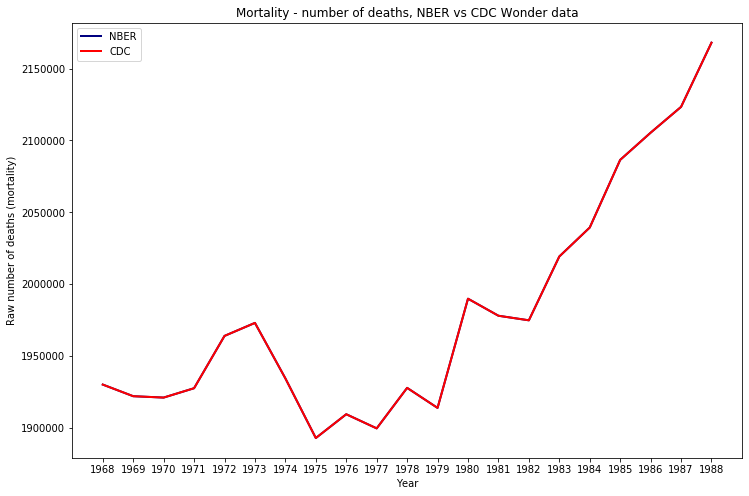

In [213]:
years = nber["year"]
plt.plot(years, nber["num_deaths"], label="NBER", color="navy", lw=2.)
plt.plot(years, cdc[cdc["Year"].isin(years)]["Deaths"], label="CDC", color="red", lw=2.)

# Create plot
plt.title("Mortality - number of deaths, NBER vs CDC Wonder data")
plt.xlabel("Year")
plt.ylabel("Raw number of deaths (mortality)")
plt.xticks(years)
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

In [214]:
years = clpse["year"]
plt.plot(years, nber["total_population"], label="NBER", color="navy", lw=2.)
plt.plot(years, cdc[cdc["Year"].isin(years)]["Population"], label="CDC", color="red", lw=2.)

# Create plot
plt.title("Population, NBER vs CDC Wonder data")
plt.xlabel("Year")
plt.ylabel("total_population")
plt.xticks(years)
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

NameError: name 'clpse' is not defined

In [ ]:
cdc_county_1968_1978 = pd.read_csv("input/CDC/cdc_wonder_clpse_year_county_1968-1978.txt", delimiter="\t",
                                  dtype={"County Code": str})
cdc_county_1968_1978

In [ ]:
cdc_county_1979_1987 = pd.read_csv("input/CDC/cdc_wonder_clpse_year_county_1979-1987.txt", delimiter="\t",
                                  dtype={"County Code": str})
cdc_county_1979_1987

In [ ]:
cdc_merged = pd.concat([cdc_county_1968_1978, cdc_county_1979_1987], ignore_index=True)
cdc_merged

## Creating plot only for non-metropolitan counties

In [ ]:
cdc_merged["Year"] = cdc_merged["Year"].astype(str)

cdc_nber_merged = mortality_population_merged.merge(cdc_merged, left_on=["county_fips", "year"], right_on=["County Code", "Year"])
cdc_nber_merged["Population"] = cdc_nber_merged["Population"].astype(int)
cdc_nber_merged["Deaths"] = cdc_nber_merged["Deaths"].astype(int)
cdc_nber_merged

In [ ]:
nonmetro_merged = cdc_nber_merged.groupby("year").sum().reset_index() \
                                [["year", "num_deaths", "total_population_x", "Population", "Deaths"]]
nonmetro_merged

In [ ]:
years = nonmetro_merged["year"]
plt.plot(years, nonmetro_merged["num_deaths"], label="NBER", color="navy", lw=2.)
plt.plot(years, nonmetro_merged["Deaths"], label="CDC", color="red", lw=2.)

# Create plot
plt.title("Mortality - number of deaths, NBER vs CDC Wonder data (Non-metropolitan counties only)")
plt.xlabel("Year")
plt.ylabel("Raw number of deaths (mortality)")
plt.xticks(years)
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

In [ ]:
years = nonmetro_merged["year"]
plt.plot(years, nonmetro_merged["total_population_x"], label="NBER", color="navy", lw=2.)
plt.plot(years, nonmetro_merged["Population"], label="CDC", color="red", lw=2.)

# Create plot
plt.title("Population, NBER vs CDC Wonder data (Non-metropolitan counties only)")
plt.xlabel("Year")
plt.ylabel("total_population")
plt.xticks(years)
plt.rcParams["figure.figsize"] = (14,10)
plt.legend(loc="best")
plt.show()

## Event study design: 04/30/2021

In [199]:
mortality_reshaped_pop_21

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Injury,Mental disorders,Musculoskeletal,Neoplasm,Nervous system,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,30.0,2.0,0.0,19.0,3.0,6.0,0.0,9.0,1.0,26.0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,46.0,1.0,2.0,73.0,7.0,7.0,0.0,31.0,0.0,26.0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,25.0,1.0,0.0,43.0,3.0,5.0,1.0,22.0,0.0,13.0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,25.0,2.0,0.0,19.0,2.0,4.0,0.0,3.0,0.0,13.0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,29.0,1.0,0.0,44.0,2.0,5.0,0.0,9.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64675,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,27.0,3.0,0.0,32.0,4.0,0.0,0.0,17.0,0.0,1.0
64676,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,15.0,0.0,0.0,8.0,1.0,0.0,0.0,2.0,0.0,0.0
64677,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,19.0,2.0,0.0,12.0,1.0,0.0,0.0,9.0,0.0,1.0
64678,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,5.0,0.0,0.0,13.0,1.0,0.0,0.0,6.0,0.0,2.0


In [200]:
single_county_reqd = single_county[["Medically Underserved Area/Population (MUA/P) Withdrawal Date", "Common State County FIPS Code", "Year", "MUA/P Status Description", "MUA/P ID"]]
single_county_reqd.rename(columns={"Year":"Designation_year"}, inplace=True)
single_county_reqd

,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year,MUA/P Status Description,MUA/P ID
59,NaN,48489,1978,Designated,1483609020
85,NaN,48149,1978,Designated,1483562027
86,NaN,48459,1978,Designated,1483540210
87,NaN,48319,1978,Designated,1483481579
88,NaN,48119,1978,Designated,1483413107
...,...,...,...,...,...
19505,NaN,13235,1978,Designated,682
19506,NaN,13233,1978,Designated,681
19507,NaN,13231,1978,Designated,680
19647,11/16/2009,06033,1978,Withdrawn,241


In [201]:
single_county_reqd.groupby("MUA/P Status Description").count()

,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year,MUA/P ID
MUA/P Status Description,,,,
Designated,0,1874,1874,1874
Proposed For Withdrawal,0,64,64,64
Withdrawn,138,226,226,226


In [202]:
# Only consider designated counties
# single_county_reqd = single_county_reqd[single_county_reqd["MUA/P Status Description"]=="Designated"]
# single_county_reqd

In [203]:
single_county_reqd.groupby("Common State County FIPS Code").count().sort_values("MUA/P ID", ascending=False)

,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Designation_year,MUA/P Status Description,MUA/P ID
Common State County FIPS Code,,,,
54001,1,3,3,3
12101,1,3,3,3
12077,0,3,3,3
13099,1,3,3,3
21207,1,3,3,3
...,...,...,...,...
22113,0,1,1,1
22111,0,1,1,1
22109,0,1,1,1


In [204]:
throwaway0101 = single_county_reqd.groupby("Common State County FIPS Code").count()
throwaway0101[throwaway0101["MUA/P ID"]>1].shape

(226, 4)

In [205]:
single_county[["Medically Underserved Area/Population (MUA/P) Withdrawal Date"]]

,Medically Underserved Area/Population (MUA/P) Withdrawal Date
59,NaN
85,NaN
86,NaN
87,NaN
88,NaN
...,...
19505,NaN
19506,NaN
19507,NaN
19647,11/16/2009


In [206]:
single_county_reqd["Designation_year"] = single_county_reqd["Designation_year"].astype(int)
mortality_reshaped_pop_21["year"] = mortality_reshaped_pop_21["year"].astype(int)



In [207]:
mortality_reshaped_pop_21

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Injury,Mental disorders,Musculoskeletal,Neoplasm,Nervous system,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,30.0,2.0,0.0,19.0,3.0,6.0,0.0,9.0,1.0,26.0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,46.0,1.0,2.0,73.0,7.0,7.0,0.0,31.0,0.0,26.0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,25.0,1.0,0.0,43.0,3.0,5.0,1.0,22.0,0.0,13.0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,25.0,2.0,0.0,19.0,2.0,4.0,0.0,3.0,0.0,13.0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,29.0,1.0,0.0,44.0,2.0,5.0,0.0,9.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64675,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,27.0,3.0,0.0,32.0,4.0,0.0,0.0,17.0,0.0,1.0
64676,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,15.0,0.0,0.0,8.0,1.0,0.0,0.0,2.0,0.0,0.0
64677,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,19.0,2.0,0.0,12.0,1.0,0.0,0.0,9.0,0.0,1.0
64678,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,5.0,0.0,0.0,13.0,1.0,0.0,0.0,6.0,0.0,2.0


In [208]:
single_county_mortality = mortality_reshaped_pop_21.merge(single_county_reqd, left_on=["county_fips", "year"], right_on=["Common State County FIPS Code", "Designation_year"], how="left")
single_county_mortality

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year,MUA/P Status Description,MUA/P ID
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,6.0,0.0,9.0,1.0,26.0,NaN,NaN,NaN,NaN,NaN
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,7.0,0.0,31.0,0.0,26.0,NaN,NaN,NaN,NaN,NaN
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,5.0,1.0,22.0,0.0,13.0,NaN,NaN,NaN,NaN,NaN
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,4.0,0.0,3.0,0.0,13.0,NaN,NaN,NaN,NaN,NaN
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,5.0,0.0,9.0,0.0,5.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0.0,0.0,17.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0.0,0.0,2.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0.0,0.0,9.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0.0,0.0,6.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN


In [209]:
single_county_mortality["Designated"] = 1 - single_county_mortality["Designation_year"].isnull().astype(int)
single_county_mortality

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Pregnancy,Respiratory system,Skin,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year,MUA/P Status Description,MUA/P ID,Designated
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,0.0,9.0,1.0,26.0,NaN,NaN,NaN,NaN,NaN,0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0.0,31.0,0.0,26.0,NaN,NaN,NaN,NaN,NaN,0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,1.0,22.0,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0.0,3.0,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0.0,9.0,0.0,5.0,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0.0,17.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0.0,2.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0.0,9.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0.0,6.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN,0


In [210]:
single_county_mortality_max = single_county_mortality[~single_county_mortality["Designation_year"].isnull()]
single_county_mortality_max = single_county_mortality_max.groupby("county_fips").max().reset_index()
single_county_mortality_max

,county_fips,year,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs,Common State County FIPS Code,Designation_year,MUA/P Status Description,MUA/P ID,Designated
0,01001,1978,30860,220.0,121.0,4.0,0.0,5.0,5.0,5.0,...,2.0,0.0,8.0,0.0,11.0,01001,1978.0,Withdrawn,1.0,1
1,01003,1978,74613,644.0,306.0,4.0,4.0,16.0,22.0,12.0,...,4.0,0.0,38.0,1.0,8.0,01003,1978.0,Withdrawn,2.0,1
2,01007,1978,15325,143.0,66.0,3.0,2.0,2.0,8.0,4.0,...,3.0,0.0,4.0,0.0,2.0,01007,1978.0,Designated,4.0,1
3,01009,1978,34798,282.0,144.0,1.0,0.0,3.0,7.0,4.0,...,5.0,1.0,19.0,1.0,4.0,01009,1978.0,Designated,5.0,1
4,01011,1978,10977,148.0,80.0,1.0,0.0,2.0,1.0,2.0,...,1.0,0.0,8.0,1.0,17.0,01011,1978.0,Designated,6.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1239,55099,1978,15083,213.0,100.0,0.0,2.0,10.0,6.0,0.0,...,1.0,0.0,11.0,0.0,11.0,55099,1978.0,Designated,3771.0,1
1240,55107,1978,14791,165.0,83.0,2.0,0.0,7.0,5.0,1.0,...,2.0,0.0,11.0,0.0,2.0,55107,1978.0,Designated,3772.0,1
1241,55125,1978,15960,203.0,110.0,1.0,0.0,2.0,6.0,2.0,...,0.0,0.0,11.0,1.0,0.0,55125,1978.0,Designated,3774.0,1
1242,55137,1984,18827,191.0,99.0,0.0,1.0,4.0,3.0,1.0,...,0.0,0.0,14.0,0.0,3.0,55137,1984.0,Designated,3775.0,1


In [211]:
county_with_designation = single_county_mortality_max
county_with_designation = single_county_mortality.merge(county_with_designation[["Designation_year", "county_fips"]], how="left", on="county_fips")
county_with_designation

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Respiratory system,Skin,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year_x,MUA/P Status Description,MUA/P ID,Designated,Designation_year_y
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,9.0,1.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,31.0,0.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,22.0,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,NaN
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,3.0,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,1978.0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,9.0,0.0,5.0,NaN,NaN,NaN,NaN,NaN,0,1978.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,17.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,2.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,9.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,6.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN,0,NaN


In [212]:
county_with_designation.groupby("Designated").count()

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Pregnancy,Respiratory system,Skin,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year_x,MUA/P Status Description,MUA/P ID,Designation_year_y
Designated,,,,,,,,,,,,,,,,,,,,,
0,63436,63436,63436,63410,63410,63410,63410,63410,63410,63410,...,63410,63410,63410,63410,0,0,0,0,0,24880
1,1301,1301,1301,1301,1301,1301,1301,1301,1301,1301,...,1301,1301,1301,1301,103,1301,1301,1301,1301,1301


In [213]:
county_with_designation.rename(columns={"Designation_year_y": "Designation_year_max"}, inplace=True)
county_with_designation["event_time"] = county_with_designation["year"] - county_with_designation["Designation_year_max"]
county_with_designation

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Skin,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year_x,MUA/P Status Description,MUA/P ID,Designated,Designation_year_max,event_time
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,1.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0.0,5.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0.0,2.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN


In [214]:
county_with_designation[["county_fips", "event_time"]].groupby("event_time").count()

,county_fips
event_time,
-20.0,4
-19.0,4
-18.0,4
-17.0,4
-16.0,38
-15.0,41
-14.0,58
-13.0,69
-12.0,69


In [215]:
county_with_designation[["county_fips", "Designation_year_max"]].groupby("Designation_year_max").count()

,county_fips
Designation_year_max,
1978.0,24731
1981.0,231
1982.0,358
1983.0,63
1984.0,714
1988.0,84


In [216]:
county_with_designation = county_with_designation[county_with_designation["Designation_year_max"]!=1988]
county_with_designation

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Skin,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year_x,MUA/P Status Description,MUA/P ID,Designated,Designation_year_max,event_time
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,1.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0.0,5.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0.0,2.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN


In [217]:
county_with_designation[["county_fips", "event_time"]].groupby("event_time").count()

,county_fips
event_time,
-16.0,34
-15.0,37
-14.0,54
-13.0,65
-12.0,65
-11.0,65
-10.0,1240
-9.0,1240
-8.0,1240


In [218]:
duplicates_at_zero = county_with_designation[county_with_designation["event_time"]==0].groupby("county_fips").count().sort_values("total_population", ascending=False)
duplicates_at_zero = duplicates_at_zero[duplicates_at_zero["year"]>1].reset_index()
duplicates_at_zero = list(duplicates_at_zero["county_fips"])
duplicates_at_zero

['48475',
 '48071',
 '48199',
 '48087',
 '48043',
 '21237',
 '48165',
 '48435',
 '48239',
 '48237',
 '48445',
 '48447',
 '48075',
 '48233',
 '48069',
 '48001',
 '48065',
 '48063',
 '48471',
 '48501',
 '48057',
 '48477',
 '48481',
 '48487',
 '48209',
 '48055',
 '48493',
 '48205',
 '48413',
 '48097',
 '48099',
 '28095',
 '48325',
 '48327',
 '23027',
 '48335',
 '48123',
 '48143',
 '48349',
 '48173',
 '48353',
 '21065',
 '48357',
 '48117',
 '48115',
 '48291',
 '48023',
 '48287',
 '48285',
 '48021',
 '48389',
 '48281',
 '48277',
 '48273',
 '48153',
 '48269',
 '51185']

In [219]:
county_with_designation = county_with_designation.drop_duplicates(subset=["county_fips", "year"])
county_with_designation[["county_fips", "event_time"]].groupby("event_time").count()

,county_fips
event_time,
-16.0,34
-15.0,37
-14.0,54
-13.0,65
-12.0,65
-11.0,65
-10.0,1240
-9.0,1240
-8.0,1240


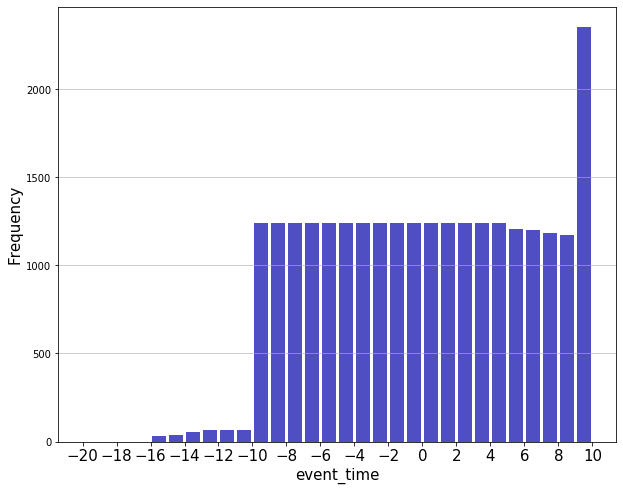

In [220]:
# Histogram of IMU_score_hat (for non-designated) and IMU Score (for designated counties)
plt.figure(figsize=[10,8])

n, bins, patches = plt.hist(x=county_with_designation['event_time'], bins=np.arange(-20, 11, 1), color='#0504aa',alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('event_time',fontsize=15)
plt.ylabel('Frequency',fontsize=15)
plt.xticks(np.arange(-20, 11, 2), fontsize=15)
#plt.xticks(np.arange(0,101,10))
#plt.yticks(fontsize=15)
#plt.title('Histogram of $IMU_{fs} = \hat{IMU}$ or $IMU$',fontsize=15)
#plt.savefig('images/imu_fs_histogram.png',bbox_inches='tight')
plt.show()

In [221]:
one_hot_enc = pd.get_dummies(county_with_designation['event_time'])
one_hot_enc

,-16.0,-15.0,-14.0,-13.0,-12.0,-11.0,-10.0,-9.0,-8.0,-7.0,...,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
64733,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
64734,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
64735,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [231]:
county_with_designation

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Skin,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year_x,MUA/P Status Description,MUA/P ID,Designated,Designation_year_max,event_time
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,1.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0.0,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0.0,13.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0.0,5.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0.0,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0.0,2.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN


In [222]:
balanced_event_study_dset = county_with_designation.join(one_hot_enc)
balanced_event_study_dset

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,0,0,0,0,0,0,0,0,0,0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0,0,0,0,0,0,0,0,0,0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,0,0,0,0,0,0,0,0,0,0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0,0,0,0,0,0,0,0,0,0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0,0,0,0,0,0,0,0,0,0
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0,0,0,0,0,0,0,0,0,0


In [223]:
balanced_event_study_dset = balanced_event_study_dset.join(pd.get_dummies(balanced_event_study_dset["year"]))
balanced_event_study_dset

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,0,0,0,0,0,0,0,0,0,0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0,0,0,0,0,0,0,0,0,0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,0,0,0,0,0,0,0,0,0,0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0,0,0,0,0,0,0,0,0,0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0,0,0,0,0,0,0,0,0,1
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,1
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,1
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0,0,0,0,0,0,0,0,0,1


In [224]:
balanced_event_study_dset["t_lt_-10"] = (balanced_event_study_dset["event_time"]<-10).astype(int)
balanced_event_study_dset["t_gt_4"] = (balanced_event_study_dset["event_time"]>4).astype(int)
balanced_event_study_dset

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,1981,1982,1983,1984,1985,1986,1987,1988,t_lt_-10,t_gt_4
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,0,0,0,0,0,0,0,0,0,0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0,0,0,0,0,0,0,0,0,0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,0,0,0,0,0,0,0,0,0,0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0,0,0,0,0,0,0,0,0,0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0,0,0,0,0,0,0,1,0,0
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,0,1,0,0
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,0,1,0,0
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0,0,0,0,0,0,0,1,0,0


In [225]:
balanced_event_study_dset = balanced_event_study_dset.join(pd.get_dummies(balanced_event_study_dset["county_fips"]))
balanced_event_study_dset

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,56027,56029,56031,56033,56035,56037,56039,56041,56043,56045
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,0,0,0,0,0,0,0,0,0,0
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,0,0,0,0,0,0,0,0,0,0
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,0,0,0,0,0,0,0,0,0,0
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,0,0,0,0,0,0,0,0,0,0
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,0,0,0,0,0,1,0,0,0,0
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,1,0,0,0
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,0,0,0,0,0,0,0,1,0,0
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,0,0,0,0,0,0,0,0,1,0


In [226]:
balanced_event_study_dset.shape

(64596, 3155)

In [227]:
for i in balanced_event_study_dset.columns[29:]:
    print(i)

-16.0
-15.0
-14.0
-13.0
-12.0
-11.0
-10.0
-9.0
-8.0
-7.0
-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
0.0
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
t_lt_-10
t_gt_4
01001
01003
01005
01007
01009
01011
01013
01015
01017
01019
01021
01023
01025
01027
01029
01031
01033
01035
01037
01039
01041
01043
01045
01047
01049
01051
01053
01055
01057
01059
01061
01063
01065
01067
01069
01071
01073
01075
01077
01079
01081
01083
01085
01087
01089
01091
01093
01095
01097
01099
01101
01103
01105
01107
01109
01111
01113
01115
01117
01119
01121
01123
01125
01127
01129
01131
01133
02900
04001
04003
04005
04007
04009
04011
04013
04015
04017
04019
04021
04023
04025
04027
05001
05003
05005
05007
05009
05011
05013
05015
05017
05019
05021
05023
05025
05027
05029
05031
05033
05035
05037
05039
05041
05043
05045
05047
05049
05051
05053
05055
05057
05059
05061
05063
05065
05067
05069
05071
05073
05075
05077
05079
05081
05083
050

29185
29186
29187
29189
29195
29197
29199
29201
29203
29205
29207
29209
29211
29213
29215
29217
29219
29221
29223
29225
29227
29229
29510
30001
30003
30005
30007
30009
30011
30013
30015
30017
30019
30021
30023
30025
30027
30029
30031
30033
30035
30037
30039
30041
30043
30045
30047
30049
30051
30053
30055
30057
30059
30061
30063
30065
30067
30069
30071
30073
30075
30077
30079
30081
30083
30085
30087
30089
30091
30093
30095
30097
30099
30101
30103
30105
30107
30109
30111
30113
31001
31003
31005
31007
31009
31011
31013
31015
31017
31019
31021
31023
31025
31027
31029
31031
31033
31035
31037
31039
31041
31043
31045
31047
31049
31051
31053
31055
31057
31059
31061
31063
31065
31067
31069
31071
31073
31075
31077
31079
31081
31083
31085
31087
31089
31091
31093
31095
31097
31099
31101
31103
31105
31107
31109
31111
31113
31115
31117
31119
31121
31123
31125
31127
31129
31131
31133
31135
31137
31139
31141
31143
31145
31147
31149
31151
31153
31155
31157
31159
31161
31163
31165
31167
31169
31171
3117

In [229]:
list_to_remove = list(np.arange(-16.0, -10.0, 1)) + list(np.arange(5.0, 11.0, 1)) + list({-1.0})
included_cols = list(set(balanced_event_study_dset.columns[29:]) - set(list_to_remove))
included_cols

[0.0,
 1.0,
 2.0,
 3.0,
 4.0,
 '17037',
 '01065',
 '33015',
 '13057',
 '13315',
 '21029',
 '37067',
 '40031',
 '31023',
 '48445',
 '12063',
 '27057',
 '49021',
 '20033',
 '54069',
 '55047',
 '22083',
 '38101',
 '21039',
 '41041',
 '01007',
 '48177',
 '32027',
 '47015',
 '47003',
 '05119',
 '34015',
 '19145',
 '05049',
 '19127',
 '31139',
 '28093',
 '12133',
 '13003',
 '38085',
 '27007',
 '55103',
 '19115',
 '12089',
 '13033',
 '37035',
 '48451',
 '19163',
 '48259',
 '29021',
 '51063',
 '06077',
 '09009',
 '42023',
 '55015',
 '48001',
 '06035',
 '27109',
 '42029',
 '31071',
 '51177',
 '39163',
 '41067',
 '53037',
 '22037',
 '20067',
 '19181',
 '17103',
 '19023',
 '20019',
 '42111',
 '17183',
 '17003',
 '27047',
 '26119',
 '35003',
 '26043',
 '39007',
 '13255',
 '20097',
 '47121',
 '08083',
 '49039',
 '54077',
 '06051',
 '23027',
 '30033',
 '45015',
 '45085',
 '30041',
 '22025',
 '27023',
 '36107',
 '13145',
 '29163',
 '51031',
 '12115',
 '40049',
 '30017',
 '19063',
 '39077',
 '20183',


In [230]:
len(balanced_event_study_dset.columns[29:]), len(included_cols)

(3126, 3113)

In [ ]:
balanced_event_study_dset[included_cols]

In [ ]:
for i in balanced_event_study_dset[included_cols]:
    print(i)

In [ ]:
balanced_event_study_dset.to_csv("output/balanced_event_study_dset.csv", index=False)

In [418]:
# Running the OLS regression of IMU_diff on physicians_per_1000_population
Y = balanced_event_study_dset['num_deaths']/balanced_event_study_dset['total_population']
X = balanced_event_study_dset[included_cols[0:10]]
X = sm.add_constant(X)

ols_model = sm.OLS(Y, X)
ols_results = ols_model.fit()

ols_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Fri, 30 Apr 2021   Prob (F-statistic):                nan
Time:                        20:46:20   Log-Likelihood:                    nan
No. Observations:               64596   AIC:                               nan
Df Residuals:                   64585   BIC:                               nan
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const             nan        nan        nan        nan         nan         nan
0.0               nan        nan        nan        nan         nan         nan
1.0               nan        nan        nan        nan         nan         nan
2.0               nan        nan        nan        nan         nan         nan
3.0               nan        nan        nan        nan         nan         nan
4.0               nan        nan        nan        nan         nan         nan
12083             nan        nan        nan        nan         nan         nan
18165             nan        nan        nan        nan         nan         nan
22081             nan        nan        nan        nan         nan         nan
32033             nan        nan        nan        nan         nan         nan
39021             nan        nan        nan        nan         nan         nan
==============================================================================
Omnibus:                          nan   Durbin-Watson:                     nan
Prob(Omnibus):                    nan   Jarque-Bera (JB):                  nan
Skew:                             nan   Prob(JB):                          nan
Kurtosis:                         nan   Cond. No.                         55.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Creating balanced event study dataset based on CDC wonder data

In [242]:
cdc_county = pd.read_csv("input/CDC/cdc_wonder_clpse_year_county_1968-1978.txt", delimiter="\t", dtype={'County Code': str})
cdc_county = pd.concat([cdc_county, pd.read_csv("input/CDC/cdc_wonder_clpse_year_county_1979-1987.txt", delimiter="\t", dtype={'County Code': str}), pd.read_csv("input/CDC/cdc_wonder_clpse_year_county_1988-1998.txt", delimiter="\t", dtype={'County Code': str})], ignore_index=True)
cdc_county

,Notes,Year,Year Code,County,County Code,Deaths,Population,Crude Rate
0,NaN,1968.0,1968.0,"Autauga County, AL",01001,226,23214,973.55
1,NaN,1968.0,1968.0,"Baldwin County, AL",01003,507,58489,866.83
2,NaN,1968.0,1968.0,"Barbour County, AL",01005,306,21910,1396.62
3,NaN,1968.0,1968.0,"Bibb County, AL",01007,169,13698,1233.76
4,NaN,1968.0,1968.0,"Blount County, AL",01009,253,25588,988.74
...,...,...,...,...,...,...,...,...
96921,given time period. More information: http://wo...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96922,25. Population figures in this table for 1979 ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96923,United States. Note that the state and county ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96924,The population figures in this table for 1980 ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [243]:
cdc_county = cdc_county[cdc_county["County Code"].notnull()]
cdc_county

,Notes,Year,Year Code,County,County Code,Deaths,Population,Crude Rate
0,NaN,1968.0,1968.0,"Autauga County, AL",01001,226,23214,973.55
1,NaN,1968.0,1968.0,"Baldwin County, AL",01003,507,58489,866.83
2,NaN,1968.0,1968.0,"Barbour County, AL",01005,306,21910,1396.62
3,NaN,1968.0,1968.0,"Bibb County, AL",01007,169,13698,1233.76
4,NaN,1968.0,1968.0,"Blount County, AL",01009,253,25588,988.74
...,...,...,...,...,...,...,...,...
96823,NaN,1998.0,1998.0,"Sweetwater County, WY",56037,240,38621,621.42
96824,NaN,1998.0,1998.0,"Teton County, WY",56039,64,16859,379.62
96825,NaN,1998.0,1998.0,"Uinta County, WY",56041,84,20036,419.25
96826,NaN,1998.0,1998.0,"Washakie County, WY",56043,95,8588,1106.19


In [247]:
cdc_county.groupby("Year").count()

,Notes,Year Code,County,County Code,Deaths,Population,Crude Rate
Year,,,,,,,
1968.0,0,3080,3080,3080,3080,3080,3080
1969.0,0,3080,3080,3080,3080,3080,3080
1970.0,0,3080,3080,3080,3080,3080,3080
1971.0,0,3080,3080,3080,3080,3080,3080
1972.0,0,3080,3080,3080,3080,3080,3080
1973.0,0,3080,3080,3080,3080,3080,3080
1974.0,0,3080,3080,3080,3080,3080,3080
1975.0,0,3080,3080,3080,3080,3080,3080
1976.0,0,3080,3080,3080,3080,3080,3080


In [248]:
cdc_county_1989_1998 = cdc_county[(cdc_county["Year"]>1988) & (cdc_county["Year"]<=1998)]
cdc_county_1989_1998

,Notes,Year,Year Code,County,County Code,Deaths,Population,Crude Rate
65359,NaN,1989.0,1989.0,"Autauga County, AL",01001,259,34039,760.89
65360,NaN,1989.0,1989.0,"Baldwin County, AL",01003,862,96266,895.44
65361,NaN,1989.0,1989.0,"Barbour County, AL",01005,272,25364,1072.39
65362,NaN,1989.0,1989.0,"Bibb County, AL",01007,161,16390,982.31
65363,NaN,1989.0,1989.0,"Blount County, AL",01009,402,38749,1037.45
...,...,...,...,...,...,...,...,...
96823,NaN,1998.0,1998.0,"Sweetwater County, WY",56037,240,38621,621.42
96824,NaN,1998.0,1998.0,"Teton County, WY",56039,64,16859,379.62
96825,NaN,1998.0,1998.0,"Uinta County, WY",56041,84,20036,419.25
96826,NaN,1998.0,1998.0,"Washakie County, WY",56043,95,8588,1106.19


In [259]:
county_with_designation.columns

Index(['year', 'county_fips', 'total_population', 'num_deaths',
       'Circulatory system', 'Conginetal', 'Diseases of the blood',
       'Endocrin or Nutrition', 'Gastrointestinal', 'Geneto-urinary',
       'Infectious diseases', 'Injury', 'Mental disorders', 'Musculoskeletal',
       'Neoplasm', 'Nervous system', 'Perinatal', 'Pregnancy',
       'Respiratory system', 'Skin', 'Symptoms and signs',
       'Medically Underserved Area/Population (MUA/P) Withdrawal Date',
       'Common State County FIPS Code', 'Designation_year_x',
       'MUA/P Status Description', 'MUA/P ID', 'Designated',
       'Designation_year_max', 'event_time'],
      dtype='object')

In [253]:
counties_included = set(county_with_designation["county_fips"])
counties_included

{'17037',
 '01065',
 '33015',
 '13057',
 '13315',
 '21029',
 '37067',
 '40031',
 '31023',
 '48445',
 '12063',
 '27057',
 '49021',
 '20033',
 '54069',
 '55047',
 '22083',
 '38101',
 '21039',
 '41041',
 '01007',
 '48177',
 '32027',
 '47015',
 '47003',
 '05119',
 '34015',
 '19145',
 '05049',
 '19127',
 '31139',
 '28093',
 '12133',
 '13003',
 '38085',
 '27007',
 '55103',
 '19115',
 '12089',
 '13033',
 '37035',
 '48451',
 '19163',
 '48259',
 '29021',
 '51063',
 '06077',
 '09009',
 '42023',
 '55015',
 '48001',
 '06035',
 '27109',
 '42029',
 '31071',
 '51177',
 '39163',
 '41067',
 '53037',
 '22037',
 '20067',
 '19181',
 '17103',
 '19023',
 '20019',
 '42111',
 '17183',
 '17003',
 '27047',
 '18165',
 '26119',
 '35003',
 '26043',
 '39007',
 '13255',
 '20097',
 '47121',
 '08083',
 '49039',
 '54077',
 '06051',
 '23027',
 '30033',
 '45015',
 '45085',
 '30041',
 '22025',
 '27023',
 '36107',
 '13145',
 '29163',
 '51031',
 '12115',
 '40049',
 '30017',
 '19063',
 '39077',
 '20183',
 '06045',
 '13249',


In [283]:
cdc_county_1989_1998_incl = cdc_county_1989_1998[cdc_county_1989_1998["County Code"].isin(counties_included)]
cdc_county_1989_1998_incl

,Notes,Year,Year Code,County,County Code,Deaths,Population,Crude Rate
65359,NaN,1989.0,1989.0,"Autauga County, AL",01001,259,34039,760.89
65360,NaN,1989.0,1989.0,"Baldwin County, AL",01003,862,96266,895.44
65361,NaN,1989.0,1989.0,"Barbour County, AL",01005,272,25364,1072.39
65362,NaN,1989.0,1989.0,"Bibb County, AL",01007,161,16390,982.31
65363,NaN,1989.0,1989.0,"Blount County, AL",01009,402,38749,1037.45
...,...,...,...,...,...,...,...,...
96823,NaN,1998.0,1998.0,"Sweetwater County, WY",56037,240,38621,621.42
96824,NaN,1998.0,1998.0,"Teton County, WY",56039,64,16859,379.62
96825,NaN,1998.0,1998.0,"Uinta County, WY",56041,84,20036,419.25
96826,NaN,1998.0,1998.0,"Washakie County, WY",56043,95,8588,1106.19


In [284]:
cdc_county_1989_1998_incl

,Notes,Year,Year Code,County,County Code,Deaths,Population,Crude Rate
65359,NaN,1989.0,1989.0,"Autauga County, AL",01001,259,34039,760.89
65360,NaN,1989.0,1989.0,"Baldwin County, AL",01003,862,96266,895.44
65361,NaN,1989.0,1989.0,"Barbour County, AL",01005,272,25364,1072.39
65362,NaN,1989.0,1989.0,"Bibb County, AL",01007,161,16390,982.31
65363,NaN,1989.0,1989.0,"Blount County, AL",01009,402,38749,1037.45
...,...,...,...,...,...,...,...,...
96823,NaN,1998.0,1998.0,"Sweetwater County, WY",56037,240,38621,621.42
96824,NaN,1998.0,1998.0,"Teton County, WY",56039,64,16859,379.62
96825,NaN,1998.0,1998.0,"Uinta County, WY",56041,84,20036,419.25
96826,NaN,1998.0,1998.0,"Washakie County, WY",56043,95,8588,1106.19


In [287]:
# Mortality rate based on per 1000 population
county_with_designation["mortality_rate"] = county_with_designation["num_deaths"]/county_with_designation["total_population"] * 100000
county_with_designation

,year,county_fips,total_population,num_deaths,Circulatory system,Conginetal,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Symptoms and signs,Medically Underserved Area/Population (MUA/P) Withdrawal Date,Common State County FIPS Code,Designation_year_x,MUA/P Status Description,MUA/P ID,Designated,Designation_year_max,event_time,mortality_rate
0,1968,01001,23214,226.0,117.0,0.0,0.0,1.0,4.0,6.0,...,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0,973.550444
1,1968,01003,58489,507.0,272.0,1.0,0.0,13.0,17.0,8.0,...,26.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0,866.829660
2,1968,01005,21910,306.0,167.0,2.0,1.0,3.0,13.0,4.0,...,13.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,1396.622547
3,1968,01007,13698,169.0,86.0,1.0,1.0,2.0,3.0,7.0,...,13.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0,1233.756753
4,1968,01009,25588,253.0,140.0,2.0,1.0,5.0,4.0,5.0,...,5.0,NaN,NaN,NaN,NaN,NaN,0,1978.0,-10.0,988.744724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64732,1988,56037,39948,168.0,66.0,1.0,0.0,4.0,10.0,2.0,...,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,420.546711
64733,1988,56039,10655,56.0,23.0,1.0,0.0,2.0,3.0,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,525.574847
64734,1988,56041,19551,79.0,29.0,0.0,0.0,2.0,3.0,0.0,...,1.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,404.071403
64735,1988,56043,8840,69.0,33.0,0.0,0.0,4.0,1.0,3.0,...,2.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,780.542986


In [291]:
# Rename columns to match `county_with_designation` df
cdc_county_1989_1998_incl.rename(columns = {"County Code" : "county_fips", "Deaths" : "num_deaths", "Crude Rate" : "mortality_rate", "Year": "year"}, inplace=True)
cdc_county_1989_1998_incl["year"] = cdc_county_1989_1998_incl["year"].astype(float).astype(int).astype(str)
cdc_county_1989_1998_incl

,Notes,year,Year Code,County,county_fips,num_deaths,Population,mortality_rate
65359,NaN,1989,1989.0,"Autauga County, AL",01001,259,34039,760.89
65360,NaN,1989,1989.0,"Baldwin County, AL",01003,862,96266,895.44
65361,NaN,1989,1989.0,"Barbour County, AL",01005,272,25364,1072.39
65362,NaN,1989,1989.0,"Bibb County, AL",01007,161,16390,982.31
65363,NaN,1989,1989.0,"Blount County, AL",01009,402,38749,1037.45
...,...,...,...,...,...,...,...,...
96823,NaN,1998,1998.0,"Sweetwater County, WY",56037,240,38621,621.42
96824,NaN,1998,1998.0,"Teton County, WY",56039,64,16859,379.62
96825,NaN,1998,1998.0,"Uinta County, WY",56041,84,20036,419.25
96826,NaN,1998,1998.0,"Washakie County, WY",56043,95,8588,1106.19


In [294]:
county_with_designation_extended = pd.concat([county_with_designation, cdc_county_1989_1998_incl[["year", "num_deaths", "county_fips", "mortality_rate"]]], ignore_index=True)
county_with_designation_extended

,Circulatory system,Common State County FIPS Code,Conginetal,Designated,Designation_year_max,Designation_year_x,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Pregnancy,Respiratory system,Skin,Symptoms and signs,county_fips,event_time,mortality_rate,num_deaths,total_population,year
0,117.0,NaN,0.0,0.0,1978.0,NaN,0.0,1.0,4.0,6.0,...,0.0,9.0,1.0,26.0,01001,-10.0,973.55,226,23214.0,1968
1,272.0,NaN,1.0,0.0,1978.0,NaN,0.0,13.0,17.0,8.0,...,0.0,31.0,0.0,26.0,01003,-10.0,866.83,507,58489.0,1968
2,167.0,NaN,2.0,0.0,NaN,NaN,1.0,3.0,13.0,4.0,...,1.0,22.0,0.0,13.0,01005,NaN,1396.62,306,21910.0,1968
3,86.0,NaN,1.0,0.0,1978.0,NaN,1.0,2.0,3.0,7.0,...,0.0,3.0,0.0,13.0,01007,-10.0,1233.76,169,13698.0,1968
4,140.0,NaN,2.0,0.0,1978.0,NaN,1.0,5.0,4.0,5.0,...,0.0,9.0,0.0,5.0,01009,-10.0,988.745,253,25588.0,1968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95341,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,56037,NaN,621.42,240,NaN,1998
95342,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,56039,NaN,379.62,64,NaN,1998
95343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,56041,NaN,419.25,84,NaN,1998
95344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,56043,NaN,1106.19,95,NaN,1998


In [297]:
county_with_designation_extended.groupby("year").count()

,Circulatory system,Common State County FIPS Code,Conginetal,Designated,Designation_year_max,Designation_year_x,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,Perinatal,Pregnancy,Respiratory system,Skin,Symptoms and signs,county_fips,event_time,mortality_rate,num_deaths,total_population
year,,,,,,,,,,,,,,,,,,,,,
1968,3076,0,3076,3076,1240,0,3076,3076,3076,3076,...,3076,3076,3076,3076,3076,3076,1240,3076,3076,3076
1969,3075,0,3075,3076,1240,0,3075,3075,3075,3075,...,3075,3075,3075,3075,3075,3076,1240,3075,3075,3076
1970,3074,0,3074,3076,1240,0,3074,3074,3074,3074,...,3074,3074,3074,3074,3074,3076,1240,3074,3074,3076
1971,3075,0,3075,3076,1240,0,3075,3075,3075,3075,...,3075,3075,3075,3075,3075,3076,1240,3075,3075,3076
1972,3073,0,3073,3076,1240,0,3073,3073,3073,3073,...,3073,3073,3073,3073,3073,3076,1240,3073,3073,3076
1973,3076,0,3076,3076,1240,0,3076,3076,3076,3076,...,3076,3076,3076,3076,3076,3076,1240,3076,3076,3076
1974,3076,0,3076,3076,1240,0,3076,3076,3076,3076,...,3076,3076,3076,3076,3076,3076,1240,3076,3076,3076
1975,3075,0,3075,3076,1240,0,3075,3075,3075,3075,...,3075,3075,3075,3075,3075,3076,1240,3075,3075,3076
1976,3075,0,3075,3076,1240,0,3075,3075,3075,3075,...,3075,3075,3075,3075,3075,3076,1240,3075,3075,3076


In [302]:
new_dset.columns

Index(['State', 'State_Abbr', 'County', 'imu_subscore_4', 'num_physicians',
       'physicians_per_1000_population', 'county_fips', 'live_births',
       'infant_deaths', 'infant_mortality_rate', 'imu_subscore_2',
       'persons_in_poverty_1970', 'total_population', 'imu_subscore_1',
       'age_65_and_above', 'imu_subscore_3', 'imu_score_hat', 'is_MUA_hat',
       'SMSAA', 'Common State County FIPS Code', 'MUA/P Status Description',
       'IMU Score', 'is_MUA', 'imu_score_hat_ceil', 'TP', 'FP', 'TN', 'FN',
       'class', 'NAME', 'is_MUA_new', 'FIPS', 'imu_fs', 'imu_ceil',
       'imu_ceil_new'],
      dtype='object')

In [319]:
# Original dataset to be joined
to_be_joined = final_df_merged[["IMU Score", "imu_score_hat", "is_MUA_hat", "is_MUA", "county_fips", "SMSAA"]]
to_be_joined

,IMU Score,imu_score_hat,is_MUA_hat,is_MUA,county_fips,SMSAA
0,NaN,42.3,1,0,01001,NaN
1,NaN,51.6,1,0,01003,5160.0
2,NaN,43.8,1,0,01005,NaN
3,47.7,37.4,1,1,01007,NaN
4,56.1,50.1,1,1,01009,NaN
...,...,...,...,...,...,...
3072,NaN,75.2,0,0,56037,NaN
3073,NaN,94.8,0,0,56039,NaN
3074,NaN,95.0,0,0,56041,NaN
3075,NaN,74.7,0,0,56043,NaN


In [320]:
complete_balanced_dataset = county_with_designation_extended.merge(to_be_joined, on="county_fips")
complete_balanced_dataset

,Circulatory system,Common State County FIPS Code,Conginetal,Designated,Designation_year_max,Designation_year_x,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,event_time,mortality_rate,num_deaths,total_population,year,IMU Score,imu_score_hat,is_MUA_hat,is_MUA,SMSAA
0,117.0,NaN,0.0,0.0,1978.0,NaN,0.0,1.0,4.0,6.0,...,-10.0,973.55,226,23214.0,1968,NaN,42.3,1,0,NaN
1,98.0,NaN,1.0,0.0,1978.0,NaN,1.0,2.0,6.0,6.0,...,-9.0,800.671,191,23855.0,1969,NaN,42.3,1,0,NaN
2,99.0,NaN,4.0,0.0,1978.0,NaN,0.0,4.0,2.0,5.0,...,-8.0,832.347,204,24509.0,1970,NaN,42.3,1,0,NaN
3,100.0,NaN,4.0,0.0,1978.0,NaN,0.0,7.0,12.0,3.0,...,-7.0,897.335,229,25520.0,1971,NaN,42.3,1,0,NaN
4,96.0,NaN,2.0,0.0,1978.0,NaN,2.0,6.0,6.0,6.0,...,-6.0,757.075,206,27210.0,1972,NaN,42.3,1,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95258,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,895.12,60,NaN,1994,NaN,58.9,1,0,NaN
95259,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,983.31,66,NaN,1995,NaN,58.9,1,0,NaN
95260,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,795.76,54,NaN,1996,NaN,58.9,1,0,NaN
95261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,891.80,60,NaN,1997,NaN,58.9,1,0,NaN


In [323]:
complete_balanced_dataset.groupby("year").count()

,Circulatory system,Common State County FIPS Code,Conginetal,Designated,Designation_year_max,Designation_year_x,Diseases of the blood,Endocrin or Nutrition,Gastrointestinal,Geneto-urinary,...,county_fips,event_time,mortality_rate,num_deaths,total_population,IMU Score,imu_score_hat,is_MUA_hat,is_MUA,SMSAA
year,,,,,,,,,,,,,,,,,,,,,
1968,3073,0,3073,3073,1242,0,3073,3073,3073,3073,...,3073,1242,3073,3073,3073,1003,3073,3073,3073,440
1969,3072,0,3072,3073,1242,0,3072,3072,3072,3072,...,3073,1242,3072,3072,3073,1003,3073,3073,3073,440
1970,3072,0,3072,3073,1242,0,3072,3072,3072,3072,...,3073,1242,3072,3072,3073,1003,3073,3073,3073,440
1971,3073,0,3073,3073,1242,0,3073,3073,3073,3073,...,3073,1242,3073,3073,3073,1003,3073,3073,3073,440
1972,3071,0,3071,3073,1242,0,3071,3071,3071,3071,...,3073,1242,3071,3071,3073,1003,3073,3073,3073,440
1973,3073,0,3073,3073,1242,0,3073,3073,3073,3073,...,3073,1242,3073,3073,3073,1003,3073,3073,3073,440
1974,3073,0,3073,3073,1242,0,3073,3073,3073,3073,...,3073,1242,3073,3073,3073,1003,3073,3073,3073,440
1975,3073,0,3073,3073,1242,0,3073,3073,3073,3073,...,3073,1242,3073,3073,3073,1003,3073,3073,3073,440
1976,3073,0,3073,3073,1242,0,3073,3073,3073,3073,...,3073,1242,3073,3073,3073,1003,3073,3073,3073,440


In [324]:
# num_counties * 31
3073 * 31

95263

In [325]:
len(complete_balanced_dataset)

95263

In [326]:
complete_balanced_dataset.to_csv("output/complete_balanced_event_study_dset.csv", index=False)